In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.lines as mlines
from collections import Counter
import numpy as np
from scipy import stats
from utils import (
    get_chord_diagram,
    get_normalized_norm,
    get_actual_survey_data_info,
    get_generated_survey_data_info,
    get_transient_prob_1,
    get_transient_prob_2,
    # get_transient_prob_3,
    # get_transient_prob_4,
    # get_transient_prob_5,
    plot_table_inter_city_norm_2,
    # create_plots_for_destination_prob,
    plotting_the_dendogram,
    plotting_the_dendogram_JS

)
# from sklearn.linear_model import LinearRegression
# from sklearn.metrics import r2_score
from scipy.spatial import distance
from scipy.stats import ttest_ind, levene
from sklearn.cluster import KMeans, AgglomerativeClustering
import scipy.cluster.hierarchy as sch
%load_ext autoreload
%autoreload 2

In [2]:
def get_transient_destination_probabilities(order=1):
    m_cities = {
        'SF_orig': eval(f't_orig_prob_{order}_sf'),
        'Gemini': eval(f't_prob_{order}_sf_gemini'),
        'Llama': eval(f't_prob_{order}_sf_llama'),
        'GPT-4': eval(f't_prob_{order}_sf_gpt4'),
        'Simulated': eval(f't_prob_{order}_sf_sim'),
    }

    res = {}
    for name, m in m_cities.items():
        vals = m.sum(0).to_dict()
        res[name] = vals
    res = pd.DataFrame(res)
    cols = [
        "Home",
        "Work",
        "Restaurant",
        "School",
        "Recreation",
        "Other",
    ]
    res.index = cols
    res = res / res.sum()
    return res

In [3]:
def get_datadf_from_transient_probs(order=1, model='gemini'):
    data = {
        'SF_Original': [
            0,
            '',
            '',
            '',
            '',
            '',
            '',
            '',
            '',
            '',
        ],
        'SF_Generated': [
            round(
                get_normalized_norm(
                    eval(f't_orig_prob_{order}_sf'),
                    eval(f't_prob_{order}_sf_{model}')
                ),
                5
            ),
            0,
            '',
            '',
            '',
            '',
            '',
            '',
            '',
            '',
        ],
        'DC_Original': [
            round(
                get_normalized_norm(
                    eval(f't_orig_prob_{order}_sf'),
                    eval(f't_orig_prob_{order}_dc'),
                ),
                5
            ),
            round(
                get_normalized_norm(
                    eval(f't_prob_{order}_sf_{model}'),
                    eval(f't_orig_prob_{order}_dc'),
                ),
                5
            ),
            0,
            '',
            '',
            '',
            '',
            '',
            '',
            '',
        ],
        'DC_Generated': [
            round(
                get_normalized_norm(
                    eval(f't_orig_prob_{order}_sf'),
                    eval(f't_prob_{order}_dc_{model}'),
                ),
                5
            ),
            round(
                get_normalized_norm(
                    eval(f't_prob_{order}_sf_{model}'),
                    eval(f't_prob_{order}_dc_{model}'),
                ),
                5
            ),
            round(
                get_normalized_norm(
                    eval(f't_orig_prob_{order}_dc'),
                    eval(f't_prob_{order}_dc_{model}'),
                ),
                5
            ),
            0,
            '',
            '',
            '',
            '',
            '',
            '',
        ],
        'DFW_Original': [
            round(
                get_normalized_norm(
                    eval(f't_orig_prob_{order}_sf'),
                    eval(f't_orig_prob_{order}_dfw'),
                ),
                5
            ),
            round(
                get_normalized_norm(
                    eval(f't_prob_{order}_sf_{model}'),
                    eval(f't_orig_prob_{order}_dfw'),
                ),
                5
            ),
            round(
                get_normalized_norm(
                    eval(f't_orig_prob_{order}_dc'),
                    eval(f't_orig_prob_{order}_dfw'),
                ),
                5
            ),
            round(
                get_normalized_norm(
                    eval(f't_prob_{order}_dc_{model}'),
                    eval(f't_orig_prob_{order}_dfw'),
                ),
                5
            ),
            0,
            '',
            '',
            '',
            '',
            '',
        ],
        'DFW_Generated': [
            round(
                get_normalized_norm(
                    eval(f't_orig_prob_{order}_sf'),
                    eval(f't_prob_{order}_dfw_{model}'),
                ),
                5
            ),
            round(
                get_normalized_norm(
                    eval(f't_prob_{order}_sf_{model}'),
                    eval(f't_prob_{order}_dfw_{model}'),
                ),
                5
            ),
            round(
                get_normalized_norm(
                    eval(f't_orig_prob_{order}_dc'),
                    eval(f't_prob_{order}_dfw_{model}'),
                ),
                5
            ),
            round(
                get_normalized_norm(
                    eval(f't_prob_{order}_dc_{model}'),
                    eval(f't_prob_{order}_dfw_{model}'),
                ),
                5
            ),
            round(
                get_normalized_norm(
                    eval(f't_prob_{order}_dfw_{model}'),
                    eval(f't_orig_prob_{order}_dfw'),
                ),
                5
            ),
            0,
            '',
            '',
            '',
            '',
        ],
        'LA_Original': [
            round(
                get_normalized_norm(
                    eval(f't_orig_prob_{order}_sf'),
                    eval(f't_orig_prob_{order}_la'),
                ),
                5
            ),
            round(
                get_normalized_norm(
                    eval(f't_prob_{order}_sf_{model}'),
                    eval(f't_orig_prob_{order}_la'),
                ),
                5
            ),
            round(
                get_normalized_norm(
                    eval(f't_orig_prob_{order}_dc'),
                    eval(f't_orig_prob_{order}_la'),
                ),
                5
            ),
            round(
                get_normalized_norm(
                    eval(f't_prob_{order}_dc_{model}'),
                    eval(f't_orig_prob_{order}_la'),
                ),
                5
            ),
            round(
                get_normalized_norm(
                    eval(f't_orig_prob_{order}_dfw'),
                    eval(f't_orig_prob_{order}_la'),
                ),
                5
            ),
            round(
                get_normalized_norm(
                    eval(f't_prob_{order}_dfw_{model}'),
                    eval(f't_orig_prob_{order}_la'),
                ),
                5
            ),
            0,
            '',
            '',
            '',
        ],
        'LA_Generated': [
            round(
                get_normalized_norm(
                    eval(f't_orig_prob_{order}_sf'),
                    eval(f't_prob_{order}_la_{model}'),
                ),
                5
            ),
            round(
                get_normalized_norm(
                    eval(f't_prob_{order}_sf_{model}'),
                    eval(f't_prob_{order}_la_{model}'),
                ),
                5
            ),
            round(
                get_normalized_norm(
                    eval(f't_orig_prob_{order}_dc'),
                    eval(f't_prob_{order}_la_{model}'),
                ),
                5
            ),
            round(
                get_normalized_norm(
                    eval(f't_prob_{order}_dc_{model}'),
                    eval(f't_prob_{order}_la_{model}'),
                ),
                5
            ),
            round(
                get_normalized_norm(
                    eval(f't_orig_prob_{order}_dfw'),
                    eval(f't_prob_{order}_la_{model}'),
                ),
                5
            ),
            round(
                get_normalized_norm(
                    eval(f't_prob_{order}_dfw_{model}'),
                    eval(f't_prob_{order}_la_{model}'),
                ),
                5
            ),
            round(
                get_normalized_norm(
                    eval(f't_orig_prob_{order}_la'),
                    eval(f't_prob_{order}_la_{model}'),
                ),
                5
            ),
            '',
            '',
            '',
        ],
        'Minneapolis_Original': [
            round(
                get_normalized_norm(
                    eval(f't_orig_prob_{order}_sf'),
                    eval(f't_orig_prob_{order}_minneapolis'),
                ),
                5
            ),
            round(
                get_normalized_norm(
                    eval(f't_prob_{order}_sf_{model}'),
                    eval(f't_orig_prob_{order}_minneapolis'),
                ),
                5
            ),
            round(
                get_normalized_norm(
                    eval(f't_orig_prob_{order}_dc'),
                    eval(f't_orig_prob_{order}_minneapolis'),
                ),
                5
            ),
            round(
                get_normalized_norm(
                    eval(f't_prob_{order}_dc_{model}'),
                    eval(f't_orig_prob_{order}_minneapolis'),
                ),
                5
            ),
            round(
                get_normalized_norm(
                    eval(f't_orig_prob_{order}_dfw'),
                    eval(f't_orig_prob_{order}_minneapolis'),
                ),
                5
            ),
            round(
                get_normalized_norm(
                    eval(f't_prob_{order}_dfw_{model}'),
                    eval(f't_orig_prob_{order}_minneapolis'),
                ),
                5
            ),
            round(
                get_normalized_norm(
                    eval(f't_orig_prob_{order}_la'),
                    eval(f't_orig_prob_{order}_minneapolis'),
                ),
                5
            ),
            round(
                get_normalized_norm(
                    eval(f't_prob_{order}_la_{model}'),
                    eval(f't_orig_prob_{order}_minneapolis'),
                ),
                5
            ),
            0,
            '',
        ],
        'Minneapolis_Generated': [
            round(
                get_normalized_norm(
                    eval(f't_orig_prob_{order}_sf'),
                    eval(f't_prob_{order}_minneapolis_{model}'),
                ),
                5
            ),
            round(
                get_normalized_norm(
                    eval(f't_prob_{order}_sf_{model}'),
                    eval(f't_prob_{order}_minneapolis_{model}'),
                ),
                5
            ),
            round(
                get_normalized_norm(
                    eval(f't_orig_prob_{order}_dc'),
                    eval(f't_prob_{order}_minneapolis_{model}'),
                ),
                5
            ),
            round(
                get_normalized_norm(
                    eval(f't_prob_{order}_dc_{model}'),
                    eval(f't_prob_{order}_minneapolis_{model}'),
                ),
                5
            ),
            round(
                get_normalized_norm(
                    eval(f't_orig_prob_{order}_dfw'),
                    eval(f't_prob_{order}_minneapolis_{model}'),
                ),
                5
            ),
            round(
                get_normalized_norm(
                    eval(f't_prob_{order}_dfw_{model}'),
                    eval(f't_prob_{order}_minneapolis_{model}'),
                ),
                5
            ),
            round(
                get_normalized_norm(
                    eval(f't_orig_prob_{order}_la'),
                    eval(f't_prob_{order}_minneapolis_{model}'),
                ),
                5
            ),
            round(
                get_normalized_norm(
                    eval(f't_prob_{order}_la_{model}'),
                    eval(f't_prob_{order}_minneapolis_{model}'),
                ),
                5
            ),
            round(
                get_normalized_norm(
                    eval(f't_orig_prob_{order}_minneapolis'),
                    eval(f't_prob_{order}_minneapolis_{model}'),
                ),
                5
            ),
            '',
        ]
    }
    cell_colours = [
        ['white', 'lightcoral', 'lightgreen', 'cyan', 'lightgreen', 'cyan', 'lightgreen', 'cyan', 'lightgreen', 'cyan'],  # noqa: E501
        ['white', 'white', 'cyan', 'orange', 'cyan', 'orange', 'cyan', 'orange', 'cyan', 'orange'],  # noqa: E501
        ['white', 'white', 'white', 'lightcoral', 'lightgreen', 'cyan', 'lightgreen', 'cyan', 'lightgreen', 'cyan'],  # noqa: E501
        ['white', 'white', 'white', 'white', 'cyan', 'orange', 'cyan', 'orange', 'cyan', 'orange'],  # noqa: E501
        ['white', 'white', 'white', 'white', 'white', 'lightcoral', 'lightgreen', 'cyan', 'lightgreen', 'cyan'],  # noqa: E501
        ['white', 'white', 'white', 'white', 'white', 'white', 'cyan', 'orange', 'cyan', 'orange'],  # noqa: E501
        ['white', 'white', 'white', 'white', 'white', 'white', 'white', 'lightcoral', 'lightgreen', 'cyan'],  # noqa: E501
        ['white', 'white', 'white', 'white', 'white', 'white', 'white', 'white', 'cyan', 'orange'],  # noqa: E501
        ['white', 'white', 'white', 'white', 'white', 'white', 'white', 'white', 'white', 'lightcoral'],  # noqa: E501
        ['white', 'white', 'white', 'white', 'white', 'white', 'white', 'white', 'white', 'white'],  # noqa: E501
    ]

    datadf = pd.DataFrame(data, index=data.keys())

    SOG = [datadf.values[i][j] for i, j in list(zip(*np.where(np.array(cell_colours) == 'lightcoral')))]  # noqa: E501
    DOO = [datadf.values[i][j] for i, j in list(zip(*np.where(np.array(cell_colours) == 'lightgreen')))]  # noqa: E501
    DOG = [datadf.values[i][j] for i, j in list(zip(*np.where(np.array(cell_colours) == 'cyan')))]  # noqa: E501
    DGG = [datadf.values[i][j] for i, j in list(zip(*np.where(np.array(cell_colours) == 'orange')))]  # noqa: E501

    datadf
    return SOG, DOO, DOG, DGG, datadf


def get_datadf_from_transient_probs_JS(order=1, model='gemini'):
    data = {
        'SF_Original': [
            0,
            '',
            '',
            '',
            '',
            '',
            '',
            '',
            '',
            '',
        ],
        'SF_Generated': [
            np.round(
                distance.jensenshannon(
                    eval(f't_orig_prob_{order}_sf'),
                    eval(f't_prob_{order}_sf_{model}')
                ).mean(),
                5
            ),
            0,
            '',
            '',
            '',
            '',
            '',
            '',
            '',
            '',
        ],
        'DC_Original': [
            np.round(
                distance.jensenshannon(
                    eval(f't_orig_prob_{order}_sf'),
                    eval(f't_orig_prob_{order}_dc'),
                ).mean(),
                5
            ),
            np.round(
                distance.jensenshannon(
                    eval(f't_prob_{order}_sf_{model}'),
                    eval(f't_orig_prob_{order}_dc'),
                ).mean(),
                5
            ),
            0,
            '',
            '',
            '',
            '',
            '',
            '',
            '',
        ],
        'DC_Generated': [
            np.round(
                distance.jensenshannon(
                    eval(f't_orig_prob_{order}_sf'),
                    eval(f't_prob_{order}_dc_{model}'),
                ).mean(),
                5
            ),
            np.round(
                distance.jensenshannon(
                    eval(f't_prob_{order}_sf_{model}'),
                    eval(f't_prob_{order}_dc_{model}'),
                ).mean(),
                5
            ),
            np.round(
                distance.jensenshannon(
                    eval(f't_orig_prob_{order}_dc'),
                    eval(f't_prob_{order}_dc_{model}'),
                ).mean(),
                5
            ),
            0,
            '',
            '',
            '',
            '',
            '',
            '',
        ],
        'DFW_Original': [
            np.round(
                distance.jensenshannon(
                    eval(f't_orig_prob_{order}_sf'),
                    eval(f't_orig_prob_{order}_dfw'),
                ).mean(),
                5
            ),
            np.round(
                distance.jensenshannon(
                    eval(f't_prob_{order}_sf_{model}'),
                    eval(f't_orig_prob_{order}_dfw'),
                ).mean(),
                5
            ),
            np.round(
                distance.jensenshannon(
                    eval(f't_orig_prob_{order}_dc'),
                    eval(f't_orig_prob_{order}_dfw'),
                ).mean(),
                5
            ),
            np.round(
                distance.jensenshannon(
                    eval(f't_prob_{order}_dc_{model}'),
                    eval(f't_orig_prob_{order}_dfw'),
                ).mean(),
                5
            ),
            0,
            '',
            '',
            '',
            '',
            '',
        ],
        'DFW_Generated': [
            np.round(
                distance.jensenshannon(
                    eval(f't_orig_prob_{order}_sf'),
                    eval(f't_prob_{order}_dfw_{model}'),
                ).mean(),
                5
            ),
            np.round(
                distance.jensenshannon(
                    eval(f't_prob_{order}_sf_{model}'),
                    eval(f't_prob_{order}_dfw_{model}'),
                ).mean(),
                5
            ),
            np.round(
                distance.jensenshannon(
                    eval(f't_orig_prob_{order}_dc'),
                    eval(f't_prob_{order}_dfw_{model}'),
                ).mean(),
                5
            ),
            np.round(
                distance.jensenshannon(
                    eval(f't_prob_{order}_dc_{model}'),
                    eval(f't_prob_{order}_dfw_{model}'),
                ).mean(),
                5
            ),
            np.round(
                distance.jensenshannon(
                    eval(f't_prob_{order}_dfw_{model}'),
                    eval(f't_orig_prob_{order}_dfw'),
                ).mean(),
                5
            ),
            0,
            '',
            '',
            '',
            '',
        ],
        'LA_Original': [
            np.round(
                distance.jensenshannon(
                    eval(f't_orig_prob_{order}_sf'),
                    eval(f't_orig_prob_{order}_la'),
                ).mean(),
                5
            ),
            np.round(
                distance.jensenshannon(
                    eval(f't_prob_{order}_sf_{model}'),
                    eval(f't_orig_prob_{order}_la'),
                ).mean(),
                5
            ),
            np.round(
                distance.jensenshannon(
                    eval(f't_orig_prob_{order}_dc'),
                    eval(f't_orig_prob_{order}_la'),
                ).mean(),
                5
            ),
            np.round(
                distance.jensenshannon(
                    eval(f't_prob_{order}_dc_{model}'),
                    eval(f't_orig_prob_{order}_la'),
                ).mean(),
                5
            ),
            np.round(
                distance.jensenshannon(
                    eval(f't_orig_prob_{order}_dfw'),
                    eval(f't_orig_prob_{order}_la'),
                ).mean(),
                5
            ),
            np.round(
                distance.jensenshannon(
                    eval(f't_prob_{order}_dfw_{model}'),
                    eval(f't_orig_prob_{order}_la'),
                ).mean(),
                5
            ),
            0,
            '',
            '',
            '',
        ],
        'LA_Generated': [
            np.round(
                distance.jensenshannon(
                    eval(f't_orig_prob_{order}_sf'),
                    eval(f't_prob_{order}_la_{model}'),
                ).mean(),
                5
            ),
            np.round(
                distance.jensenshannon(
                    eval(f't_prob_{order}_sf_{model}'),
                    eval(f't_prob_{order}_la_{model}'),
                ).mean(),
                5
            ),
            np.round(
                distance.jensenshannon(
                    eval(f't_orig_prob_{order}_dc'),
                    eval(f't_prob_{order}_la_{model}'),
                ).mean(),
                5
            ),
            np.round(
                distance.jensenshannon(
                    eval(f't_prob_{order}_dc_{model}'),
                    eval(f't_prob_{order}_la_{model}'),
                ).mean(),
                5
            ),
            np.round(
                distance.jensenshannon(
                    eval(f't_orig_prob_{order}_dfw'),
                    eval(f't_prob_{order}_la_{model}'),
                ).mean(),
                5
            ),
            np.round(
                distance.jensenshannon(
                    eval(f't_prob_{order}_dfw_{model}'),
                    eval(f't_prob_{order}_la_{model}'),
                ).mean(),
                5
            ),
            np.round(
                distance.jensenshannon(
                    eval(f't_orig_prob_{order}_la'),
                    eval(f't_prob_{order}_la_{model}'),
                ).mean(),
                5
            ),
            '',
            '',
            '',
        ],
        'Minneapolis_Original': [
            np.round(
                distance.jensenshannon(
                    eval(f't_orig_prob_{order}_sf'),
                    eval(f't_orig_prob_{order}_minneapolis'),
                ).mean(),
                5
            ),
            np.round(
                distance.jensenshannon(
                    eval(f't_prob_{order}_sf_{model}'),
                    eval(f't_orig_prob_{order}_minneapolis'),
                ).mean(),
                5
            ),
            np.round(
                distance.jensenshannon(
                    eval(f't_orig_prob_{order}_dc'),
                    eval(f't_orig_prob_{order}_minneapolis'),
                ).mean(),
                5
            ),
            np.round(
                distance.jensenshannon(
                    eval(f't_prob_{order}_dc_{model}'),
                    eval(f't_orig_prob_{order}_minneapolis'),
                ).mean(),
                5
            ),
            np.round(
                distance.jensenshannon(
                    eval(f't_orig_prob_{order}_dfw'),
                    eval(f't_orig_prob_{order}_minneapolis'),
                ).mean(),
                5
            ),
            np.round(
                distance.jensenshannon(
                    eval(f't_prob_{order}_dfw_{model}'),
                    eval(f't_orig_prob_{order}_minneapolis'),
                ).mean(),
                5
            ),
            np.round(
                distance.jensenshannon(
                    eval(f't_orig_prob_{order}_la'),
                    eval(f't_orig_prob_{order}_minneapolis'),
                ).mean(),
                5
            ),
            np.round(
                distance.jensenshannon(
                    eval(f't_prob_{order}_la_{model}'),
                    eval(f't_orig_prob_{order}_minneapolis'),
                ).mean(),
                5
            ),
            0,
            '',
        ],
        'Minneapolis_Generated': [
            np.round(
                distance.jensenshannon(
                    eval(f't_orig_prob_{order}_sf'),
                    eval(f't_prob_{order}_minneapolis_{model}'),
                ).mean(),
                5
            ),
            np.round(
                distance.jensenshannon(
                    eval(f't_prob_{order}_sf_{model}'),
                    eval(f't_prob_{order}_minneapolis_{model}'),
                ).mean(),
                5
            ),
            np.round(
                distance.jensenshannon(
                    eval(f't_orig_prob_{order}_dc'),
                    eval(f't_prob_{order}_minneapolis_{model}'),
                ).mean(),
                5
            ),
            np.round(
                distance.jensenshannon(
                    eval(f't_prob_{order}_dc_{model}'),
                    eval(f't_prob_{order}_minneapolis_{model}'),
                ).mean(),
                5
            ),
            np.round(
                distance.jensenshannon(
                    eval(f't_orig_prob_{order}_dfw'),
                    eval(f't_prob_{order}_minneapolis_{model}'),
                ).mean(),
                5
            ),
            np.round(
                distance.jensenshannon(
                    eval(f't_prob_{order}_dfw_{model}'),
                    eval(f't_prob_{order}_minneapolis_{model}'),
                ).mean(),
                5
            ),
            np.round(
                distance.jensenshannon(
                    eval(f't_orig_prob_{order}_la'),
                    eval(f't_prob_{order}_minneapolis_{model}'),
                ).mean(),
                5
            ),
            np.round(
                distance.jensenshannon(
                    eval(f't_prob_{order}_la_{model}'),
                    eval(f't_prob_{order}_minneapolis_{model}'),
                ).mean(),
                5
            ),
            np.round(
                distance.jensenshannon(
                    eval(f't_orig_prob_{order}_minneapolis'),
                    eval(f't_prob_{order}_minneapolis_{model}'),
                ).mean(),
                5
            ),
            '',
        ]
    }
    cell_colours = [
        ['white', 'lightcoral', 'lightgreen', 'cyan', 'lightgreen', 'cyan', 'lightgreen', 'cyan', 'lightgreen', 'cyan'],  # noqa: E501
        ['white', 'white', 'cyan', 'orange', 'cyan', 'orange', 'cyan', 'orange', 'cyan', 'orange'],  # noqa: E501
        ['white', 'white', 'white', 'lightcoral', 'lightgreen', 'cyan', 'lightgreen', 'cyan', 'lightgreen', 'cyan'],  # noqa: E501
        ['white', 'white', 'white', 'white', 'cyan', 'orange', 'cyan', 'orange', 'cyan', 'orange'],  # noqa: E501
        ['white', 'white', 'white', 'white', 'white', 'lightcoral', 'lightgreen', 'cyan', 'lightgreen', 'cyan'],  # noqa: E501
        ['white', 'white', 'white', 'white', 'white', 'white', 'cyan', 'orange', 'cyan', 'orange'],  # noqa: E501
        ['white', 'white', 'white', 'white', 'white', 'white', 'white', 'lightcoral', 'lightgreen', 'cyan'],  # noqa: E501
        ['white', 'white', 'white', 'white', 'white', 'white', 'white', 'white', 'cyan', 'orange'],  # noqa: E501
        ['white', 'white', 'white', 'white', 'white', 'white', 'white', 'white', 'white', 'lightcoral'],  # noqa: E501
        ['white', 'white', 'white', 'white', 'white', 'white', 'white', 'white', 'white', 'white'],  # noqa: E501
    ]

    datadf = pd.DataFrame(data, index=data.keys())

    SOG = [datadf.values[i][j] for i, j in list(zip(*np.where(np.array(cell_colours) == 'lightcoral')))]  # noqa: E501
    DOO = [datadf.values[i][j] for i, j in list(zip(*np.where(np.array(cell_colours) == 'lightgreen')))]  # noqa: E501
    DOG = [datadf.values[i][j] for i, j in list(zip(*np.where(np.array(cell_colours) == 'cyan')))]  # noqa: E501
    DGG = [datadf.values[i][j] for i, j in list(zip(*np.where(np.array(cell_colours) == 'orange')))]  # noqa: E501

    datadf
    return SOG, DOO, DOG, DGG, datadf


def get_transient_destination_probabilities(order=1):
    m_cities = {
        'SF_orig': eval(f't_orig_prob_{order}_sf'),
        'Gemini': eval(f't_prob_{order}_sf_gemini'),
        'Llama': eval(f't_prob_{order}_sf_llama'),
        'GPT-4': eval(f't_prob_{order}_sf_gpt4'),
        'Trained-1': eval(f't_prob_{order}_sf_llama_trained_1'),
        'Trained-5': eval(f't_prob_{order}_sf_llama_trained_5'),
        'Trained-10': eval(f't_prob_{order}_sf_llama_trained_10'),
        'Trained-20': eval(f't_prob_{order}_sf_llama_trained_20'),
        'Trained-Large-1': eval(f't_prob_{order}_sf_llama_trained_large_1'),
        'Trained-Large-3': eval(f't_prob_{order}_sf_llama_trained_large_3'),
        'Trained-Large-Exclude-Infer-cities-1': eval(f't_prob_{order}_sf_llama_trained_large_exclude_infer_cities_1'),
        'Trained-Large-Exclude-Infer-cities-3': eval(f't_prob_{order}_sf_llama_trained_large_exclude_infer_cities_3'),
        'Llama-ens': eval(f't_prob_{order}_sf_llama_ens'),
    }

    res = {}
    for name, m in m_cities.items():
        vals = m.sum(0).to_dict()
        res[name] = vals
    res = pd.DataFrame(res)
    cols = [
        "Home",
        "Work",
        "Community",
        "In Transit",
        "Education",
        "Care",
        "Shopping",
        "Eat Meal",
        "Recreational",
        "Social",
        "Other",
    ]
    res.index = cols
    res = res / res.sum()
    return res

In [4]:
data_t_all, ranks_original_all, relative_freqs_original_all = get_actual_survey_data_info(
    'dataset/NHTS_2017_csv/processed_data/all',
    'Actual All',
    new_loc_type=True
)

Actual All
**************************************************
Average Location: 5.186141044006679
Average Location: 5.0
Number of samples: 219194
Travel time (Hrs): 1.5138712738487368
**************************************************


In [5]:
data_t_sf, ranks_original_sf, relative_freqs_original_sf = get_actual_survey_data_info(
    'dataset/NHTS_2017_csv/processed_data/sf',
    'Actual SF',
    new_loc_type=True
)

Actual SF
**************************************************
Average Location: 5.351378197169108
Average Location: 5.0
Number of samples: 4027
Travel time (Hrs): 1.7411927820544657
**************************************************


In [189]:
data_t_dc, ranks_original_dc, relative_freqs_original_dc = get_actual_survey_data_info(
    'dataset/NHTS_2017_csv/processed_data/dc',
    'Actual dc',
    new_loc_type=True
)

data_t_la, ranks_original_la, relative_freqs_original_la = get_actual_survey_data_info(
    'dataset/NHTS_2017_csv/processed_data/la',
    'Actual la',
    new_loc_type=True
)


data_t_dfw, ranks_original_dfw, relative_freqs_original_dfw = get_actual_survey_data_info(
    'dataset/NHTS_2017_csv/processed_data/dfw',
    'Actual dfw',
    new_loc_type=True
)

data_t_minneapolis, ranks_original_minneapolis, relative_freqs_original_minneapolis = get_actual_survey_data_info(
    'dataset/NHTS_2017_csv/processed_data/minneapolis',
    'Actual minneapolis',
    new_loc_type=True
)

Actual dc
**************************************************
Average Location: 5.157748436414177
Average Location: 5.0
Number of samples: 1439
Travel time (Hrs): 1.7513782719481121
**************************************************
Actual la
**************************************************
Average Location: 5.1154680159016985
Average Location: 5.0
Number of samples: 5534
Travel time (Hrs): 1.637094928321889
**************************************************
Actual dfw
**************************************************
Average Location: 5.140451899605683
Average Location: 5.0
Number of samples: 15977
Travel time (Hrs): 1.522760843712837
**************************************************
Actual minneapolis
**************************************************
Average Location: 5.101133391455972
Average Location: 5.0
Number of samples: 1147
Travel time (Hrs): 1.6170735251380413
**************************************************


In [7]:
t_sf_gemini, ranks_sf_gemini, relative_freqs_sf_gemini = get_generated_survey_data_info(
    'outputs_processed/outputs_processed_completion_sf_gemini.csv',
    'Generated SF',
    new_loc_type=True,
    pre_process=False
)


Generated SF
**************************************************
Average Location: 6.599516518936341
Median Location: 6.0
Number of samples: 1241
Travel time: 2.5287474747474747
**************************************************


In [8]:
t_sf_llama, ranks_sf_llama, relative_freqs_sf_llama = get_generated_survey_data_info(
    'outputs_processed/outputs_processed_completion_sf_llama.csv',
    'Generated SF',
    new_loc_type=True,
    pre_process=True
)


Generated SF
**************************************************
Average Location: 5.559812353401095
Median Location: 5.0
Number of samples: 1279
Travel time: 7.179538180155465
**************************************************


In [9]:
t_sf_gpt4, ranks_sf_gpt4, relative_freqs_sf_gpt4 = get_generated_survey_data_info(
    'outputs_processed/outputs_processed_completion_sf_gpt4.csv',
    'Generated SF',
    new_loc_type=True,
    pre_process=False
)


Generated SF
**************************************************
Average Location: 6.963662790697675
Median Location: 7.0
Number of samples: 688
Travel time: 2.522167487684729
**************************************************


In [10]:
t_sf_llama_trained_1, ranks_sf_llama_trained_1, relative_freqs_sf_llama_trained_1 = get_generated_survey_data_info(
    'outputs_processed/outputs_processed_completion_sf_llama_trained_1.csv',
    'Generated SF',
    new_loc_type=True,
    pre_process=False
)
t_sf_llama_trained_5, ranks_sf_llama_trained_5, relative_freqs_sf_llama_trained_5 = get_generated_survey_data_info(
    'outputs_processed/outputs_processed_completion_sf_llama_trained_5.csv',
    'Generated SF',
    new_loc_type=True,
    pre_process=False
)
t_sf_llama_trained_10, ranks_sf_llama_trained_10, relative_freqs_sf_llama_trained_10 = get_generated_survey_data_info(
    'outputs_processed/outputs_processed_completion_sf_llama_trained_10.csv',
    'Generated SF',
    new_loc_type=True,
    pre_process=False
)
t_sf_llama_trained_20, ranks_sf_llama_trained_20, relative_freqs_sf_llama_trained_20 = get_generated_survey_data_info(
    'outputs_processed/outputs_processed_completion_sf_llama_trained_20.csv',
    'Generated SF',
    new_loc_type=True,
    pre_process=False
)

Generated SF
**************************************************
Average Location: 4.3002441008950365
Median Location: 4.0
Number of samples: 1229
Travel time: 1.742956026058632
**************************************************
Generated SF
**************************************************
Average Location: 4.849918433931484
Median Location: 4.0
Number of samples: 1226
Travel time: 1.4528209321340966
**************************************************
Generated SF
**************************************************
Average Location: 4.446808510638298
Median Location: 4.0
Number of samples: 1222
Travel time: 1.3464422550629447
**************************************************
Generated SF
**************************************************
Average Location: 4.882542236524538
Median Location: 4.0
Number of samples: 1243
Travel time: 1.5385652642934196
**************************************************


In [11]:
t_sf_llama_trained_large_1, ranks_sf_llama_trained_large_1, relative_freqs_sf_llama_trained_large_1 = get_generated_survey_data_info(
    'outputs_processed/outputs_processed_completion_sf_llama_trained_large_1.csv',
    'Generated SF',
    new_loc_type=True,
    pre_process=False
)

t_sf_llama_trained_large_3, ranks_sf_llama_trained_large_3, relative_freqs_sf_llama_trained_large_3 = get_generated_survey_data_info(
    'outputs_processed/outputs_processed_completion_sf_llama_trained_large_3.csv',
    'Generated SF',
    new_loc_type=True,
    pre_process=False
)

Generated SF
**************************************************
Average Location: 5.045264623955432
Median Location: 5.0
Number of samples: 1436
Travel time: 1.3579442508710802
**************************************************
Generated SF
**************************************************
Average Location: 4.975895316804408
Median Location: 4.0
Number of samples: 1452
Travel time: 1.5334481966459912
**************************************************


In [12]:
t_sf_llama_trained_large_exclude_infer_cities_1, ranks_sf_llama_trained_large_exclude_infer_cities_1, relative_freqs_sf_llama_trained_large_exclude_infer_cities_1 = get_generated_survey_data_info(
    'outputs_processed/outputs_processed_completion_sf_llama_trained_large_exclude_infer_cities_1.csv',
    'Generated SF',
    new_loc_type=True,
    pre_process=False
)

t_sf_llama_trained_large_exclude_infer_cities_3, ranks_sf_llama_trained_large_exclude_infer_cities_3, relative_freqs_sf_llama_trained_large_exclude_infer_cities_3 = get_generated_survey_data_info(
    'outputs_processed/outputs_processed_completion_sf_llama_trained_large_exclude_infer_cities_3.csv',
    'Generated SF',
    new_loc_type=True,
    pre_process=False
)

Generated SF
**************************************************
Average Location: 4.491349480968858
Median Location: 4.0
Number of samples: 1445
Travel time: 1.5358200323849178
**************************************************
Generated SF
**************************************************
Average Location: 4.790940766550523
Median Location: 4.0
Number of samples: 1435
Travel time: 1.6094490934449093
**************************************************


In [191]:
t_dc_llama_trained_large_exclude_infer_cities_3, ranks_dc_llama_trained_large_exclude_infer_cities_3, relative_freqs_dc_llama_trained_large_exclude_infer_cities_3 = get_generated_survey_data_info(
    'outputs_processed/outputs_processed_completion_dc_llama_trained_large_exclude_infer_cities_3.csv',
    'Generated dc',
    new_loc_type=True,
    pre_process=False
)

t_dfw_llama_trained_large_exclude_infer_cities_3, ranks_dfw_llama_trained_large_exclude_infer_cities_3, relative_freqs_dfw_llama_trained_large_exclude_infer_cities_3 = get_generated_survey_data_info(
    'outputs_processed/outputs_processed_completion_dfw_llama_trained_large_exclude_infer_cities_3.csv',
    'Generated dfw',
    new_loc_type=True,
    pre_process=False
)

t_la_llama_trained_large_exclude_infer_cities_3, ranks_la_llama_trained_large_exclude_infer_cities_3, relative_freqs_la_llama_trained_large_exclude_infer_cities_3 = get_generated_survey_data_info(
    'outputs_processed/outputs_processed_completion_la_llama_trained_large_exclude_infer_cities_3.csv',
    'Generated la',
    new_loc_type=True,
    pre_process=False
)

t_minneapolis_llama_trained_large_exclude_infer_cities_3, ranks_minneapolis_llama_trained_large_exclude_infer_cities_3, relative_freqs_minneapolis_llama_trained_large_exclude_infer_cities_3 = get_generated_survey_data_info(
    'outputs_processed/outputs_processed_completion_minneapolis_llama_trained_large_exclude_infer_cities_3.csv',
    'Generated minneapolis',
    new_loc_type=True,
    pre_process=False
)

Generated dc
**************************************************
Average Location: 4.680165289256198
Median Location: 4.0
Number of samples: 1210
Travel time: 1.561731458505652
**************************************************
Generated dfw
**************************************************
Average Location: 4.696678321678322
Median Location: 4.0
Number of samples: 1144
Travel time: 1.6144356955380577
**************************************************
Generated la
**************************************************
Average Location: 4.642209398186315
Median Location: 4.0
Number of samples: 1213
Travel time: 1.6884255436278557
**************************************************
Generated minneapolis
**************************************************
Average Location: 4.751742160278746
Median Location: 4.0
Number of samples: 1148
Travel time: 1.4434088269454122
**************************************************


In [14]:
t_sf_gemini, ranks_sf_gemini, relative_freqs_sf_gemini = get_generated_survey_data_info(
    'outputs_processed/outputs_processed_completion_sf_gemini.csv',
    'Generated SF',
    new_loc_type=True,
    pre_process=False
)


t_dc_gemini, ranks_dc_gemini, relative_freqs_dc_gemini = get_generated_survey_data_info(
    'outputs_processed/outputs_processed_completion_dc_gemini.csv',
    'Generated dc',
    new_loc_type=True,
    pre_process=False
)

t_dfw_gemini, ranks_dfw_gemini, relative_freqs_dfw_gemini = get_generated_survey_data_info(
    'outputs_processed/outputs_processed_completion_dfw_gemini.csv',
    'Generated dfw',
    new_loc_type=True,
    pre_process=False
)

t_la_gemini, ranks_la_gemini, relative_freqs_la_gemini = get_generated_survey_data_info(
    'outputs_processed/outputs_processed_completion_la_gemini.csv',
    'Generated la',
    new_loc_type=True,
    pre_process=False

)

t_minneapolis_gemini, ranks_minneapolis_gemini, relative_freqs_minneapolis_gemini = get_generated_survey_data_info(
    'outputs_processed/outputs_processed_completion_minneapolis_gemini.csv',
    'Generated minneapolis',
    new_loc_type=True,
    pre_process=False

)

Generated SF
**************************************************
Average Location: 6.599516518936341
Median Location: 6.0
Number of samples: 1241
Travel time: 2.5287474747474747
**************************************************
Generated dc
**************************************************
Average Location: 6.4527802294792584
Median Location: 6.0
Number of samples: 1133
Travel time: 2.8258355916892506
**************************************************
Generated dfw
**************************************************
Average Location: 6.314845024469821
Median Location: 6.0
Number of samples: 1226
Travel time: 2.310245571658615
**************************************************
Generated la
**************************************************
Average Location: 6.568129330254042
Median Location: 6.0
Number of samples: 1299
Travel time: 2.266047162270184
**************************************************
Generated minneapolis
**************************************************
Average Locatio

In [190]:
t_sf_gpt4, ranks_sf_gpt4, relative_freqs_sf_gpt4 = get_generated_survey_data_info(
    'outputs_processed/outputs_processed_completion_sf_gpt4.csv',
    'Generated SF',
    new_loc_type=True,
    pre_process=False
)


t_dc_gpt4, ranks_dc_gpt4, relative_freqs_dc_gpt4 = get_generated_survey_data_info(
    'outputs_processed/outputs_processed_completion_dc_gpt4.csv',
    'Generated dc',
    new_loc_type=True,
    pre_process=False
)

t_dfw_gpt4, ranks_dfw_gpt4, relative_freqs_dfw_gpt4 = get_generated_survey_data_info(
    'outputs_processed/outputs_processed_completion_dfw_gpt4.csv',
    'Generated dfw',
    new_loc_type=True,
    pre_process=False
)

t_la_gpt4, ranks_la_gpt4, relative_freqs_la_gpt4 = get_generated_survey_data_info(
    'outputs_processed/outputs_processed_completion_la_gpt4.csv',
    'Generated la',
    new_loc_type=True,
    pre_process=False

)

t_minneapolis_gpt4, ranks_minneapolis_gpt4, relative_freqs_minneapolis_gpt4 = get_generated_survey_data_info(
    'outputs_processed/outputs_processed_completion_minneapolis_gpt4.csv',
    'Generated minneapolis',
    new_loc_type=True,
    pre_process=False

)

Generated SF
**************************************************
Average Location: 6.963662790697675
Median Location: 7.0
Number of samples: 688
Travel time: 2.522167487684729
**************************************************
Generated dc
**************************************************
Average Location: 6.909647779479326
Median Location: 7.0
Number of samples: 653
Travel time: 2.577797202797203
**************************************************
Generated dfw
**************************************************
Average Location: 6.9072327044025155
Median Location: 7.0
Number of samples: 636
Travel time: 2.583784596871239
**************************************************
Generated la
**************************************************
Average Location: 6.8843338213762815
Median Location: 7.0
Number of samples: 683
Travel time: 2.5306433721575154
**************************************************
Generated minneapolis
**************************************************
Average Location: 7

In [16]:
def create_ens_model(dfs, sample_size=500):
    # t = pd.concat([df1.sample(sample_size), df2.sample(sample_size), df3.sample(sample_size)], ignore_index=True) 
    t = pd.concat(dfs, ignore_index=True) 
    # t = t.loc[t.travel_time < 24*60*60]
    # t.reset_index()
    
    print(f"Average Location: {t.loc_type2.apply(lambda x: len(x)).mean()}")
    print(f"Median Location: {t.loc_type2.apply(lambda x: len(x)).median()}")
    print(f'Number of samples: {t.shape[0]}')
    print(f'Travel time: {t.travel_time.mean()/(60*60)}')
    print('*'*50)
    return t

In [19]:
t_sf_llama_ens = create_ens_model([t_sf_llama, t_sf_llama_trained_large_exclude_infer_cities_3])

Average Location: 5.153279292557111
Median Location: 5.0
Number of samples: 2714
Travel time: 3.4867468022807833
**************************************************


## Statistical Significance Test

In [20]:
data_t_sf_loc = data_t_sf['location'].to_list()

t_sf_gemini_loc = t_sf_gemini['loc_type_new'].apply(lambda x: len(x)).to_list()

t_sf_llama_loc = t_sf_llama['loc_type_new'].apply(lambda x: len(x)).to_list()

t_sf_gpt4_loc = t_sf_gpt4['loc_type_new'].apply(lambda x: len(x)).to_list()

t_sf_llama_trained_1_loc = t_sf_llama_trained_1['loc_type_new'].apply(lambda x: len(x)).to_list()
t_sf_llama_trained_5_loc = t_sf_llama_trained_5['loc_type_new'].apply(lambda x: len(x)).to_list()
t_sf_llama_trained_10_loc = t_sf_llama_trained_10['loc_type_new'].apply(lambda x: len(x)).to_list()
t_sf_llama_trained_20_loc = t_sf_llama_trained_20['loc_type_new'].apply(lambda x: len(x)).to_list()

t_sf_llama_trained_large_1_loc = t_sf_llama_trained_large_1['loc_type_new'].apply(lambda x: len(x)).to_list()
t_sf_llama_trained_large_3_loc = t_sf_llama_trained_large_3['loc_type_new'].apply(lambda x: len(x)).to_list()

t_sf_llama_trained_large_exclude_infer_cities_1_loc = t_sf_llama_trained_large_exclude_infer_cities_1['loc_type_new'].apply(lambda x: len(x)).to_list()
t_sf_llama_trained_large_exclude_infer_cities_3_loc = t_sf_llama_trained_large_exclude_infer_cities_3['loc_type_new'].apply(lambda x: len(x)).to_list()

t_sf_llama_ens_loc = t_sf_llama_ens['loc_type_new'].apply(lambda x: len(x)).to_list()


In [21]:
actual_color = 'tab:blue'
gemini_color = 'tab:orange'
llama_color = 'tab:green'
gpt4_color = 'tab:red'
trained_1_color = 'tab:purple'
trained_5_color = 'tab:brown'
trained_10_color = 'tab:pink'
trained_20_color = 'tab:gray'
trained_large_1_color = 'tab:purple'
trained_large_3_color = 'tab:purple'
trained_large_exclude_infer_cities_1_color = 'tab:purple'
trained_large_exclude_infer_cities_3_color = 'tab:purple'
one_color_line = 'tab:olive'
ten_color_line = 'tab:cyan'

In [22]:
# def loc_significance_test(a,b,c,d,e, f, g, h, i, j,k,l, name='SF'):

#     fig, ((ax0, ax1), (ax2, ax3), (ax4, ax5), (ax6, ax7), (ax8, ax9), (ax10, ax11)) = plt.subplots(6,2, figsize=(20, 20))

#     ax0.hist(a, bins=10, alpha=0.5, label=f'Actual {name}', color=actual_color)
#     ax0.hist(b, bins=10, alpha=0.5, label=f'Gemini {name}', color=gemini_color)
#     ax0.legend(loc='best')

#     ax1.hist(a, bins=10, alpha=0.5, label=f'Actual {name}', color=actual_color)
#     ax1.hist(c, bins=10, alpha=0.5, label=f'Llama {name}', color=llama_color)
#     ax1.legend(loc='best')

#     ax2.hist(a, bins=10, alpha=0.5, label=f'Actual {name}', color=actual_color)
#     ax2.hist(d, bins=10, alpha=0.5, label=f'GPT-4 {name}', color=gpt4_color)
#     ax2.legend(loc='best')

#     ax3.hist(a, bins=10, alpha=0.5, label=f'Actual {name}', color=actual_color)
#     ax3.hist(e, bins=10, alpha=0.5, label=f'Trained 1 {name}', color=trained_1_color)
#     ax3.legend(loc='best')

#     ax4.hist(a, bins=10, alpha=0.5, label=f'Actual {name}', color=actual_color)
#     ax4.hist(f, bins=10, alpha=0.5, label=f'Trained 5 {name}', color=trained_5_color)
#     ax4.legend(loc='best')

#     ax5.hist(a, bins=10, alpha=0.5, label=f'Actual {name}', color=actual_color)
#     ax5.hist(g, bins=10, alpha=0.5, label=f'Trained 10 {name}', color=trained_10_color)
#     ax5.legend(loc='best')

#     ax6.hist(a, bins=10, alpha=0.5, label=f'Actual {name}', color=actual_color)
#     ax6.hist(h, bins=10, alpha=0.5, label=f'Trained 20 {name}', color=trained_20_color)
#     ax6.legend(loc='best')

#     ax7.hist(a, bins=10, alpha=0.5, label=f'Actual {name}', color=actual_color)
#     ax7.hist(i, bins=10, alpha=0.5, label=f'Trained Large 1 {name}', color=trained_large_1_color)
#     ax7.legend(loc='best')

#     ax8.hist(a, bins=10, alpha=0.5, label=f'Actual {name}', color=actual_color)
#     ax8.hist(j, bins=10, alpha=0.5, label=f'Trained Large 3 {name}', color=trained_large_3_color)
#     ax8.legend(loc='best')

#     ax9.hist(a, bins=10, alpha=0.5, label=f'Actual {name}', color=actual_color)
#     ax9.hist(k, bins=10, alpha=0.5, label=f'Trained Large Exclude Infer Cities 1 {name}', color=trained_large_exclude_infer_cities_1_color)
#     ax9.legend(loc='best')

#     ax10.hist(a, bins=10, alpha=0.5, label=f'Actual {name}', color=actual_color)
#     ax10.hist(l, bins=10, alpha=0.5, label=f'Trained Large Exclude Infer Cities 3 {name}', color=trained_large_exclude_infer_cities_3_color)
#     ax10.legend(loc='best')

#     plt.suptitle('Distribution of Location Types')
#     plt.tight_layout()
#     plt.show()

#     alpha = 0.05
#     stat, p_value = levene(a, b)
#     # Print the results
#     print(f"Levene's test statistic: {stat:.3f}")
#     print(f"p-value: {p_value:.3f}")
#     if p_value > alpha:
#         print('Equal variances')
#     else:
#         print('Unequal variances')

#     stat, p_value = levene(a, c)
#     # Print the results
#     print(f"Levene's test statistic: {stat:.3f}")
#     print(f"p-value: {p_value:.3f}")
#     if p_value > alpha:
#         print('Equal variances')
#     else:
#         print('Unequal variances')

#     stat, p_value = levene(a, d)
#     # Print the results
#     print(f"Levene's test statistic: {stat:.3f}")
#     print(f"p-value: {p_value:.3f}")
#     if p_value > alpha:
#         print('Equal variances')
#     else:
#         print('Unequal variances')

#     stat, p_value = levene(a, e)
#     # Print the results
#     print(f"Levene's test statistic: {stat:.3f}")
#     print(f"p-value: {p_value:.3f}")
#     if p_value > alpha:
#         print('Equal variances')
#     else:
#         print('Unequal variances')

#     stat, p_value = levene(a, f)
#     # Print the results
#     print(f"Levene's test statistic: {stat:.3f}")
#     print(f"p-value: {p_value:.3f}")
#     if p_value > alpha:
#         print('Equal variances')
#     else:
#         print('Unequal variances')

#     stat, p_value = levene(a, g)
#     # Print the results
#     print(f"Levene's test statistic: {stat:.3f}")
#     print(f"p-value: {p_value:.3f}")
#     if p_value > alpha:
#         print('Equal variances')
#     else:
#         print('Unequal variances')

#     stat, p_value = levene(a, h)
#     # Print the results
#     print(f"Levene's test statistic: {stat:.3f}")
#     print(f"p-value: {p_value:.3f}")
#     if p_value > alpha:
#         print('Equal variances')
#     else:
#         print('Unequal variances')

#     t_stat, p_value = ttest_ind(a, b, equal_var=False)
#     # Print the results
#     print(f"Welch's t-statistic: {t_stat:.3f}")
#     print(f"p-value: {p_value:.3f}")

#     if p_value > alpha:
#         print('Same distribution')
#     else:
#         print('Different distribution')

#     t_stat, p_value = ttest_ind(a, c, equal_var=False)
#     # Print the results
#     print(f"Welch's t-statistic: {t_stat:.3f}")
#     print(f"p-value: {p_value:.3f}")

#     if p_value > alpha:
#         print('Same distribution')
#     else:
#         print('Different distribution')

#     t_stat, p_value = ttest_ind(a, d, equal_var=False)
#     # Print the results
#     print(f"Welch's t-statistic: {t_stat:.3f}")
#     print(f"p-value: {p_value:.3f}")

#     if p_value > alpha:
#         print('Same distribution')
#     else:
#         print('Different distribution')

#     t_stat, p_value = ttest_ind(a, e, equal_var=True)
#     # Print the results
#     print(f"Welch's t-statistic: {t_stat:.3f}")
#     print(f"p-value: {p_value:.3f}")

#     if p_value > alpha:
#         print('Same distribution')
#     else:
#         print('Different distribution')

#     t_stat, p_value = ttest_ind(a, f, equal_var=True)
#     # Print the results
#     print(f"Welch's t-statistic: {t_stat:.3f}")
#     print(f"p-value: {p_value:.3f}")

#     if p_value > alpha:
#         print('Same distribution')
#     else:
#         print('Different distribution')

#     t_stat, p_value = ttest_ind(a, g, equal_var=True)
#     # Print the results
#     print(f"Welch's t-statistic: {t_stat:.3f}")
#     print(f"p-value: {p_value:.3f}")

#     if p_value > alpha:
#         print('Same distribution')
#     else:
#         print('Different distribution')

#     t_stat, p_value = ttest_ind(a, h, equal_var=True)
#     # Print the results
#     print(f"Welch's t-statistic: {t_stat:.3f}")
#     print(f"p-value: {p_value:.3f}")

#     if p_value > alpha:
#         print('Same distribution')
#     else:
#         print('Different distribution')

In [23]:
# loc_significance_test(
#     data_t_sf_loc,
#     t_sf_gemini_loc,
#     t_sf_llama_loc,
#     t_sf_gpt4_loc,
#     t_sf_llama_trained_1_loc,
#     t_sf_llama_trained_5_loc,
#     t_sf_llama_trained_10_loc,
#     t_sf_llama_trained_20_loc,
#     t_sf_llama_trained_large_1_loc,
#     t_sf_llama_trained_large_3_loc,
#     t_sf_llama_trained_large_exclude_infer_cities_1_loc,
#     t_sf_llama_trained_large_exclude_infer_cities_3_loc,
#     'SF'
# )

In [24]:
def loc_significance_test(t_actual, t_others, name='SF'):

    fig, axes = plt.subplots(int(np.ceil(len(t_others)/2)),2, figsize=(20, int(np.ceil(len(t_others)/2))*3))
    all = t_actual .copy()
    for e in list(t_others.values()):
        all += e
    
    number_counts_actual = {num: 0 for num in range(1, max(all))}
    number_counts_actual.update(Counter(t_actual))

    for i, (key, value) in enumerate(t_others.items()):
        number_counts_temp = {num: 0 for num in range(1, max(all))}
        number_counts_temp.update(Counter(value))
        ax = axes[i//2, i%2]
        ax.bar(
            list(number_counts_actual.keys()),
            list(number_counts_actual.values()),
            alpha=0.5,
            label=f'Actual {name}',
            color=actual_color
        )
        ax.bar(
            list(number_counts_temp.keys()),
            list(number_counts_temp.values()),
            alpha=0.5,
            label=f'{key} {name}',
            color=gemini_color
        )
        ax.set_xticks(list(number_counts_actual.keys()))
        ax.legend(loc='best')


    plt.tight_layout()
    plt.show()

    alpha = 0.05

    for i, (key, value) in enumerate(t_others.items()):
        print('\n'+key)
        stat, p_value = levene(t_actual, value)
        # Print the results
        print(f"Levene's test statistic: {stat:.3f}")
        print(f"p-value: {p_value:.3f}")
        if p_value > alpha:
            print('Equal variances')
        else:
            print('Unequal variances')

        t_stat, p_value = ttest_ind(t_actual, value, equal_var=False)
        # Print the results
        print(f"Welch's t-statistic: {t_stat:.3f}")
        print(f"p-value: {p_value:.3f}")

        if p_value > alpha:
            print('Same distribution')
        else:
            print('Different distribution')


In [25]:
def loc_significance_test_percentage(t_actual, t_others, name='SF'):

    fig, axes = plt.subplots(int(np.ceil(len(t_others)/2)),2, figsize=(10, int(np.ceil(len(t_others)/2))*2))
    all = t_actual .copy()
    for e in list(t_others.values()):
        all += e
    
    number_counts_actual = {num: 0 for num in range(1, max(all))}
    number_counts_actual.update(Counter(t_actual))
    total_count = len(t_actual)
    number_percentages_actual = {num: (count / total_count) * 100 for num, count in number_counts_actual.items()}


    for i, (key, value) in enumerate(t_others.items()):
        number_counts_temp = {num: 0 for num in range(1, max(all))}
        number_counts_temp.update(Counter(value))
        total_count = len(value)
        number_percentages_temp = {num: (count / total_count) * 100 for num, count in number_counts_temp.items()}
        ax = axes[i//2, i%2]
        ax.bar(
            list(number_percentages_actual.keys()),
            list(number_percentages_actual.values()),
            alpha=0.5,
            label=f'Actual',
            color=actual_color
        )
        ax.bar(
            list(number_percentages_temp.keys()),
            list(number_percentages_temp.values()),
            alpha=0.5,
            label=f'{key}',
            color=gemini_color
        )
        ax.set_xticks(list(number_percentages_actual.keys()))
        ax.legend(loc='best')


    plt.tight_layout()
    plt.show()

    alpha = 0.05

    for i, (key, value) in enumerate(t_others.items()):
        print('\n'+key)
        stat, p_value = levene(t_actual, value)
        # Print the results
        print(f"Levene's test statistic: {stat:.3f}")
        print(f"p-value: {p_value:.3f}")
        if p_value > alpha:
            print('Equal variances')
        else:
            print('Unequal variances')

        t_stat, p_value = ttest_ind(t_actual, value, equal_var=False)
        # Print the results
        print(f"Welch's t-statistic: {t_stat:.3f}")
        print(f"p-value: {p_value:.3f}")

        if p_value > alpha:
            print('Same distribution')
        else:
            print('Different distribution')


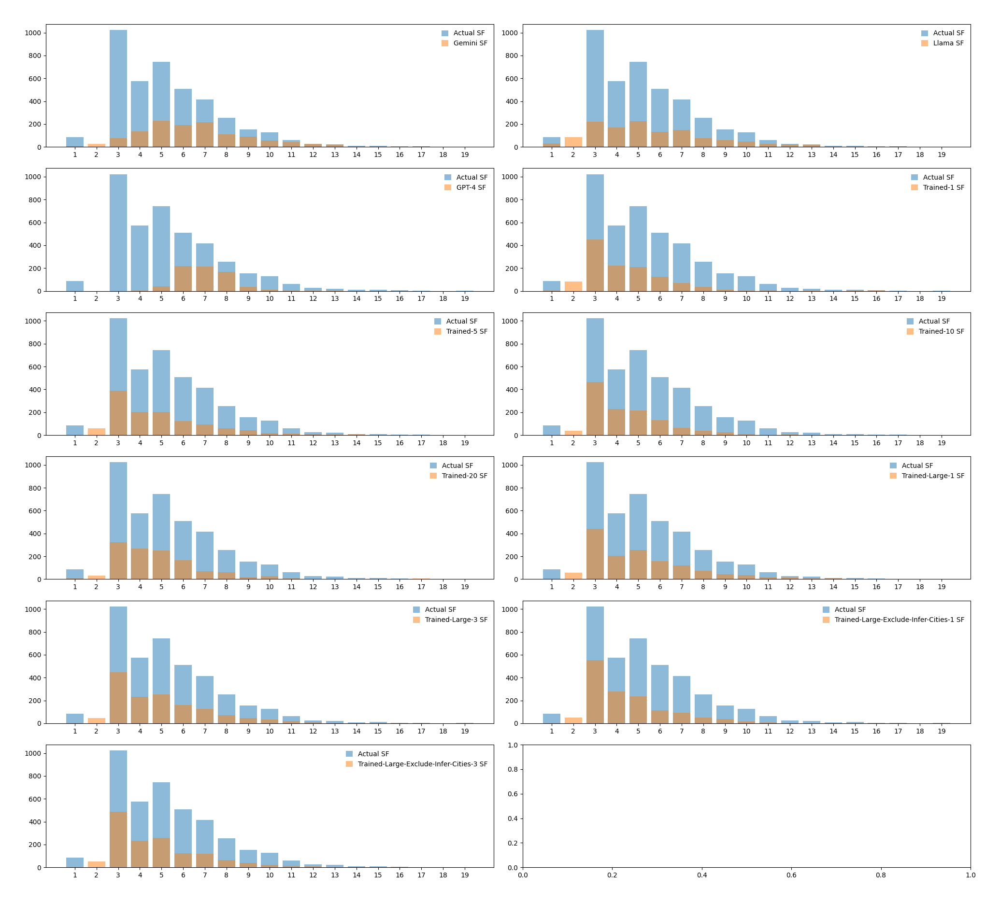


Gemini
Levene's test statistic: 8.628
p-value: 0.003
Unequal variances
Welch's t-statistic: -14.945
p-value: 0.000
Different distribution

Llama
Levene's test statistic: 30.512
p-value: 0.000
Unequal variances
Welch's t-statistic: -2.386
p-value: 0.017
Different distribution

GPT-4
Levene's test statistic: 234.384
p-value: 0.000
Unequal variances
Welch's t-statistic: -28.047
p-value: 0.000
Different distribution

Trained-1
Levene's test statistic: 100.164
p-value: 0.000
Unequal variances
Welch's t-statistic: 16.584
p-value: 0.000
Different distribution

Trained-5
Levene's test statistic: 6.334
p-value: 0.012
Unequal variances
Welch's t-statistic: 6.726
p-value: 0.000
Different distribution

Trained-10
Levene's test statistic: 94.656
p-value: 0.000
Unequal variances
Welch's t-statistic: 14.192
p-value: 0.000
Different distribution

Trained-20
Levene's test statistic: 30.052
p-value: 0.000
Unequal variances
Welch's t-statistic: 6.563
p-value: 0.000
Different distribution

Trained-Large-

In [26]:
others = {
    'Gemini': t_sf_gemini_loc,
    'Llama': t_sf_llama_loc,
    'GPT-4': t_sf_gpt4_loc,
    'Trained-1': t_sf_llama_trained_1_loc,
    'Trained-5': t_sf_llama_trained_5_loc,
    'Trained-10': t_sf_llama_trained_10_loc,
    'Trained-20': t_sf_llama_trained_20_loc,
    'Trained-Large-1': t_sf_llama_trained_large_1_loc,
    'Trained-Large-3': t_sf_llama_trained_large_3_loc,
    'Trained-Large-Exclude-Infer-Cities-1': t_sf_llama_trained_large_exclude_infer_cities_1_loc,
    'Trained-Large-Exclude-Infer-Cities-3': t_sf_llama_trained_large_exclude_infer_cities_3_loc,
}
loc_significance_test(data_t_sf_loc, others, 'SF')

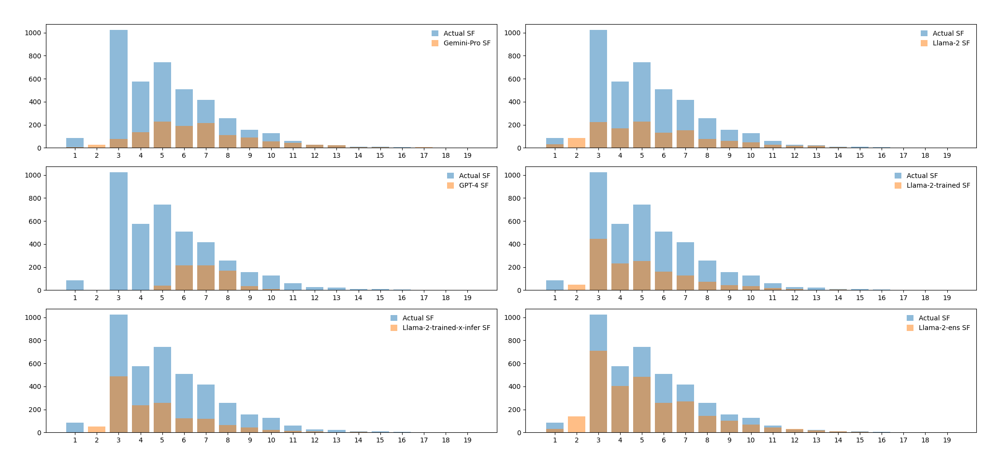


Gemini-Pro
Levene's test statistic: 8.628
p-value: 0.003
Unequal variances
Welch's t-statistic: -14.945
p-value: 0.000
Different distribution

Llama-2
Levene's test statistic: 30.512
p-value: 0.000
Unequal variances
Welch's t-statistic: -2.386
p-value: 0.017
Different distribution

GPT-4
Levene's test statistic: 234.384
p-value: 0.000
Unequal variances
Welch's t-statistic: -28.047
p-value: 0.000
Different distribution

Llama-2-trained
Levene's test statistic: 3.904
p-value: 0.048
Unequal variances
Welch's t-statistic: 5.384
p-value: 0.000
Different distribution

Llama-2-trained-x-infer
Levene's test statistic: 17.567
p-value: 0.000
Unequal variances
Welch's t-statistic: 8.173
p-value: 0.000
Different distribution

Llama-2-ens
Levene's test statistic: 3.121
p-value: 0.077
Equal variances
Welch's t-statistic: 3.218
p-value: 0.001
Different distribution


In [27]:

others = {
    'Gemini-Pro': t_sf_gemini_loc,
    'Llama-2': t_sf_llama_loc,
    'GPT-4': t_sf_gpt4_loc,
    # 'Trained-1': t_sf_llama_trained_1_loc,
    # 'Trained-5': t_sf_llama_trained_5_loc,
    # 'Trained-10': t_sf_llama_trained_10_loc,
    # 'Trained-20': t_sf_llama_trained_20_loc,
    # 'Trained-Large-1': t_sf_llama_trained_large_1_loc,
    'Llama-2-trained': t_sf_llama_trained_large_3_loc,
    # 'Trained-Large-Exclude-Infer-Cities-1': t_sf_llama_trained_large_exclude_infer_cities_1_loc,
    'Llama-2-trained-x-infer': t_sf_llama_trained_large_exclude_infer_cities_3_loc,
    'Llama-2-ens': t_sf_llama_ens_loc,
}
loc_significance_test(data_t_sf_loc, others, 'SF')

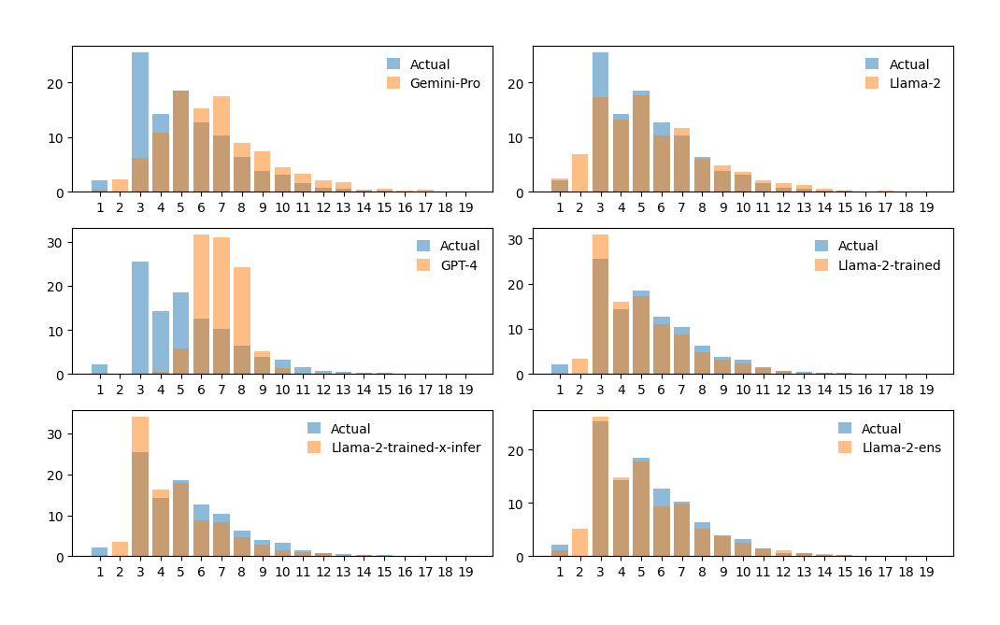


Gemini-Pro
Levene's test statistic: 8.628
p-value: 0.003
Unequal variances
Welch's t-statistic: -14.945
p-value: 0.000
Different distribution

Llama-2
Levene's test statistic: 30.512
p-value: 0.000
Unequal variances
Welch's t-statistic: -2.386
p-value: 0.017
Different distribution

GPT-4
Levene's test statistic: 234.384
p-value: 0.000
Unequal variances
Welch's t-statistic: -28.047
p-value: 0.000
Different distribution

Llama-2-trained
Levene's test statistic: 3.904
p-value: 0.048
Unequal variances
Welch's t-statistic: 5.384
p-value: 0.000
Different distribution

Llama-2-trained-x-infer
Levene's test statistic: 17.567
p-value: 0.000
Unequal variances
Welch's t-statistic: 8.173
p-value: 0.000
Different distribution

Llama-2-ens
Levene's test statistic: 3.121
p-value: 0.077
Equal variances
Welch's t-statistic: 3.218
p-value: 0.001
Different distribution


In [28]:
loc_significance_test_percentage(data_t_sf_loc, others, 'SF')

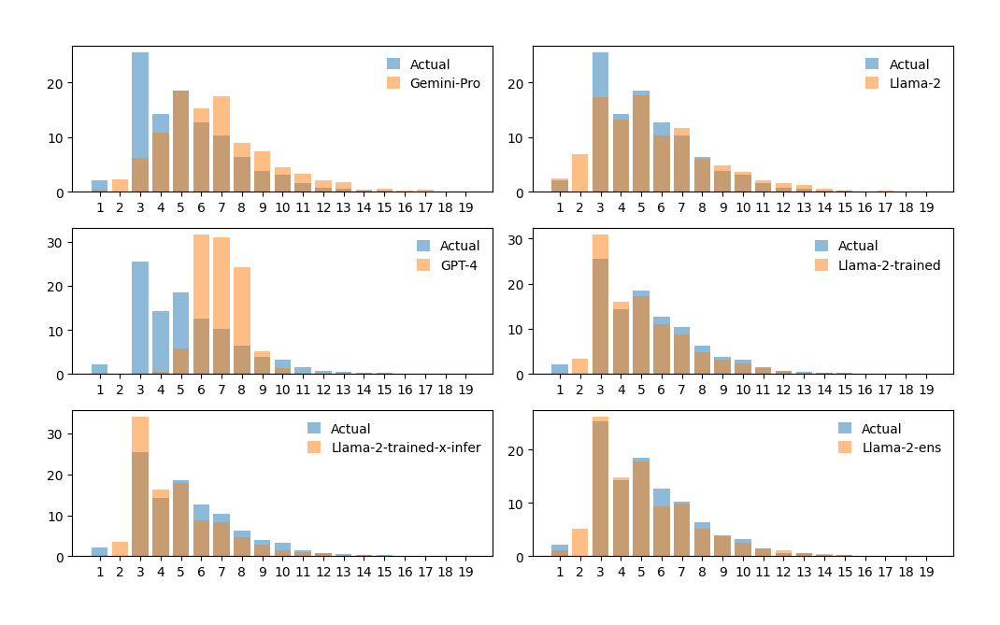


Gemini-Pro
Levene's test statistic: 8.628
p-value: 0.003
Unequal variances
Welch's t-statistic: -14.945
p-value: 0.000
Different distribution

Llama-2
Levene's test statistic: 30.512
p-value: 0.000
Unequal variances
Welch's t-statistic: -2.386
p-value: 0.017
Different distribution

GPT-4
Levene's test statistic: 234.384
p-value: 0.000
Unequal variances
Welch's t-statistic: -28.047
p-value: 0.000
Different distribution

Llama-2-trained
Levene's test statistic: 3.904
p-value: 0.048
Unequal variances
Welch's t-statistic: 5.384
p-value: 0.000
Different distribution

Llama-2-trained-x-infer
Levene's test statistic: 17.567
p-value: 0.000
Unequal variances
Welch's t-statistic: 8.173
p-value: 0.000
Different distribution

Llama-2-ens
Levene's test statistic: 3.121
p-value: 0.077
Equal variances
Welch's t-statistic: 3.218
p-value: 0.001
Different distribution


In [29]:
others = {
    'Gemini-Pro': t_sf_gemini_loc,
    'Llama-2': t_sf_llama_loc,
    'GPT-4': t_sf_gpt4_loc,
    # 'Trained-1': t_sf_llama_trained_1_loc,
    # 'Trained-5': t_sf_llama_trained_5_loc,
    # 'Trained-10': t_sf_llama_trained_10_loc,
    # 'Trained-20': t_sf_llama_trained_20_loc,
    # 'Trained-Large-1': t_sf_llama_trained_large_1_loc,
    'Llama-2-trained': t_sf_llama_trained_large_3_loc,
    # 'Trained-Large-Exclude-Infer-Cities-1': t_sf_llama_trained_large_exclude_infer_cities_1_loc,
    'Llama-2-trained-x-infer': t_sf_llama_trained_large_exclude_infer_cities_3_loc,
    'Llama-2-ens': t_sf_llama_ens_loc,
}
loc_significance_test_percentage(data_t_sf_loc, others, 'SF')

In [30]:
data_t_sf_tt = data_t_sf['travel_time'].to_list()
data_t_sf_tt = [x for x in data_t_sf_tt if str(x) != 'nan']

t_sf_gemini_tt = t_sf_gemini['travel_time'].to_list()
t_sf_gemini_tt = [x for x in t_sf_gemini_tt if str(x) != 'nan']

t_sf_llama_tt = t_sf_llama['travel_time'].to_list()
t_sf_llama_tt = [x for x in t_sf_llama_tt if str(x) != 'nan']

t_sf_gpt4_tt = t_sf_gpt4['travel_time'].to_list()
t_sf_gpt4_tt = [x for x in t_sf_gpt4_tt if str(x) != 'nan']

t_sf_llama_trained_1_tt = t_sf_llama_trained_1['travel_time'].to_list()
t_sf_llama_trained_1_tt = [x for x in t_sf_llama_trained_1_tt if str(x) != 'nan']

t_sf_llama_trained_5_tt = t_sf_llama_trained_5['travel_time'].to_list()
t_sf_llama_trained_5_tt = [x for x in t_sf_llama_trained_5_tt if str(x) != 'nan']

t_sf_llama_trained_10_tt = t_sf_llama_trained_10['travel_time'].to_list()
t_sf_llama_trained_10_tt = [x for x in t_sf_llama_trained_10_tt if str(x) != 'nan']

t_sf_llama_trained_20_tt = t_sf_llama_trained_20['travel_time'].to_list()
t_sf_llama_trained_20_tt = [x for x in t_sf_llama_trained_20_tt if str(x) != 'nan']

t_sf_llama_trained_large_1_tt = t_sf_llama_trained_large_1['travel_time'].to_list()
t_sf_llama_trained_large_1_tt = [x for x in t_sf_llama_trained_large_1_tt if str(x) != 'nan']

t_sf_llama_trained_large_3_tt = t_sf_llama_trained_large_3['travel_time'].to_list()
t_sf_llama_trained_large_3_tt = [x for x in t_sf_llama_trained_large_3_tt if str(x) != 'nan']

t_sf_llama_trained_large_exclude_infer_cities_1_tt = t_sf_llama_trained_large_exclude_infer_cities_1['travel_time'].to_list()
t_sf_llama_trained_large_exclude_infer_cities_1_tt = [x for x in t_sf_llama_trained_large_exclude_infer_cities_1_tt if str(x) != 'nan']

t_sf_llama_trained_large_exclude_infer_cities_3_tt = t_sf_llama_trained_large_exclude_infer_cities_3['travel_time'].to_list()
t_sf_llama_trained_large_exclude_infer_cities_3_tt = [x for x in t_sf_llama_trained_large_exclude_infer_cities_3_tt if str(x) != 'nan']

t_sf_llama_ens_tt = t_sf_llama_ens['travel_time'].to_list()
t_sf_llama_ens_tt = [x for x in t_sf_llama_ens_tt if str(x) != 'nan']

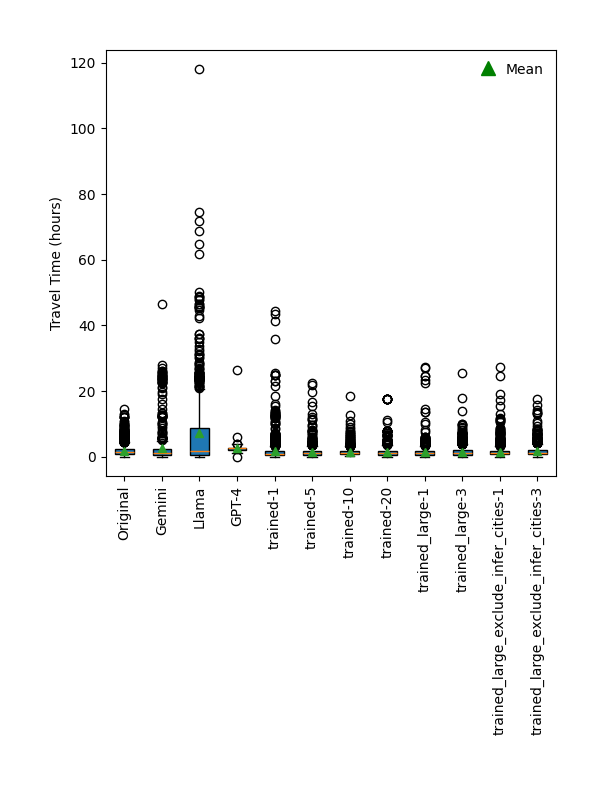

In [31]:
bp = plt.boxplot(
    [
        [x / (60*60) for x in data_t_sf_tt],
        [x / (60*60) for x in t_sf_gemini_tt],
        [x / (60*60) for x in t_sf_llama_tt],
        [x / (60*60) for x in t_sf_gpt4_tt],
        [x / (60*60) for x in t_sf_llama_trained_1_tt],
        [x / (60*60) for x in t_sf_llama_trained_5_tt],
        [x / (60*60) for x in t_sf_llama_trained_10_tt],
        [x / (60*60) for x in t_sf_llama_trained_20_tt],
        [x / (60*60) for x in t_sf_llama_trained_large_1_tt],
        [x / (60*60) for x in t_sf_llama_trained_large_3_tt],
        [x / (60*60) for x in t_sf_llama_trained_large_exclude_infer_cities_1_tt],
        [x / (60*60) for x in t_sf_llama_trained_large_exclude_infer_cities_3_tt],
    ],
    showmeans=True,
    patch_artist=True,
    showfliers=True,
)


plt.ylabel('Travel Time (hours)')
plt.xticks(
    [
        1,
        2,
        3,
        4,
        5,
        6,
        7,
        8,
        9,
        10,
        11,
        12
    ],
    [
        'Original',
        'Gemini',
        'Llama',
        'GPT-4',
        'trained-1',
        'trained-5',
        'trained-10',
        'trained-20',
        'trained_large-1',
        'trained_large-3',
        'trained_large_exclude_infer_cities-1',
        'trained_large_exclude_infer_cities-3',
    ]
)

green_triangle = mlines.Line2D([], [], color='green', marker='^', linestyle='None',
                          markersize=10, label='Mean')



plt.legend(handles=[green_triangle], loc='best')

plt.tight_layout()
plt.xticks(rotation=90)
plt.show()

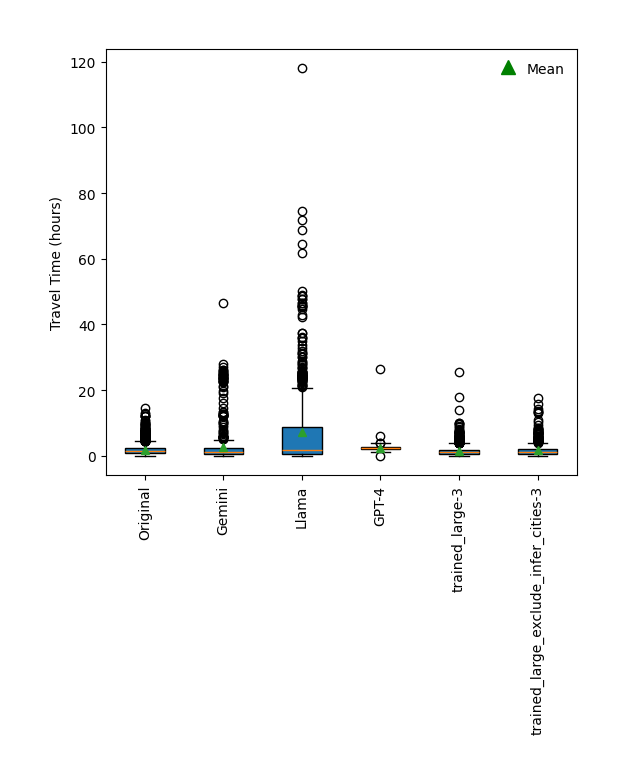

In [32]:
bp = plt.boxplot(
    [
        [x / (60*60) for x in data_t_sf_tt],
        [x / (60*60) for x in t_sf_gemini_tt],
        [x / (60*60) for x in t_sf_llama_tt],
        [x / (60*60) for x in t_sf_gpt4_tt],
        # [x / (60*60) for x in t_sf_llama_trained_1_tt],
        # [x / (60*60) for x in t_sf_llama_trained_5_tt],
        # [x / (60*60) for x in t_sf_llama_trained_10_tt],
        # [x / (60*60) for x in t_sf_llama_trained_20_tt],
        # [x / (60*60) for x in t_sf_llama_trained_large_1_tt],
        [x / (60*60) for x in t_sf_llama_trained_large_3_tt],
        # [x / (60*60) for x in t_sf_llama_trained_large_exclude_infer_cities_1_tt],
        [x / (60*60) for x in t_sf_llama_trained_large_exclude_infer_cities_3_tt],
    ],
    showmeans=True,
    patch_artist=True,
    showfliers=True,
)


plt.ylabel('Travel Time (hours)')
plt.xticks(
    [
        1,
        2,
        3,
        4,
        5,
        6,
        # 7,
        # 8,
        # 9,
        # 10,
        # 11,
        # 12
    ],
    [
        'Original',
        'Gemini',
        'Llama',
        'GPT-4',
        # 'trained-1',
        # 'trained-5',
        # 'trained-10',
        # 'trained-20',
        # 'trained_large-1',
        'trained_large-3',
        # 'trained_large_exclude_infer_cities-1',
        'trained_large_exclude_infer_cities-3',
    ]
)

green_triangle = mlines.Line2D([], [], color='green', marker='^', linestyle='None',
                          markersize=10, label='Mean')



plt.legend(handles=[green_triangle], loc='best')

plt.tight_layout()
plt.xticks(rotation=90)
plt.show()

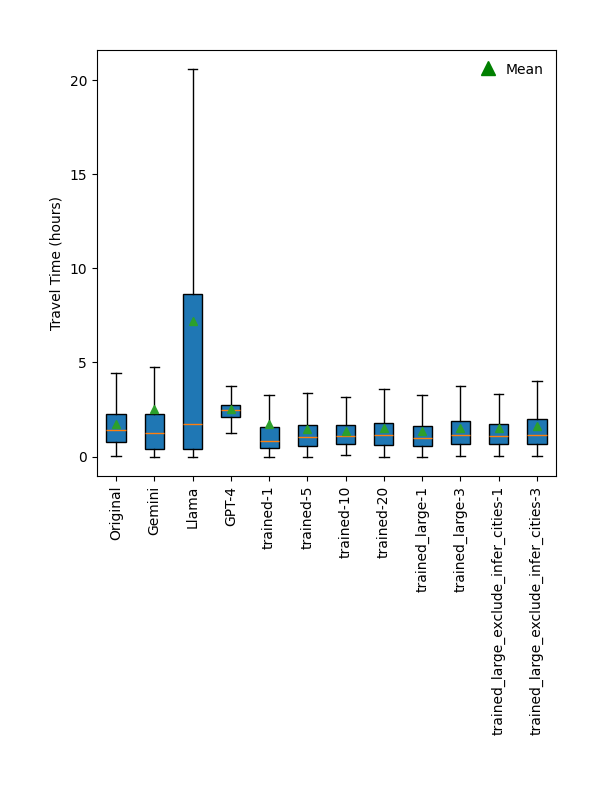

In [33]:
bp = plt.boxplot(
    [
        [x / (60*60) for x in data_t_sf_tt],
        [x / (60*60) for x in t_sf_gemini_tt],
        [x / (60*60) for x in t_sf_llama_tt],
        [x / (60*60) for x in t_sf_gpt4_tt],
        [x / (60*60) for x in t_sf_llama_trained_1_tt],
        [x / (60*60) for x in t_sf_llama_trained_5_tt],
        [x / (60*60) for x in t_sf_llama_trained_10_tt],
        [x / (60*60) for x in t_sf_llama_trained_20_tt],
        [x / (60*60) for x in t_sf_llama_trained_large_1_tt],
        [x / (60*60) for x in t_sf_llama_trained_large_3_tt],
        [x / (60*60) for x in t_sf_llama_trained_large_exclude_infer_cities_1_tt],
        [x / (60*60) for x in t_sf_llama_trained_large_exclude_infer_cities_3_tt],
    ],
    showmeans=True,
    patch_artist=True,
    showfliers=False,
)


plt.ylabel('Travel Time (hours)')
plt.xticks(
    [
        1,
        2,
        3,
        4,
        5,
        6,
        7,
        8,
        9,
        10,
        11,
        12
    ],
    [
        'Original',
        'Gemini',
        'Llama',
        'GPT-4',
        'trained-1',
        'trained-5',
        'trained-10',
        'trained-20',
        'trained_large-1',
        'trained_large-3',
        'trained_large_exclude_infer_cities-1',
        'trained_large_exclude_infer_cities-3',
    ]
)

green_triangle = mlines.Line2D([], [], color='green', marker='^', linestyle='None',
                          markersize=10, label='Mean')



plt.legend(handles=[green_triangle], loc='best')

plt.tight_layout()
plt.xticks(rotation=90)
plt.show()

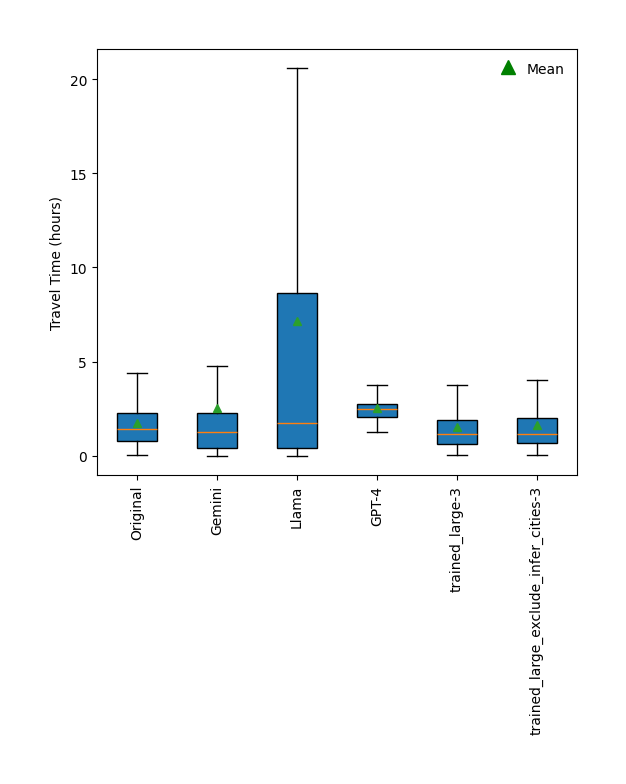

In [34]:
bp = plt.boxplot(
    [
        [x / (60*60) for x in data_t_sf_tt],
        [x / (60*60) for x in t_sf_gemini_tt],
        [x / (60*60) for x in t_sf_llama_tt],
        [x / (60*60) for x in t_sf_gpt4_tt],
        # [x / (60*60) for x in t_sf_llama_trained_1_tt],
        # [x / (60*60) for x in t_sf_llama_trained_5_tt],
        # [x / (60*60) for x in t_sf_llama_trained_10_tt],
        # [x / (60*60) for x in t_sf_llama_trained_20_tt],
        # [x / (60*60) for x in t_sf_llama_trained_large_1_tt],
        [x / (60*60) for x in t_sf_llama_trained_large_3_tt],
        # [x / (60*60) for x in t_sf_llama_trained_large_exclude_infer_cities_1_tt],
        [x / (60*60) for x in t_sf_llama_trained_large_exclude_infer_cities_3_tt],
    ],
    showmeans=True,
    patch_artist=True,
    showfliers=False,
)


plt.ylabel('Travel Time (hours)')
plt.xticks(
    [
        1,
        2,
        3,
        4,
        5,
        6,
        # 7,
        # 8,
        # 9,
        # 10,
        # 11,
        # 12
    ],
    [
        'Original',
        'Gemini',
        'Llama',
        'GPT-4',
        # 'trained-1',
        # 'trained-5',
        # 'trained-10',
        # 'trained-20',
        # 'trained_large-1',
        'trained_large-3',
        # 'trained_large_exclude_infer_cities-1',
        'trained_large_exclude_infer_cities-3',
    ]
)

green_triangle = mlines.Line2D([], [], color='green', marker='^', linestyle='None',
                          markersize=10, label='Mean')



plt.legend(handles=[green_triangle], loc='best')

plt.tight_layout()
plt.xticks(rotation=90)
plt.show()

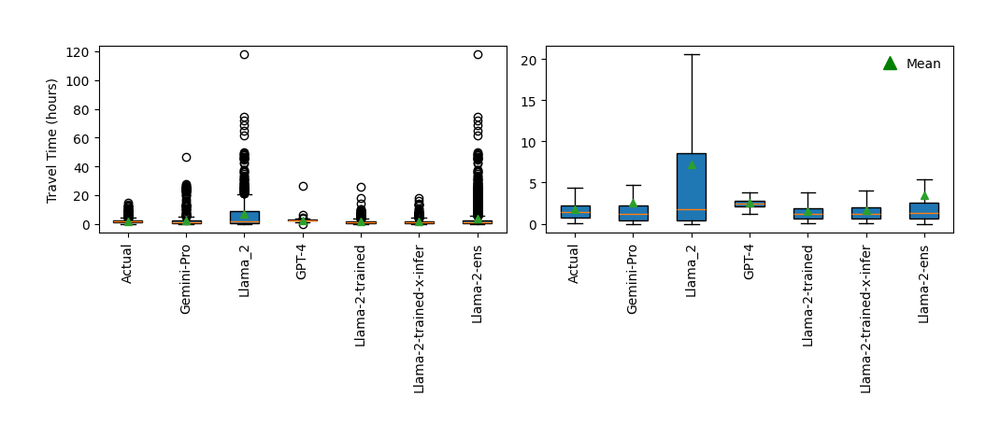

In [35]:
fig, axes = plt.subplots(1,2, figsize=(10, 4))

bp = axes[0].boxplot(
    [
        [x / (60*60) for x in data_t_sf_tt],
        [x / (60*60) for x in t_sf_gemini_tt],
        [x / (60*60) for x in t_sf_llama_tt],
        [x / (60*60) for x in t_sf_gpt4_tt],
        [x / (60*60) for x in t_sf_llama_trained_large_3_tt],
        [x / (60*60) for x in t_sf_llama_trained_large_exclude_infer_cities_3_tt],
        [x / (60*60) for x in t_sf_llama_ens_tt],
    ],
    showmeans=True,
    patch_artist=True,
    showfliers=True,
)


axes[0].set_ylabel('Travel Time (hours)')
axes[0].set_xticks(
    [
        1,
        2,
        3,
        4,
        5,
        6,
        7,
    ],
    [
        'Actual',
        'Gemini-Pro',
        'Llama_2',
        'GPT-4',
        'Llama-2-trained',
        'Llama-2-trained-x-infer',
        'Llama-2-ens',
    ],
    rotation=90
)
# .xticks(rotation=90)

bp = axes[1].boxplot(
    [
        [x / (60*60) for x in data_t_sf_tt],
        [x / (60*60) for x in t_sf_gemini_tt],
        [x / (60*60) for x in t_sf_llama_tt],
        [x / (60*60) for x in t_sf_gpt4_tt],
        [x / (60*60) for x in t_sf_llama_trained_large_3_tt],
        [x / (60*60) for x in t_sf_llama_trained_large_exclude_infer_cities_3_tt],
        [x / (60*60) for x in t_sf_llama_ens_tt],
    ],
    showmeans=True,
    patch_artist=True,
    showfliers=False,
)


# axes[1].set_ylabel('Travel Time (hours)')
axes[1].set_xticks(
    [
        1,
        2,
        3,
        4,
        5,
        6,
        7,
    ],
    [
        'Actual',
        'Gemini-Pro',
        'Llama_2',
        'GPT-4',
        'Llama-2-trained',
        'Llama-2-trained-x-infer',
        'Llama-2-ens',
    ],
    rotation=90
)

green_triangle = mlines.Line2D([], [], color='green', marker='^', linestyle='None',
                          markersize=10, label='Mean')



plt.legend(handles=[green_triangle], loc='best')
plt.tight_layout()
plt.show()
plt.show()

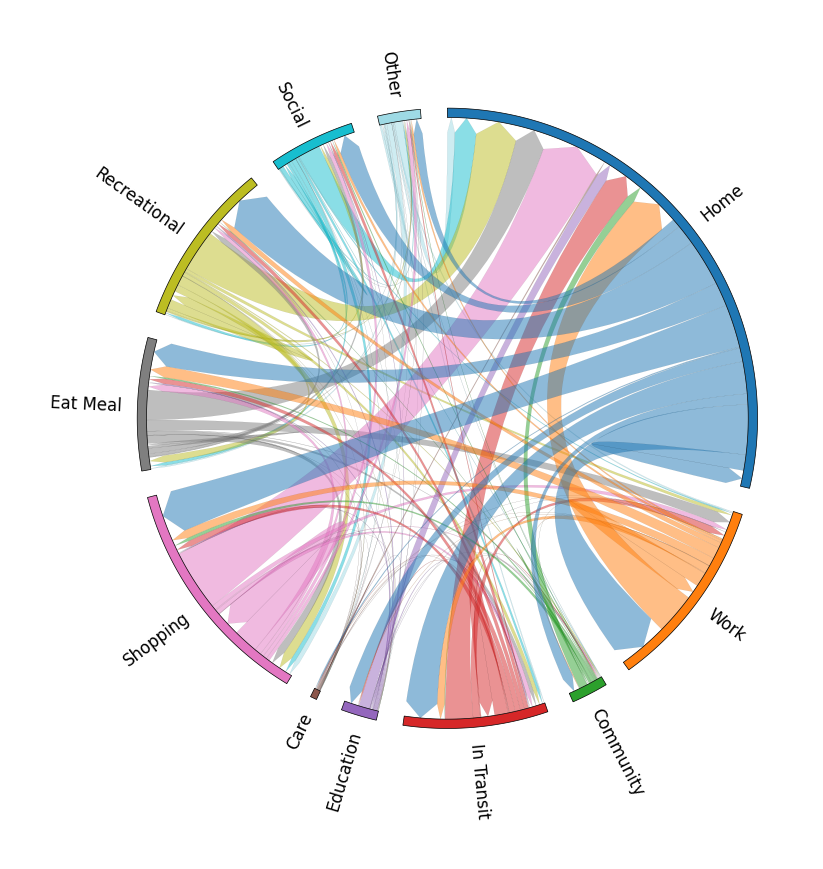

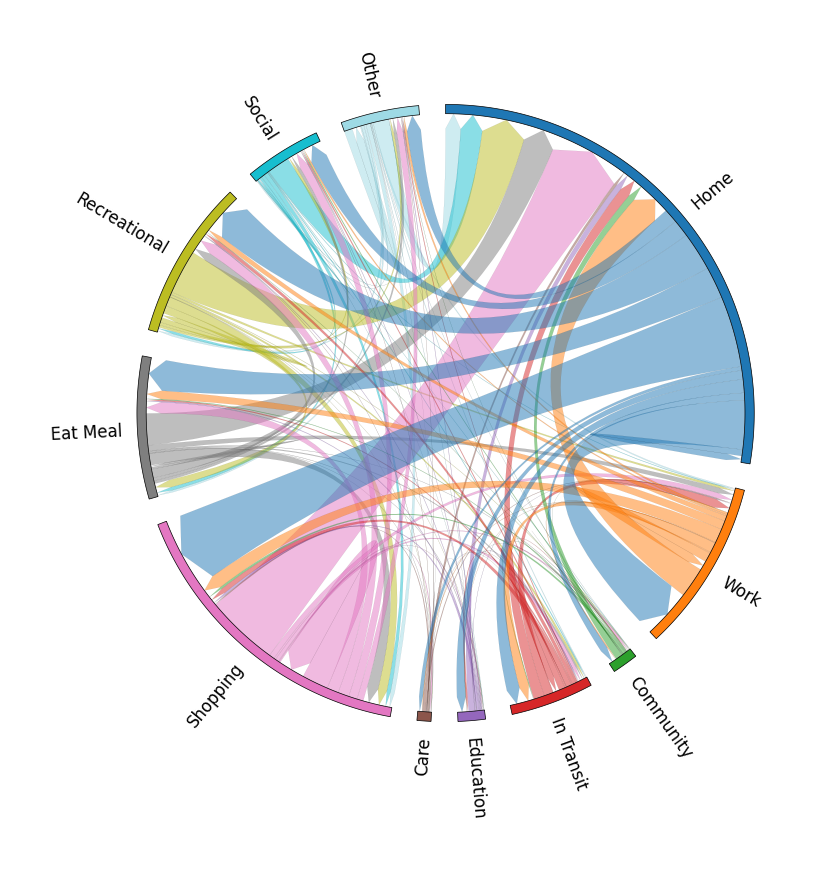

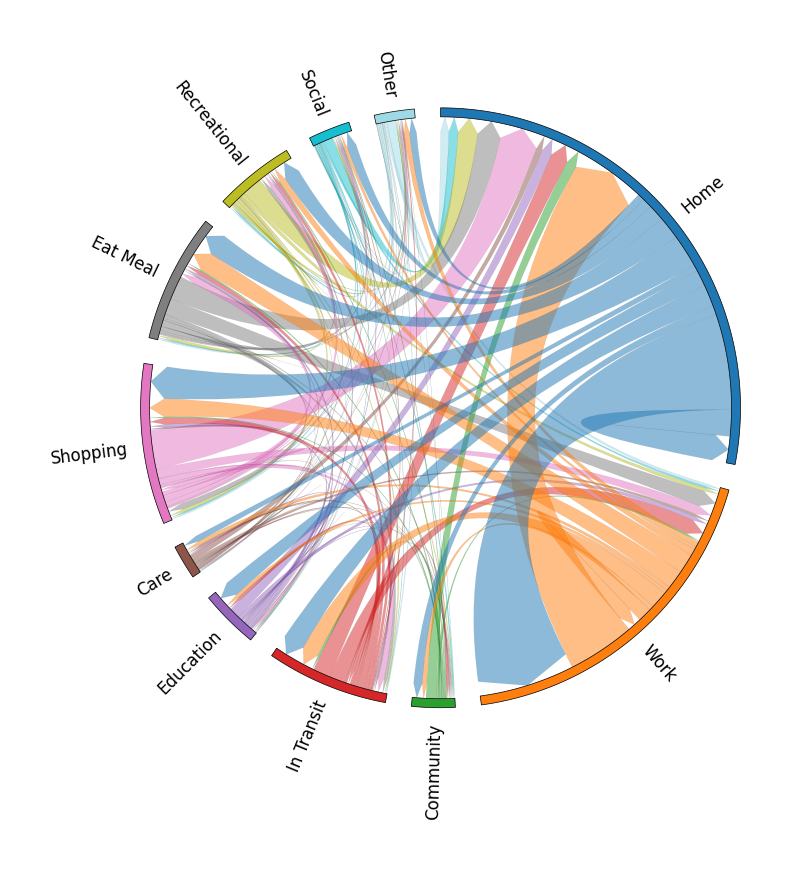

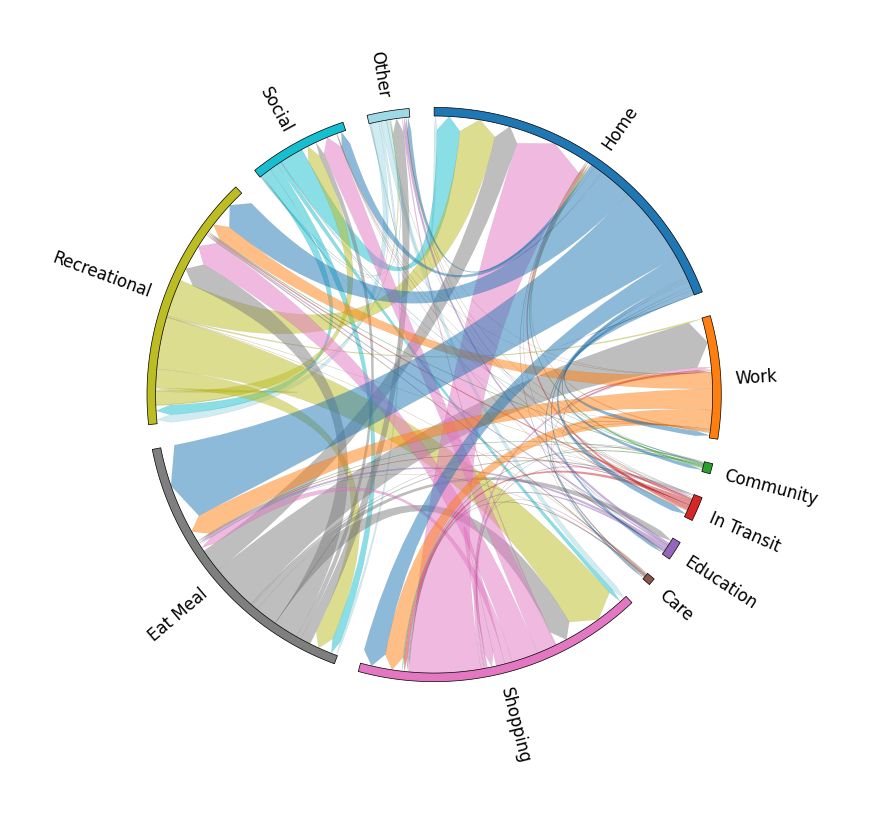

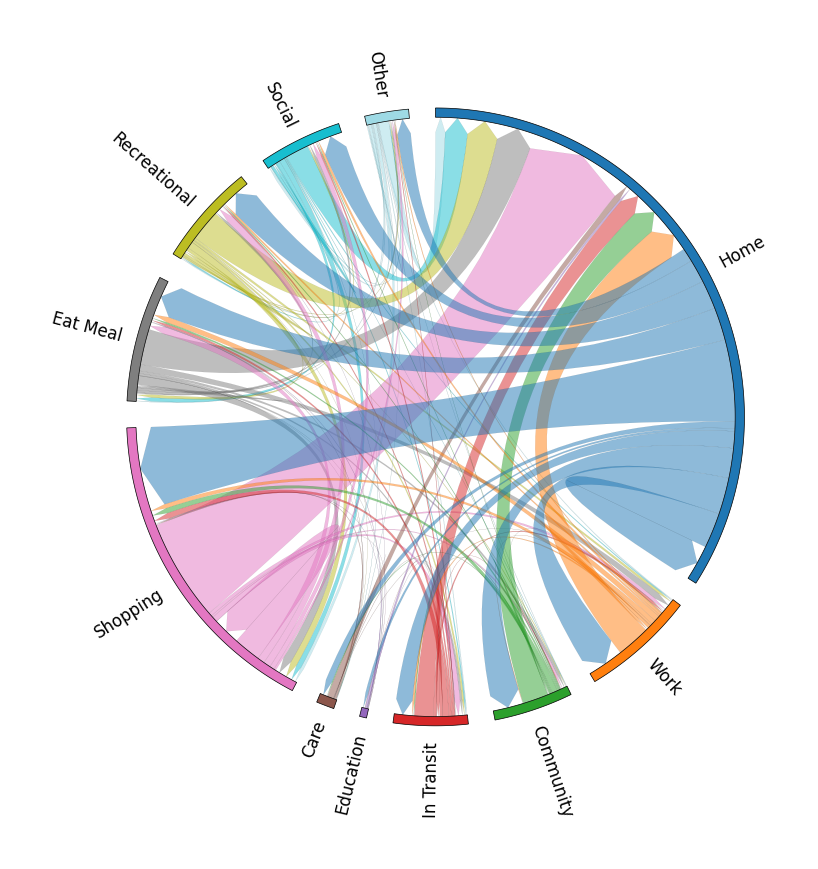

...

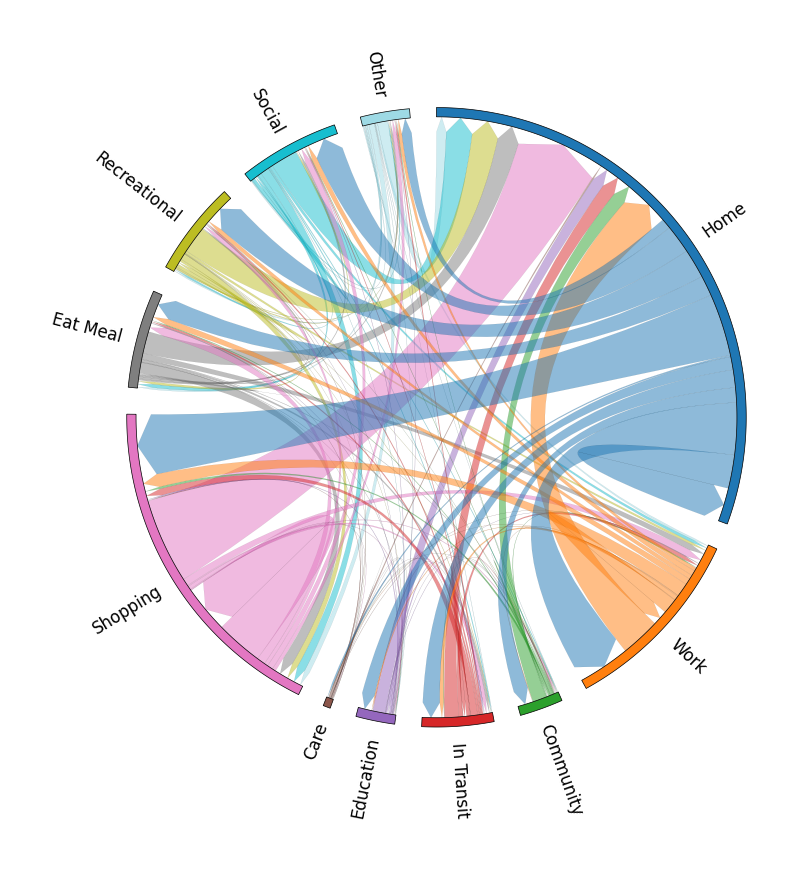

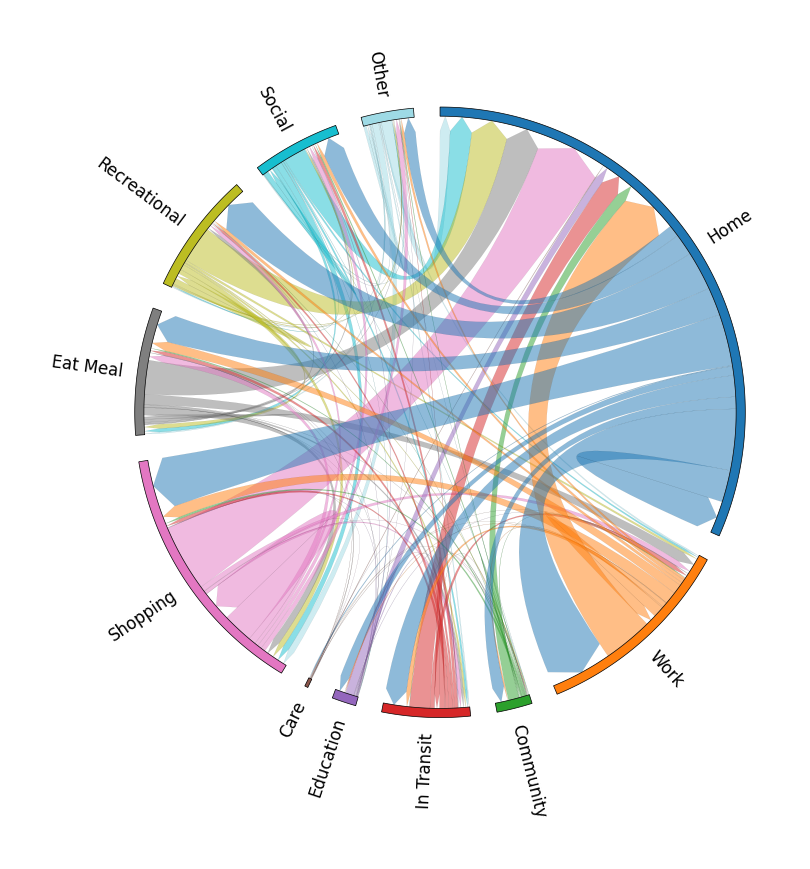

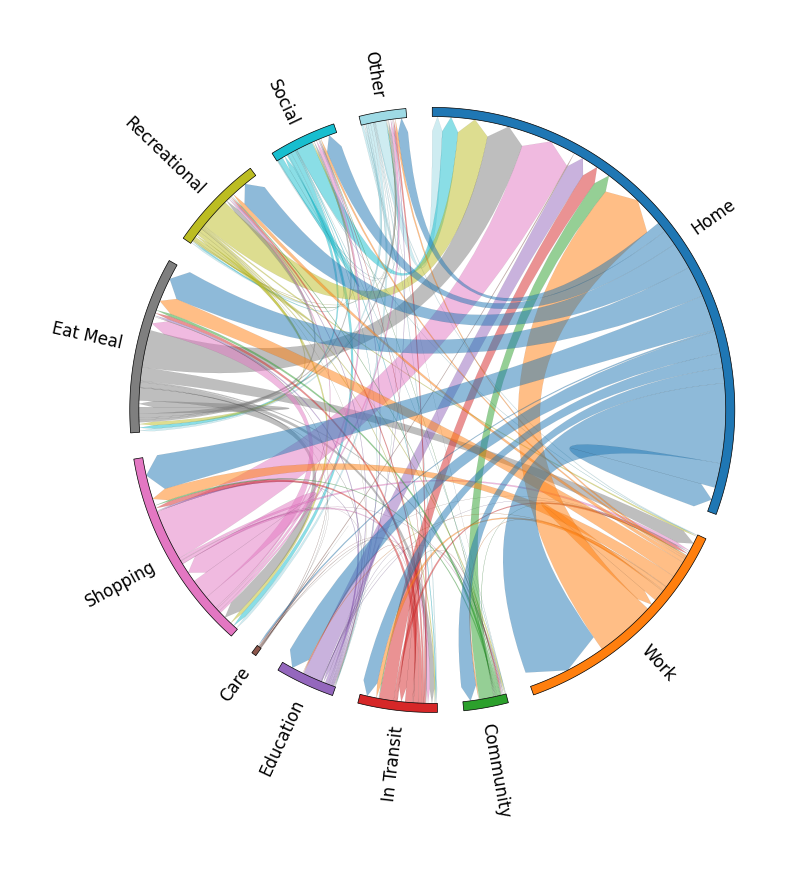

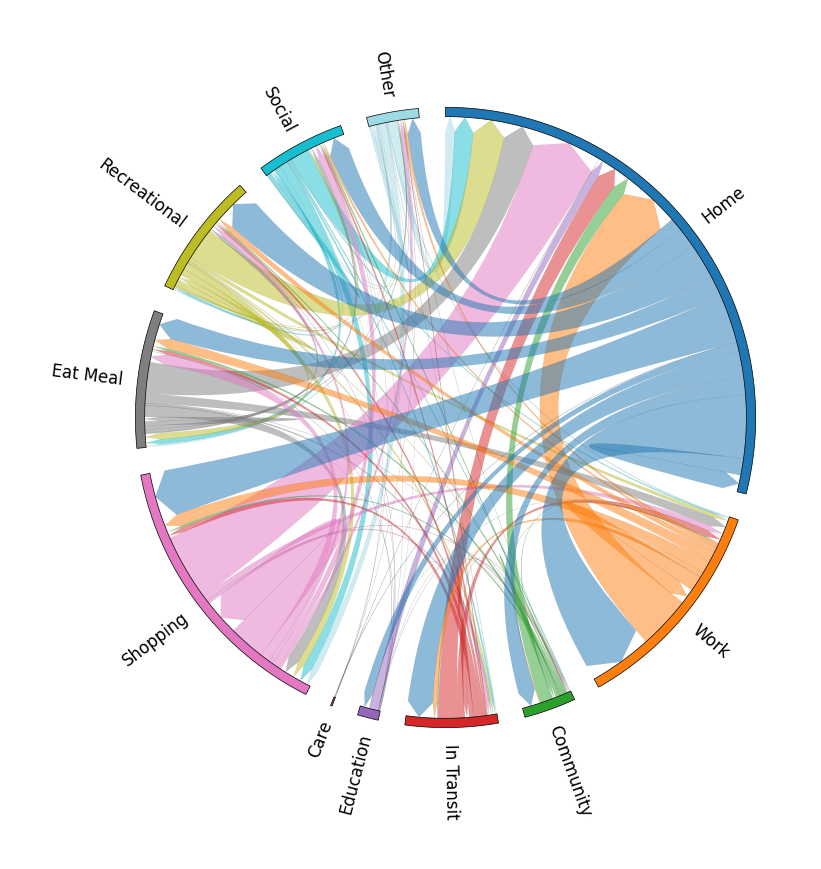

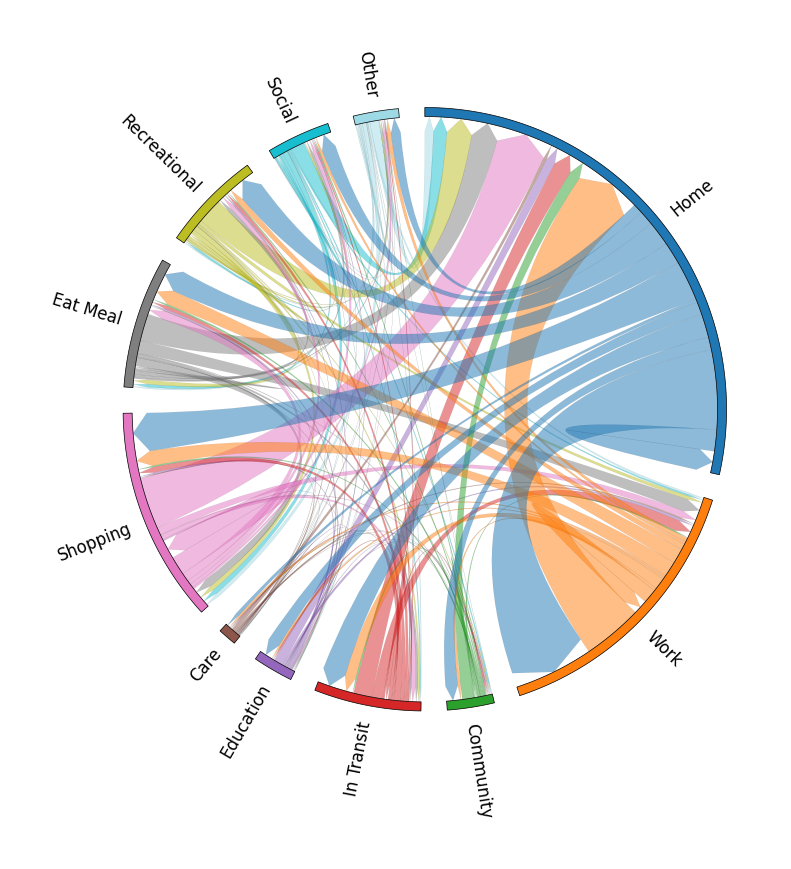

In [36]:
_, m_orig_sf = get_chord_diagram(data_t_sf, loc_type_key='loc_type', file_name='example.png', new_mappings=True)
_, m_sf_gemini = get_chord_diagram(t_sf_gemini, loc_type_key='loc_type_new', file_name='example.png', new_mappings=True)
_, m_sf_llama = get_chord_diagram(t_sf_llama, loc_type_key='loc_type_new', file_name='example.png', new_mappings=True)
_, m_sf_gpt4 = get_chord_diagram(t_sf_gpt4, loc_type_key='loc_type_new', file_name='example.png', new_mappings=True)
_, m_sf_llama_trained_1 = get_chord_diagram(t_sf_llama_trained_1, loc_type_key='loc_type_new', file_name='example.png', new_mappings=True)
_, m_sf_llama_trained_5 = get_chord_diagram(t_sf_llama_trained_5, loc_type_key='loc_type_new', file_name='example.png', new_mappings=True)
_, m_sf_llama_trained_10 = get_chord_diagram(t_sf_llama_trained_10, loc_type_key='loc_type_new', file_name='example.png', new_mappings=True)
_, m_sf_llama_trained_20 = get_chord_diagram(t_sf_llama_trained_20, loc_type_key='loc_type_new', file_name='example.png', new_mappings=True)
_, m_sf_llama_trained_large_1 = get_chord_diagram(t_sf_llama_trained_large_1, loc_type_key='loc_type_new', file_name='example.png', new_mappings=True)
_, m_sf_llama_trained_large_3 = get_chord_diagram(t_sf_llama_trained_large_3, loc_type_key='loc_type_new', file_name='example.png', new_mappings=True)
_, m_sf_llama_trained_large_exclude_infer_cities_1 = get_chord_diagram(t_sf_llama_trained_large_exclude_infer_cities_1, loc_type_key='loc_type_new', file_name='example.png', new_mappings=True)
_, m_sf_llama_trained_large_exclude_infer_cities_3 = get_chord_diagram(t_sf_llama_trained_large_exclude_infer_cities_3, loc_type_key='loc_type_new', file_name='example.png', new_mappings=True)
_, m_sf_llama_ens = get_chord_diagram(t_sf_llama_ens, loc_type_key='loc_type_new', file_name='example.png', new_mappings=True)

In [37]:
t_orig_prob_1_sf = get_transient_prob_1(data_t_sf, 'loc_type')

t_prob_1_sf_gemini = get_transient_prob_1(t_sf_gemini, 'loc_type_new')

t_prob_1_sf_llama = get_transient_prob_1(t_sf_llama, 'loc_type_new')

t_prob_1_sf_gpt4 = get_transient_prob_1(t_sf_gpt4, 'loc_type_new')


t_prob_1_sf_llama_trained_1 = get_transient_prob_1(t_sf_llama_trained_1, 'loc_type_new')
t_prob_1_sf_llama_trained_5 = get_transient_prob_1(t_sf_llama_trained_5, 'loc_type_new')
t_prob_1_sf_llama_trained_10 = get_transient_prob_1(t_sf_llama_trained_10, 'loc_type_new')
t_prob_1_sf_llama_trained_20 = get_transient_prob_1(t_sf_llama_trained_20, 'loc_type_new')

t_prob_1_sf_llama_trained_large_1 = get_transient_prob_1(t_sf_llama_trained_large_1, 'loc_type_new')
t_prob_1_sf_llama_trained_large_3 = get_transient_prob_1(t_sf_llama_trained_large_3, 'loc_type_new')

t_prob_1_sf_llama_trained_large_exclude_infer_cities_1 = get_transient_prob_1(t_sf_llama_trained_large_exclude_infer_cities_1, 'loc_type_new')
t_prob_1_sf_llama_trained_large_exclude_infer_cities_3 = get_transient_prob_1(t_sf_llama_trained_large_exclude_infer_cities_3, 'loc_type_new')

t_prob_1_sf_llama_ens = get_transient_prob_1(t_sf_llama_ens, 'loc_type_new')

In [38]:
t_orig_prob_2_sf = get_transient_prob_2(data_t_sf, 'loc_type')

t_prob_2_sf_gemini = get_transient_prob_2(t_sf_gemini, 'loc_type_new')

t_prob_2_sf_llama = get_transient_prob_2(t_sf_llama, 'loc_type_new')

t_prob_2_sf_gpt4 = get_transient_prob_2(t_sf_gpt4, 'loc_type_new')

t_prob_2_sf_llama_trained_1 = get_transient_prob_2(t_sf_llama_trained_1, 'loc_type_new')
t_prob_2_sf_llama_trained_5 = get_transient_prob_2(t_sf_llama_trained_5, 'loc_type_new')
t_prob_2_sf_llama_trained_10 = get_transient_prob_2(t_sf_llama_trained_10, 'loc_type_new')
t_prob_2_sf_llama_trained_20 = get_transient_prob_2(t_sf_llama_trained_20, 'loc_type_new')

t_prob_2_sf_llama_trained_large_1 = get_transient_prob_2(t_sf_llama_trained_large_1, 'loc_type_new')
t_prob_2_sf_llama_trained_large_3 = get_transient_prob_2(t_sf_llama_trained_large_3, 'loc_type_new')

t_prob_2_sf_llama_trained_large_exclude_infer_cities_1 = get_transient_prob_2(t_sf_llama_trained_large_exclude_infer_cities_1, 'loc_type_new')
t_prob_2_sf_llama_trained_large_exclude_infer_cities_3 = get_transient_prob_2(t_sf_llama_trained_large_exclude_infer_cities_3, 'loc_type_new')

t_prob_2_sf_llama_ens = get_transient_prob_2(t_sf_llama_ens, 'loc_type_new')

In [39]:
order = 1
print(order)
models = [
    'gemini',
    'llama',
    'gpt4',
    # 'llama_trained_1',
    # 'llama_trained_5',
    # 'llama_trained_10',
    # 'llama_trained_20',
    # 'llama_trained_large_1',
    'llama_trained_large_3',
    # 'llama_trained_large_exclude_infer_cities_1',
    'llama_trained_large_exclude_infer_cities_3',
    'llama_ens'
]
for model in models:
    print( model,
        round(
            get_normalized_norm(
                eval(f't_orig_prob_{order}_sf'),
                eval(f't_prob_{order}_sf_{model}')
            ),
            5
        )
    )

order = 2
print(order)
for model in models:
    print( model,
        round(
            get_normalized_norm(
                eval(f't_orig_prob_{order}_sf'),
                eval(f't_prob_{order}_sf_{model}')
            ),
            5
        )
    )

1
gemini 0.0634
llama 0.10607
gpt4 0.1655
llama_trained_large_3 0.0443
llama_trained_large_exclude_infer_cities_3 0.04348
llama_ens 0.06763
2
gemini 0.04642
llama 0.0709
gpt4 0.1297
llama_trained_large_3 0.03193
llama_trained_large_exclude_infer_cities_3 0.03691
llama_ens 0.04747


In [40]:
order = 1
print(order)
models = [
    'gemini',
    'llama',
    'gpt4',
    'llama_trained_1',
    'llama_trained_5',
    'llama_trained_10',
    'llama_trained_20',
    'llama_trained_large_1',
    'llama_trained_large_3',
    'llama_trained_large_exclude_infer_cities_1',
    'llama_trained_large_exclude_infer_cities_3',
]
for model in models:
    print( model,
        round(
            distance.jensenshannon(
                eval(f't_orig_prob_{order}_sf'),
                eval(f't_prob_{order}_sf_{model}')
            )[0],
            5
        )
    )

order = 2
print(order)
for model in models:
    print( model,
        round(
            distance.jensenshannon(
                eval(f't_orig_prob_{order}_sf'),
                eval(f't_prob_{order}_sf_{model}')
            )[0],
            5
        )
    )

1
gemini 0.13453
llama 0.17678
gpt4 0.3433
llama_trained_1 0.17669
llama_trained_5 0.10267
llama_trained_10 0.08827
llama_trained_20 0.1636
llama_trained_large_1 0.13742
llama_trained_large_3 0.08774
llama_trained_large_exclude_infer_cities_1 0.12848
llama_trained_large_exclude_infer_cities_3 0.07638
2
gemini 0.21898
llama 0.28638
gpt4 0.50894
llama_trained_1 0.24196
llama_trained_5 0.15897
llama_trained_10 0.18184
llama_trained_20 0.28119
llama_trained_large_1 0.19803
llama_trained_large_3 0.13929
llama_trained_large_exclude_infer_cities_1 0.20468
llama_trained_large_exclude_infer_cities_3 0.15455


In [41]:
res_1 = get_transient_destination_probabilities(order=1)
res_1

,SF_orig,Gemini,Llama,GPT-4,Trained-1,Trained-5,Trained-10,Trained-20,Trained-Large-1,Trained-Large-3,Trained-Large-Exclude-Infer-cities-1,Trained-Large-Exclude-Infer-cities-3,Llama-ens
Home,0.338983,0.318895,0.315672,0.226176,0.411736,0.330297,0.358025,0.372565,0.362885,0.375888,0.362339,0.340993,0.327892
Work,0.118188,0.106634,0.218964,0.081648,0.071252,0.154025,0.149810,0.108786,0.117748,0.126970,0.148266,0.135110,0.178495
Community,0.022485,0.015974,0.028635,0.006824,0.049063,0.010381,0.017569,0.011397,0.026511,0.021653,0.028345,0.032537,0.030518
In Transit,0.089140,0.051374,0.078361,0.016330,0.044132,0.077542,0.090931,0.068587,0.044070,0.054564,0.049554,0.056801,0.067956
Education,0.021743,0.017269,0.038237,0.012917,0.004438,0.010593,0.009259,0.002694,0.023928,0.015070,0.037463,0.012868,0.025994
Care,0.003938,0.008778,0.022805,0.004874,0.011095,0.001695,0.001187,0.000207,0.004132,0.002079,0.002973,0.000919,0.012243
Shopping,0.144039,0.192690,0.104938,0.193029,0.190828,0.176907,0.129392,0.224202,0.208814,0.161961,0.128048,0.172243,0.137420
Eat Meal,0.081607,0.089797,0.084362,0.192298,0.076677,0.075000,0.081434,0.073353,0.060251,0.079508,0.111596,0.084743,0.084546
Recreational,0.100211,0.099727,0.054698,0.171582,0.060651,0.066525,0.074786,0.074182,0.059907,0.075524,0.060059,0.077206,0.065561
Social,0.053416,0.049360,0.027606,0.066293,0.052515,0.063771,0.062441,0.034397,0.061801,0.054391,0.041625,0.054596,0.040632


In [42]:
def create_plots_for_destination_prob(res):
    res.transpose().plot.bar(
        stacked=True,
        title='Destination Probabilities',
        cmap='tab20'
    )
    plt.tight_layout()
    plt.legend(loc='upper right', bbox_to_anchor=(1.25, 1))
    plt.grid(axis='y', linestyle='--', alpha=0.5)
    plt.show()

    res.plot.bar(
        title='Destination Probabilities',
        figsize=(14, 5),
        cmap='tab20'
    )
    plt.grid(axis='y', linestyle='--', alpha=0.5)
    plt.legend(loc='upper right', bbox_to_anchor=(1.25, 1))
    plt.show()

    pd.concat(
        [
            res[['Gemini']].sub(res['SF_orig'], axis=0),
            res[['Llama']].sub(res['SF_orig'], axis=0),
            res[['GPT-4']].sub(res['SF_orig'], axis=0),
            res[['Trained-1']].sub(res['SF_orig'], axis=0),
            res[['Trained-5']].sub(res['SF_orig'], axis=0),
            res[['Trained-10']].sub(res['SF_orig'], axis=0),
            res[['Trained-20']].sub(res['SF_orig'], axis=0),
            res[['Trained-Large-1']].sub(res['SF_orig'], axis=0),
            res[['Trained-Large-1']].sub(res['SF_orig'], axis=0),
            res[['Trained-Large-Exclude-Infer-cities-1']].sub(res['SF_orig'], axis=0),
            res[['Trained-Large-Exclude-Infer-cities-3']].sub(res['SF_orig'], axis=0),
            res[['Trained-Large-Exclude-Infer-cities-3']].sub(res['SF_orig'], axis=0),
        ],
        axis=1
    ).plot.bar(
        title='Difference in Destination Probabilities (Generated - Origial)',
        figsize=(14, 5),
        cmap='tab20'
    )
    plt.grid(axis='y', linestyle='--', alpha=0.5)
    plt.legend(loc='upper right', bbox_to_anchor=(1.25, 1))
    plt.show()


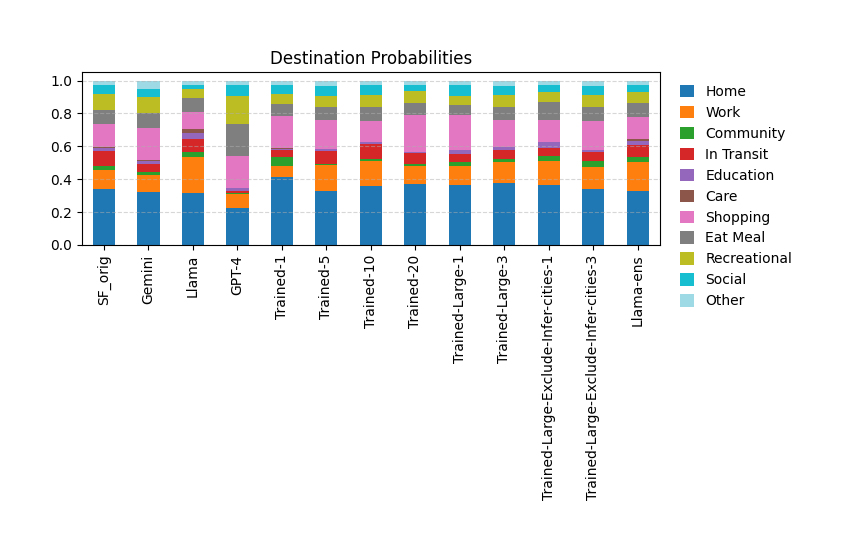

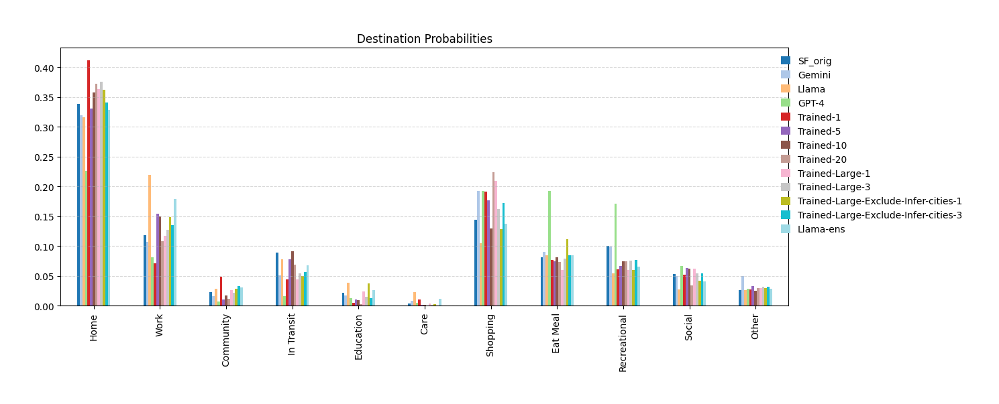

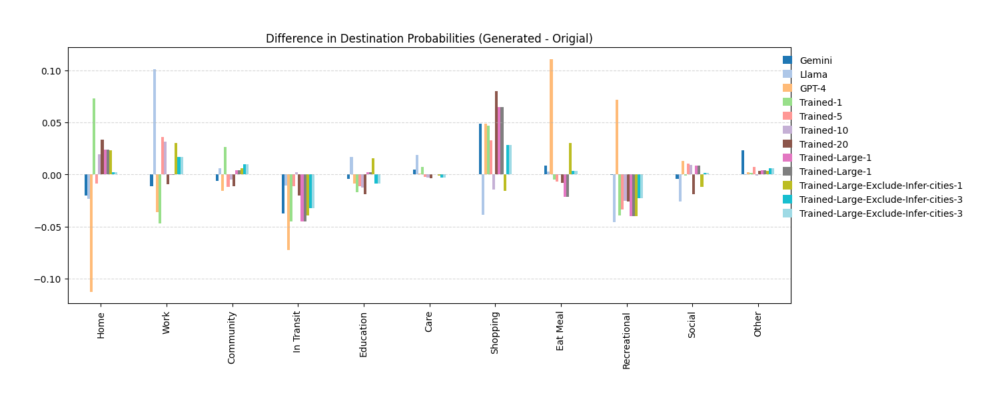

In [43]:
destination_probs_diff_gemini = create_plots_for_destination_prob(res_1)

In [44]:
rename_dict = {}
for each in res_1[['SF_orig']].iterrows():
    a = f'{each[0]} \n ({np.round(each[1].values[0]*100, 2)})'
    rename_dict[each[0]] = a
rename_dict

{'Home': 'Home \n (33.9)',
 'Work': 'Work \n (11.82)',
 'Community': 'Community \n (2.25)',
 'In Transit': 'In Transit \n (8.91)',
 'Education': 'Education \n (2.17)',
 'Care': 'Care \n (0.39)',
 'Shopping': 'Shopping \n (14.4)',
 'Eat Meal': 'Eat Meal \n (8.16)',
 'Recreational': 'Recreational \n (10.02)',
 'Social': 'Social \n (5.34)',
 'Other': 'Other \n (2.63)'}

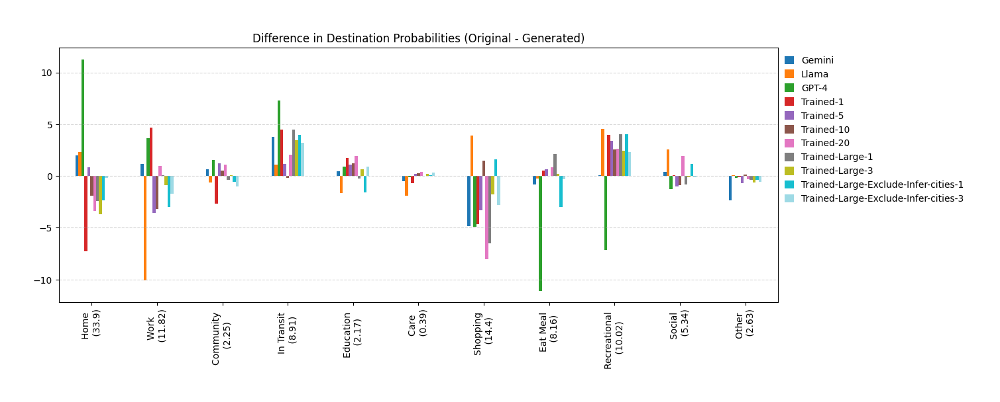

In [45]:
df_t = pd.concat(
    [
        res_1[['SF_orig']].sub(res_1['Gemini'], axis=0)*100,
        res_1[['SF_orig']].sub(res_1['Llama'], axis=0)*100,
        res_1[['SF_orig']].sub(res_1['GPT-4'], axis=0)*100,
        res_1[['SF_orig']].sub(res_1['Trained-1'], axis=0)*100,
        res_1[['SF_orig']].sub(res_1['Trained-5'], axis=0)*100,
        res_1[['SF_orig']].sub(res_1['Trained-10'], axis=0)*100,
        res_1[['SF_orig']].sub(res_1['Trained-20'], axis=0)*100,
        res_1[['SF_orig']].sub(res_1['Trained-Large-1'], axis=0)*100,
        res_1[['SF_orig']].sub(res_1['Trained-Large-3'], axis=0)*100,
        res_1[['SF_orig']].sub(res_1['Trained-Large-Exclude-Infer-cities-1'], axis=0)*100,
        res_1[['SF_orig']].sub(res_1['Trained-Large-Exclude-Infer-cities-3'], axis=0)*100,
    ],
    axis=1
)

df_t.columns = [
    'Gemini',
    'Llama',
    'GPT-4',
    'Trained-1',
    'Trained-5',
    'Trained-10',
    'Trained-20',
    'Trained-Large-1',
    'Trained-Large-3',
    'Trained-Large-Exclude-Infer-cities-1',
    'Trained-Large-Exclude-Infer-cities-3',
]
df_t.rename(index=rename_dict, inplace=True)
df_t.plot.bar(
    title='Difference in Destination Probabilities (Original - Generated)',
    figsize=(14, 5),
    cmap='tab20'
)
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.legend(loc='upper right', bbox_to_anchor=(1.27, 1))
plt.show()

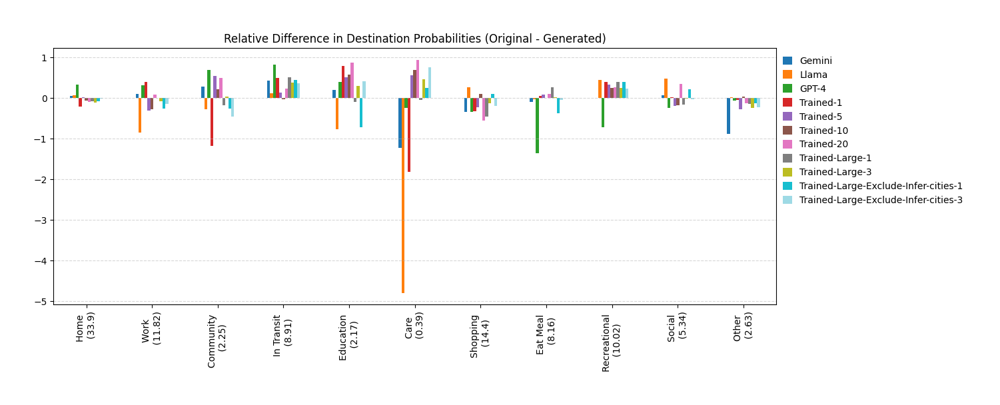

In [46]:
df_t = pd.concat(
    [
        (res_1[['SF_orig']].sub(res_1['Gemini'], axis=0)*100) / (res_1[['SF_orig']]*100),
        (res_1[['SF_orig']].sub(res_1['Llama'], axis=0)*100) / (res_1[['SF_orig']]*100),
        (res_1[['SF_orig']].sub(res_1['GPT-4'], axis=0)*100) / (res_1[['SF_orig']]*100),
        (res_1[['SF_orig']].sub(res_1['Trained-1'], axis=0)*100) / (res_1[['SF_orig']]*100),
        (res_1[['SF_orig']].sub(res_1['Trained-5'], axis=0)*100) / (res_1[['SF_orig']]*100),
        (res_1[['SF_orig']].sub(res_1['Trained-10'], axis=0)*100) / (res_1[['SF_orig']]*100),
        (res_1[['SF_orig']].sub(res_1['Trained-20'], axis=0)*100) / (res_1[['SF_orig']]*100),
        (res_1[['SF_orig']].sub(res_1['Trained-Large-1'], axis=0)*100) / (res_1[['SF_orig']]*100),
        (res_1[['SF_orig']].sub(res_1['Trained-Large-3'], axis=0)*100) / (res_1[['SF_orig']]*100),
        (res_1[['SF_orig']].sub(res_1['Trained-Large-Exclude-Infer-cities-1'], axis=0)*100) / (res_1[['SF_orig']]*100),
        (res_1[['SF_orig']].sub(res_1['Trained-Large-Exclude-Infer-cities-3'], axis=0)*100) / (res_1[['SF_orig']]*100),
    ],
    axis=1
)

df_t.columns = [
    'Gemini',
    'Llama',
    'GPT-4',
    'Trained-1',
    'Trained-5',
    'Trained-10',
    'Trained-20',
    'Trained-Large-1',
    'Trained-Large-3',
    'Trained-Large-Exclude-Infer-cities-1',
    'Trained-Large-Exclude-Infer-cities-3',
]
df_t.rename(index=rename_dict, inplace=True)
df_t.plot.bar(
    title='Relative Difference in Destination Probabilities (Original - Generated)',
    figsize=(14, 5),
    cmap='tab20'
)
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.legend(loc='upper right', bbox_to_anchor=(1.27, 1))
plt.show()

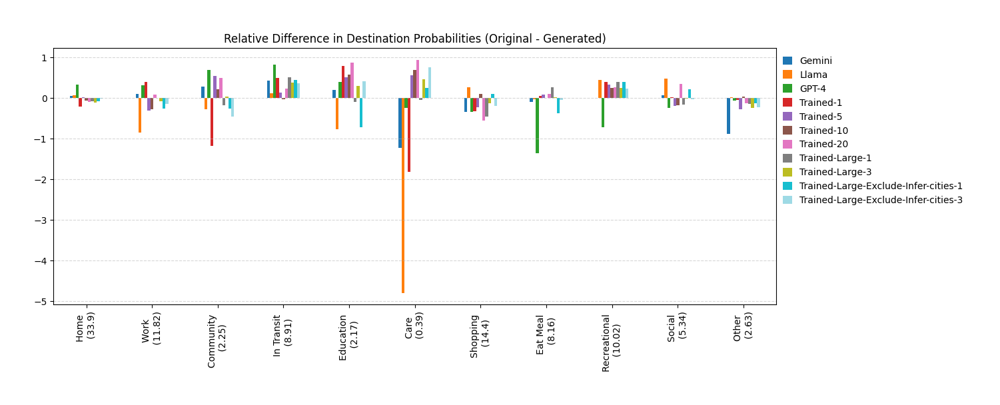

In [47]:
df_t = pd.concat(
    [
        (res_1[['SF_orig']].sub(res_1['Gemini'], axis=0)*100) / (res_1[['SF_orig']]*100),
        (res_1[['SF_orig']].sub(res_1['Llama'], axis=0)*100) / (res_1[['SF_orig']]*100),
        (res_1[['SF_orig']].sub(res_1['GPT-4'], axis=0)*100) / (res_1[['SF_orig']]*100),
        (res_1[['SF_orig']].sub(res_1['Trained-1'], axis=0)*100) / (res_1[['SF_orig']]*100),
        (res_1[['SF_orig']].sub(res_1['Trained-5'], axis=0)*100) / (res_1[['SF_orig']]*100),
        (res_1[['SF_orig']].sub(res_1['Trained-10'], axis=0)*100) / (res_1[['SF_orig']]*100),
        (res_1[['SF_orig']].sub(res_1['Trained-20'], axis=0)*100) / (res_1[['SF_orig']]*100),
        (res_1[['SF_orig']].sub(res_1['Trained-Large-1'], axis=0)*100) / (res_1[['SF_orig']]*100),
        (res_1[['SF_orig']].sub(res_1['Trained-Large-3'], axis=0)*100) / (res_1[['SF_orig']]*100),
        (res_1[['SF_orig']].sub(res_1['Trained-Large-Exclude-Infer-cities-1'], axis=0)*100) / (res_1[['SF_orig']]*100),
        (res_1[['SF_orig']].sub(res_1['Trained-Large-Exclude-Infer-cities-3'], axis=0)*100) / (res_1[['SF_orig']]*100),
    ],
    axis=1
)

df_t.columns = [
    'Gemini',
    'Llama',
    'GPT-4',
    'Trained-1',
    'Trained-5',
    'Trained-10',
    'Trained-20',
    'Trained-Large-1',
    'Trained-Large-3',
    'Trained-Large-Exclude-Infer-cities-1',
    'Trained-Large-Exclude-Infer-cities-3',
]
df_t.rename(index=rename_dict, inplace=True)
df_t.plot.bar(
    title='Relative Difference in Destination Probabilities (Original - Generated)',
    figsize=(14, 5),
    cmap='tab20'
)
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.legend(loc='upper right', bbox_to_anchor=(1.27, 1))
plt.show()

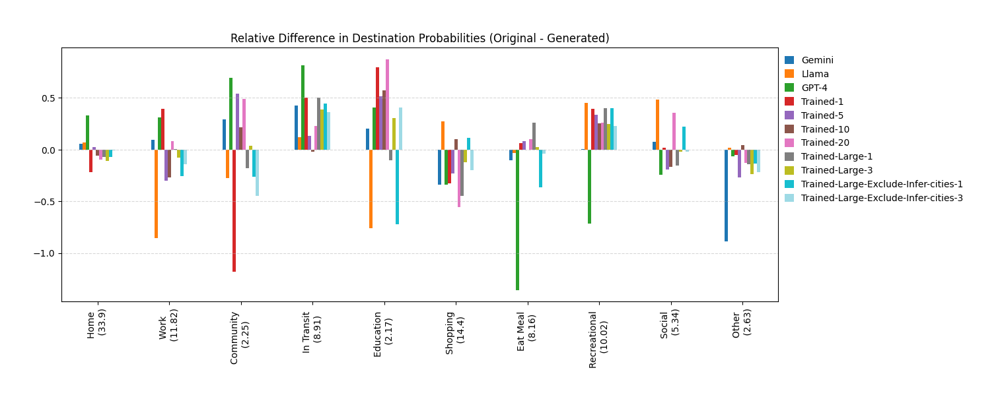

In [48]:
df_t.loc[~(df_t.index.str.contains('Care'))].plot.bar(
    title='Relative Difference in Destination Probabilities (Original - Generated)',
    figsize=(14, 5),
    cmap='tab20'
)
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.legend(loc='upper right', bbox_to_anchor=(1.27, 1))
plt.show()

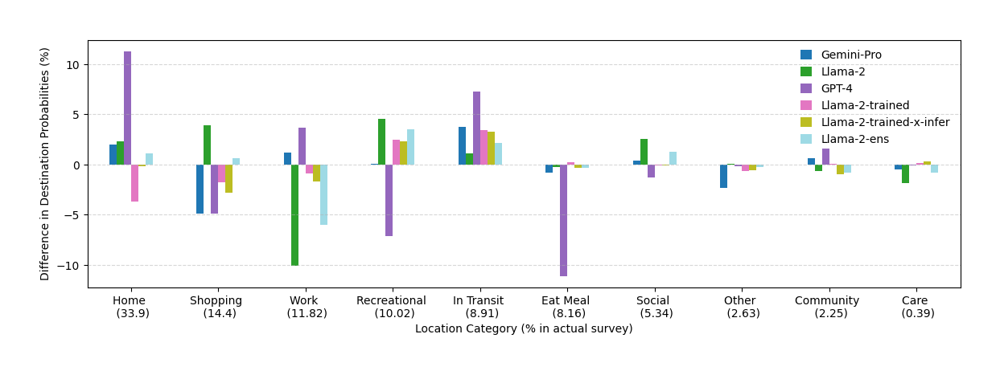

In [149]:
df_t = pd.concat(
    [
        res_1[['SF_orig']].sub(res_1['Gemini'], axis=0)*100,
        res_1[['SF_orig']].sub(res_1['Llama'], axis=0)*100,
        res_1[['SF_orig']].sub(res_1['GPT-4'], axis=0)*100,
        # res_1[['SF_orig']].sub(res_1['Trained-1'], axis=0)*100,
        # res_1[['SF_orig']].sub(res_1['Trained-5'], axis=0)*100,
        # res_1[['SF_orig']].sub(res_1['Trained-10'], axis=0)*100,
        # res_1[['SF_orig']].sub(res_1['Trained-20'], axis=0)*100,
        # res_1[['SF_orig']].sub(res_1['Trained-Large-1'], axis=0)*100,
        res_1[['SF_orig']].sub(res_1['Trained-Large-3'], axis=0)*100,
        # res_1[['SF_orig']].sub(res_1['Trained-Large-Exclude-Infer-cities-1'], axis=0)*100,
        res_1[['SF_orig']].sub(res_1['Trained-Large-Exclude-Infer-cities-3'], axis=0)*100,
        res_1[['SF_orig']].sub(res_1['Llama-ens'], axis=0)*100,
    ],
    axis=1
)

df_t.columns = [
    'Gemini-Pro',
    'Llama-2',
    'GPT-4',
    # 'Trained-1',
    # 'Trained-5',
    # 'Trained-10',
    # 'Trained-20',
    # 'Trained-Large-1',
    'Llama-2-trained',
    # 'Trained-Large-Exclude-Infer-cities-1',
    'Llama-2-trained-x-infer',
    'Llama-2-ens'
]
df_t.rename(index=rename_dict, inplace=True)
df_t = df_t.reindex(
    [
        'Home \n (33.9)',
        'Shopping \n (14.4)',
        'Work \n (11.82)',
        'Recreational \n (10.02)',
        'In Transit \n (8.91)',
        'Eat Meal \n (8.16)',
        'Social \n (5.34)',
        'Other \n (2.63)',
        'Community \n (2.25)',
        'Care \n (0.39)'
    ],
    axis=0,
)
df_t.plot.bar(
    # title='Difference in Destination Probabilities (Original - Generated)',
    figsize=(14, 4),
    cmap='tab20'
)
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.xlabel('Location Category (% in actual survey)')
plt.ylabel('Difference in Destination Probabilities (%)')
plt.xticks(rotation=0)
# plt.legend(loc='upper right', bbox_to_anchor=(1, 1))
plt.legend(loc='best')
plt.show()

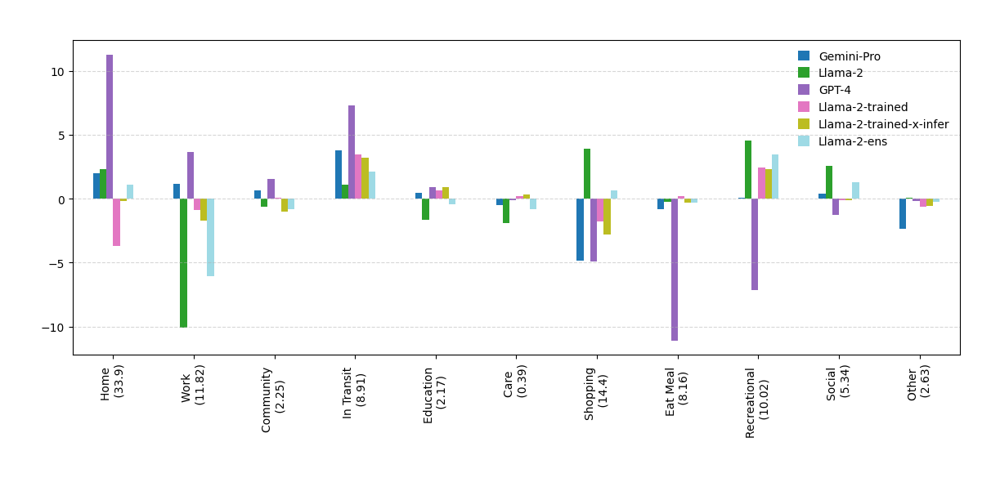

In [50]:
df_t = pd.concat(
    [
        res_1[['SF_orig']].sub(res_1['Gemini'], axis=0)*100,
        res_1[['SF_orig']].sub(res_1['Llama'], axis=0)*100,
        res_1[['SF_orig']].sub(res_1['GPT-4'], axis=0)*100,
        # res_1[['SF_orig']].sub(res_1['Trained-1'], axis=0)*100,
        # res_1[['SF_orig']].sub(res_1['Trained-5'], axis=0)*100,
        # res_1[['SF_orig']].sub(res_1['Trained-10'], axis=0)*100,
        # res_1[['SF_orig']].sub(res_1['Trained-20'], axis=0)*100,
        # res_1[['SF_orig']].sub(res_1['Trained-Large-1'], axis=0)*100,
        res_1[['SF_orig']].sub(res_1['Trained-Large-3'], axis=0)*100,
        # res_1[['SF_orig']].sub(res_1['Trained-Large-Exclude-Infer-cities-1'], axis=0)*100,
        res_1[['SF_orig']].sub(res_1['Trained-Large-Exclude-Infer-cities-3'], axis=0)*100,
        res_1[['SF_orig']].sub(res_1['Llama-ens'], axis=0)*100,
    ],
    axis=1
)

df_t.columns = [
    'Gemini-Pro',
    'Llama-2',
    'GPT-4',
    # 'Trained-1',
    # 'Trained-5',
    # 'Trained-10',
    # 'Trained-20',
    # 'Trained-Large-1',
    'Llama-2-trained',
    # 'Trained-Large-Exclude-Infer-cities-1',
    'Llama-2-trained-x-infer',
    'Llama-2-ens'
]
df_t.rename(index=rename_dict, inplace=True)
df_t.plot.bar(
    # title='Difference in Destination Probabilities (Original - Generated)',
    figsize=(14, 5),
    cmap='tab20'
)
plt.grid(axis='y', linestyle='--', alpha=0.5)
# plt.legend(loc='upper right', bbox_to_anchor=(1, 1))
plt.legend(loc='best')
plt.show()

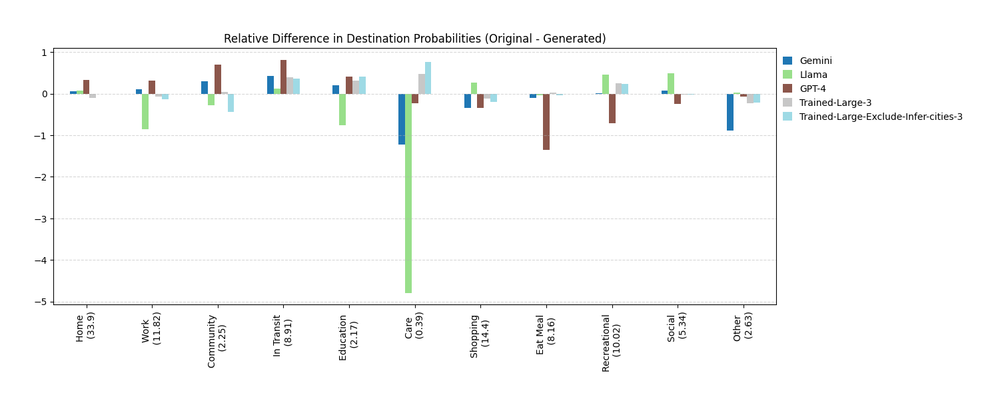

In [51]:
df_t = pd.concat(
    [
        (res_1[['SF_orig']].sub(res_1['Gemini'], axis=0)*100) / (res_1[['SF_orig']]*100),
        (res_1[['SF_orig']].sub(res_1['Llama'], axis=0)*100) / (res_1[['SF_orig']]*100),
        (res_1[['SF_orig']].sub(res_1['GPT-4'], axis=0)*100) / (res_1[['SF_orig']]*100),
        # (res_1[['SF_orig']].sub(res_1['Trained-1'], axis=0)*100) / (res_1[['SF_orig']]*100),
        # (res_1[['SF_orig']].sub(res_1['Trained-5'], axis=0)*100) / (res_1[['SF_orig']]*100),
        # (res_1[['SF_orig']].sub(res_1['Trained-10'], axis=0)*100) / (res_1[['SF_orig']]*100),
        # (res_1[['SF_orig']].sub(res_1['Trained-20'], axis=0)*100) / (res_1[['SF_orig']]*100),
        # (res_1[['SF_orig']].sub(res_1['Trained-Large-1'], axis=0)*100) / (res_1[['SF_orig']]*100),
        (res_1[['SF_orig']].sub(res_1['Trained-Large-3'], axis=0)*100) / (res_1[['SF_orig']]*100),
        # (res_1[['SF_orig']].sub(res_1['Trained-Large-Exclude-Infer-cities-1'], axis=0)*100) / (res_1[['SF_orig']]*100),
        (res_1[['SF_orig']].sub(res_1['Trained-Large-Exclude-Infer-cities-3'], axis=0)*100) / (res_1[['SF_orig']]*100),
    ],
    axis=1
)

df_t.columns = [
    'Gemini',
    'Llama',
    'GPT-4',
    # 'Trained-1',
    # 'Trained-5',
    # 'Trained-10',
    # 'Trained-20',
    # 'Trained-Large-1',
    'Trained-Large-3',
    # 'Trained-Large-Exclude-Infer-cities-1',
    'Trained-Large-Exclude-Infer-cities-3',
]
df_t.rename(index=rename_dict, inplace=True)
df_t.plot.bar(
    title='Relative Difference in Destination Probabilities (Original - Generated)',
    figsize=(14, 5),
    cmap='tab20'
)
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.legend(loc='upper right', bbox_to_anchor=(1.27, 1))
plt.show()

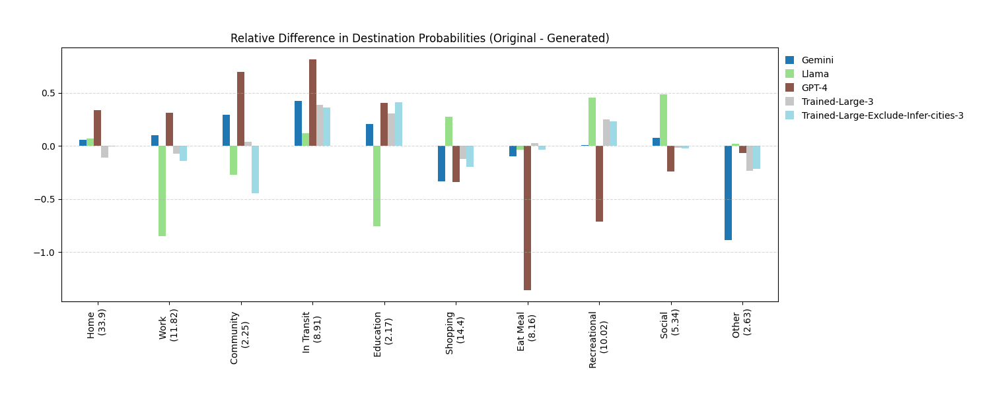

In [52]:
df_t.loc[~(df_t.index.str.contains('Care'))].plot.bar(
    title='Relative Difference in Destination Probabilities (Original - Generated)',
    figsize=(14, 5),
    cmap='tab20'
)
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.legend(loc='upper right', bbox_to_anchor=(1.27, 1))
plt.show()

In [53]:
res_2 = get_transient_destination_probabilities(order=2)
res_2

,SF_orig,Gemini,Llama,GPT-4,Trained-1,Trained-5,Trained-10,Trained-20,Trained-Large-1,Trained-Large-3,Trained-Large-Exclude-Infer-cities-1,Trained-Large-Exclude-Infer-cities-3,Llama-ens
Home,0.425637,0.377101,0.370992,0.271449,0.546097,0.425343,0.484615,0.478818,0.450389,0.475584,0.481389,0.442946,0.404540
Work,0.079738,0.061800,0.150273,0.091362,0.039562,0.094108,0.080268,0.078874,0.075446,0.079843,0.074167,0.082896,0.118859
Community,0.017229,0.015406,0.030971,0.005564,0.027552,0.004863,0.007692,0.004181,0.016918,0.015506,0.019167,0.023221,0.027357
In Transit,0.082536,0.046919,0.074591,0.013470,0.039209,0.073227,0.085953,0.058250,0.034979,0.048831,0.048611,0.046692,0.061583
Education,0.006921,0.008578,0.031407,0.011420,0.002119,0.003146,0.002007,0.001115,0.009831,0.006249,0.013056,0.002747,0.018044
Care,0.003534,0.007528,0.021374,0.003807,0.006358,0.000572,0.000334,0.000279,0.003658,0.001851,0.001667,0.000499,0.011641
Shopping,0.141216,0.179797,0.108615,0.200293,0.162487,0.182208,0.124415,0.208194,0.209648,0.157602,0.129722,0.173283,0.138766
Eat Meal,0.084745,0.097689,0.095529,0.112152,0.073472,0.075801,0.088963,0.061315,0.062872,0.077760,0.118056,0.090637,0.093248
Recreational,0.083640,0.102941,0.060851,0.179795,0.043094,0.057208,0.053846,0.045429,0.052812,0.060403,0.051111,0.064170,0.062398
Social,0.050434,0.053396,0.027045,0.078477,0.038502,0.055492,0.054515,0.029543,0.054641,0.045823,0.034722,0.045693,0.035739


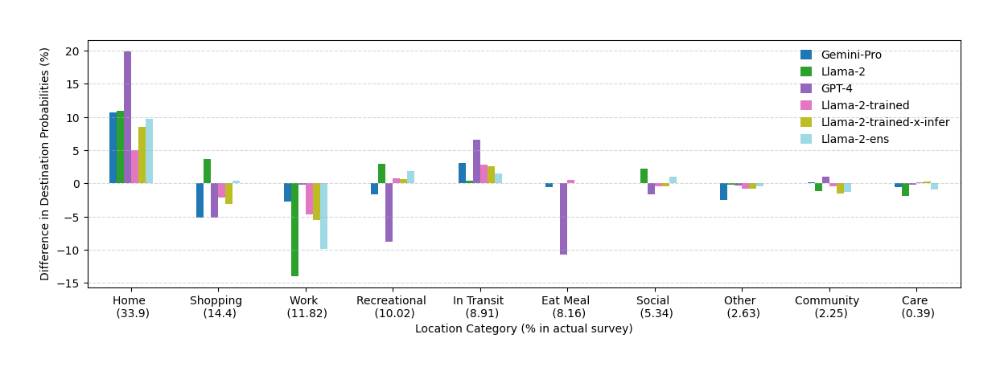

In [54]:
df_t = pd.concat(
    [
        res_2[['SF_orig']].sub(res_1['Gemini'], axis=0)*100,
        res_2[['SF_orig']].sub(res_1['Llama'], axis=0)*100,
        res_2[['SF_orig']].sub(res_1['GPT-4'], axis=0)*100,
        # res_1[['SF_orig']].sub(res_1['Trained-1'], axis=0)*100,
        # res_1[['SF_orig']].sub(res_1['Trained-5'], axis=0)*100,
        # res_1[['SF_orig']].sub(res_1['Trained-10'], axis=0)*100,
        # res_1[['SF_orig']].sub(res_1['Trained-20'], axis=0)*100,
        # res_1[['SF_orig']].sub(res_1['Trained-Large-1'], axis=0)*100,
        res_2[['SF_orig']].sub(res_1['Trained-Large-3'], axis=0)*100,
        # res_1[['SF_orig']].sub(res_1['Trained-Large-Exclude-Infer-cities-1'], axis=0)*100,
        res_2[['SF_orig']].sub(res_1['Trained-Large-Exclude-Infer-cities-3'], axis=0)*100,
        res_2[['SF_orig']].sub(res_1['Llama-ens'], axis=0)*100,
    ],
    axis=1
)

df_t.columns = [
    'Gemini-Pro',
    'Llama-2',
    'GPT-4',
    # 'Trained-1',
    # 'Trained-5',
    # 'Trained-10',
    # 'Trained-20',
    # 'Trained-Large-1',
    'Llama-2-trained',
    # 'Trained-Large-Exclude-Infer-cities-1',
    'Llama-2-trained-x-infer',
    'Llama-2-ens'
]
df_t.rename(index=rename_dict, inplace=True)
df_t = df_t.reindex(
    [
        'Home \n (33.9)',
        'Shopping \n (14.4)',
        'Work \n (11.82)',
        'Recreational \n (10.02)',
        'In Transit \n (8.91)',
        'Eat Meal \n (8.16)',
        'Social \n (5.34)',
        'Other \n (2.63)',
        'Community \n (2.25)',
        'Care \n (0.39)'
    ],
    axis=0,
)
df_t.plot.bar(
    # title='Difference in Destination Probabilities (Original - Generated)',
    figsize=(14, 4),
    cmap='tab20'
)
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.xlabel('Location Category (% in actual survey)')
plt.ylabel('Difference in Destination Probabilities (%)')
plt.xticks(rotation=0)
# plt.legend(loc='upper right', bbox_to_anchor=(1, 1))
plt.legend(loc='best')
plt.show()

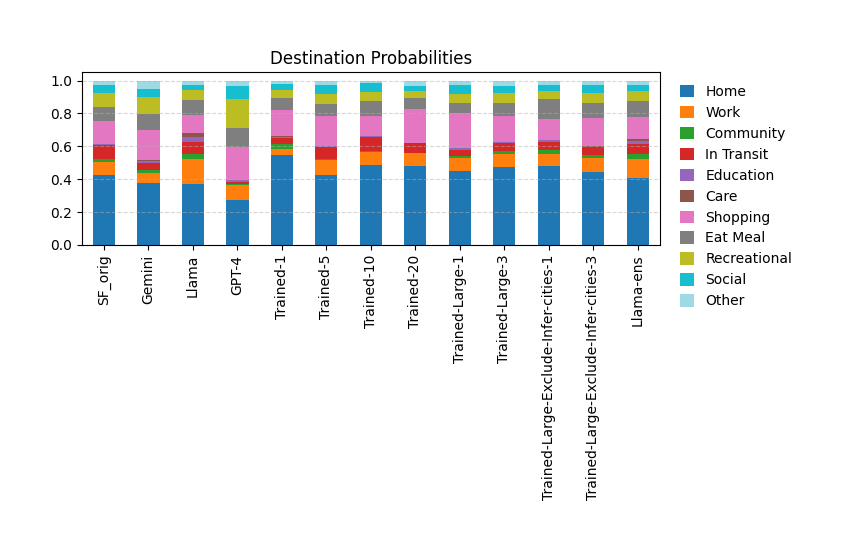

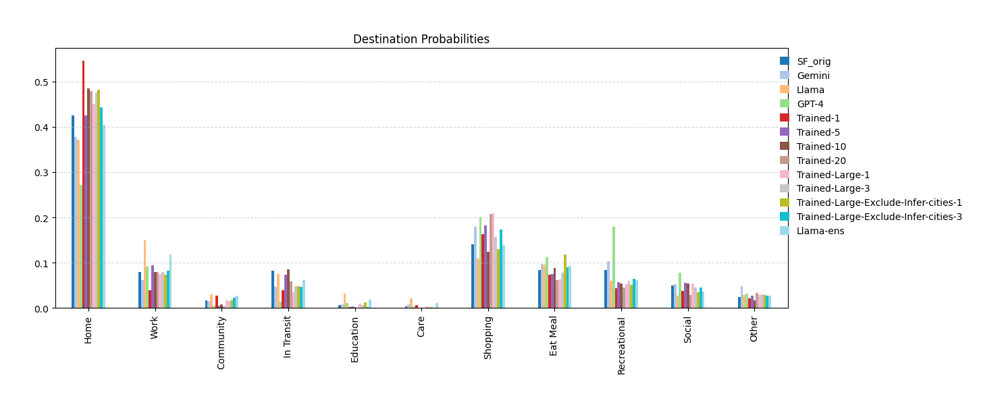

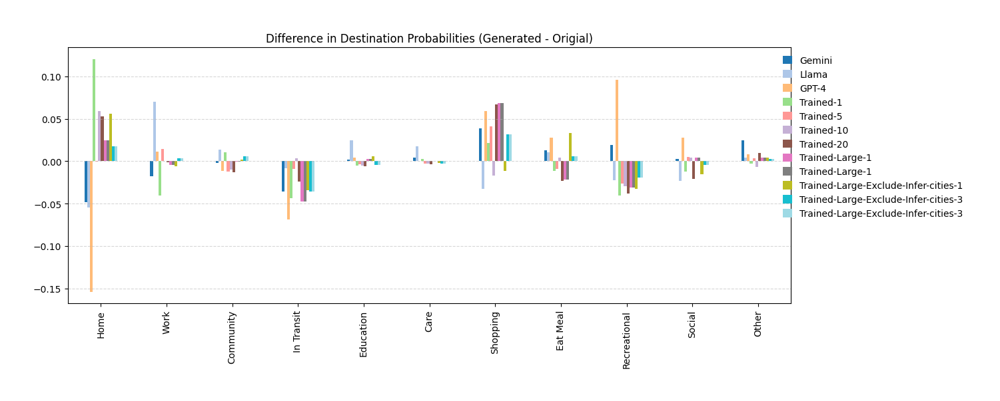

In [55]:
create_plots_for_destination_prob(res_2)

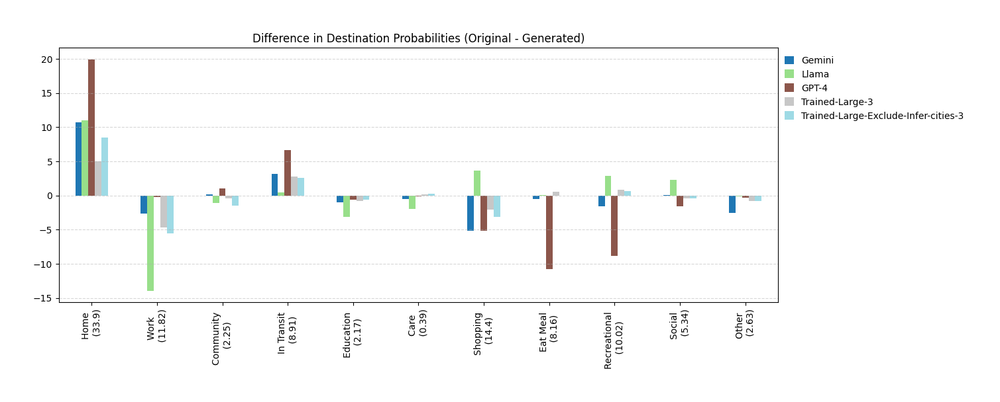

In [56]:
df_t = pd.concat(
    [
        res_2[['SF_orig']].sub(res_1['Gemini'], axis=0)*100,
        res_2[['SF_orig']].sub(res_1['Llama'], axis=0)*100,
        res_2[['SF_orig']].sub(res_1['GPT-4'], axis=0)*100,
        # res_1[['SF_orig']].sub(res_1['Trained-1'], axis=0)*100,
        # res_1[['SF_orig']].sub(res_1['Trained-5'], axis=0)*100,
        # res_1[['SF_orig']].sub(res_1['Trained-10'], axis=0)*100,
        # res_1[['SF_orig']].sub(res_1['Trained-20'], axis=0)*100,
        # res_1[['SF_orig']].sub(res_1['Trained-Large-1'], axis=0)*100,
        res_2[['SF_orig']].sub(res_1['Trained-Large-3'], axis=0)*100,
        # res_1[['SF_orig']].sub(res_1['Trained-Large-Exclude-Infer-cities-1'], axis=0)*100,
        res_2[['SF_orig']].sub(res_1['Trained-Large-Exclude-Infer-cities-3'], axis=0)*100,
    ],
    axis=1
)

df_t.columns = [
    'Gemini',
    'Llama',
    'GPT-4',
    # 'Trained-1',
    # 'Trained-5',
    # 'Trained-10',
    # 'Trained-20',
    # 'Trained-Large-1',
    'Trained-Large-3',
    # 'Trained-Large-Exclude-Infer-cities-1',
    'Trained-Large-Exclude-Infer-cities-3',
]
df_t.rename(index=rename_dict, inplace=True)
df_t.plot.bar(
    title='Difference in Destination Probabilities (Original - Generated)',
    figsize=(14, 5),
    cmap='tab20'
)
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.legend(loc='upper right', bbox_to_anchor=(1.27, 1))
plt.show()

## Activity Chains

In [57]:
# def activity_chains_analysis(a,b,c,d,e,f,g,h,i,j,k,l):
#     a = a['loc_type'].apply(tuple).value_counts()
#     b = b['loc_type_new'].apply(tuple).value_counts()
#     c = c['loc_type_new'].apply(tuple).value_counts()
#     d = d['loc_type_new'].apply(tuple).value_counts()
#     e = e['loc_type_new'].apply(tuple).value_counts()
#     f = f['loc_type_new'].apply(tuple).value_counts()
#     g = g['loc_type_new'].apply(tuple).value_counts()
#     h = h['loc_type_new'].apply(tuple).value_counts()
#     i = i['loc_type_new'].apply(tuple).value_counts()
#     j = j['loc_type_new'].apply(tuple).value_counts()
#     k = k['loc_type_new'].apply(tuple).value_counts()
#     l = l['loc_type_new'].apply(tuple).value_counts()
#     a = a / a.sum() * 100
#     b = b / b.sum() * 100
#     c = c / c.sum() * 100
#     d = d / d.sum() * 100
#     e = e / e.sum() * 100
#     f = f / f.sum() * 100
#     g = g / g.sum() * 100
#     h = h / h.sum() * 100
#     i = i / i.sum() * 100
#     j = j / j.sum() * 100
#     k = k / k.sum() * 100
#     l = l / l.sum() * 100
#     print(f'Gemini: Original chains not present in generated % (mean): {a[a.index.difference(b.index)].values.mean()}')
#     print(f'Gemini: Original chains not present in generated % (max): {a[a.index.difference(b.index)].values.max()}')
#     print(f'Gemini: Original chains not present in generated % (min): {a[a.index.difference(b.index)].values.min()}')
#     print(f'Llama: Original chains not present in generated % (mean): {a[a.index.difference(c.index)].values.mean()}')
#     print(f'Llama: Original chains not present in generated % (max): {a[a.index.difference(c.index)].values.max()}')
#     print(f'Llama: Original chains not present in generated % (min): {a[a.index.difference(c.index)].values.min()}')
#     print(f'Gpt4: Original chains not present in generated % (mean): {a[a.index.difference(d.index)].values.mean()}')
#     print(f'Gpt4: Original chains not present in generated % (max): {a[a.index.difference(d.index)].values.max()}')
#     print(f'Gpt4: Original chains not present in generated % (min): {a[a.index.difference(d.index)].values.min()}')
#     print(f'Trained-1 Original chains not present in generated % (mean): {a[a.index.difference(e.index)].values.mean()}')
#     print(f'Trained-1 Original chains not present in generated % (max): {a[a.index.difference(e.index)].values.max()}')
#     print(f'Trained-1 Original chains not present in generated % (min): {a[a.index.difference(e.index)].values.min()}')
#     print(f'Trained-5 Original chains not present in generated % (mean): {a[a.index.difference(f.index)].values.mean()}')
#     print(f'Trained-5 Original chains not present in generated % (max): {a[a.index.difference(f.index)].values.max()}')
#     print(f'Trained-5 Original chains not present in generated % (min): {a[a.index.difference(f.index)].values.min()}')
#     print(f'Trained-10 Original chains not present in generated % (mean): {a[a.index.difference(g.index)].values.mean()}')
#     print(f'Trained-10 Original chains not present in generated % (max): {a[a.index.difference(g.index)].values.max()}')
#     print(f'Trained-10 Original chains not present in generated % (min): {a[a.index.difference(g.index)].values.min()}')
#     print(f'Trained-20 Original chains not present in generated % (mean): {a[a.index.difference(h.index)].values.mean()}')
#     print(f'Trained-20 Original chains not present in generated % (max): {a[a.index.difference(h.index)].values.max()}')
#     print(f'Trained-20 Original chains not present in generated % (min): {a[a.index.difference(h.index)].values.min()}')
#     print(f'Trained-Large-1 Original chains not present in generated % (mean): {a[a.index.difference(i.index)].values.mean()}')
#     print(f'Trained-Large-1 Original chains not present in generated % (max): {a[a.index.difference(i.index)].values.max()}')
#     print(f'Trained-Large-3 Original chains not present in generated % (mean): {a[a.index.difference(j.index)].values.mean()}')
#     print(f'Trained-Large-3 Original chains not present in generated % (max): {a[a.index.difference(j.index)].values.max()}')
#     print(f'Trained-Large-Exclude-Infer-Cities-1 Original chains not present in generated % (mean): {a[a.index.difference(k.index)].values.mean()}')
#     print(f'Trained-Large-Exclude-Infer-Cities-1 Original chains not present in generated % (max): {a[a.index.difference(k.index)].values.max()}')
#     print(f'Trained-Large-Exclude-Infer-Cities-3 Original chains not present in generated % (mean): {a[a.index.difference(l.index)].values.mean()}')
#     print(f'Trained-Large-Exclude-Infer-Cities-3 Original chains not present in generated % (max): {a[a.index.difference(l.index)].values.max()}')
# 
#     print('Gemini')
#     overlap = 0
#     for value in a.index.intersection(b.index):
#         overlap += a[value]
#     
#     print(f"The values in original data present in generated data: {overlap}")
#     overlap = 0
#     for value in a.index.intersection(b.index):
#         overlap += min(a[value], b[value])
# 
#     print(f"Exact overlap: {overlap}")
# 
#     print('LLama')
#     overlap = 0
#     for value in a.index.intersection(c.index):
#         overlap += a[value]
#     
#     print(f"The values in original data present in generated data: {overlap}")
#     overlap = 0
#     for value in a.index.intersection(c.index):
#         overlap += min(a[value], c[value])
# 
#     print(f"Exact overlap: {overlap}")
# 
#     print('Gpt4')
#     overlap = 0
#     for value in a.index.intersection(d.index):
#         overlap += a[value]
#     
#     print(f"The values in original data present in generated data: {overlap}")
#     overlap = 0
#     for value in a.index.intersection(d.index):
#         overlap += min(a[value], d[value])
# 
#     print(f"Exact overlap: {overlap}")
# 
#     print('Trained-1')
#     overlap = 0
#     for value in a.index.intersection(e.index):
#         overlap += a[value]
#     
#     print(f"The values in original data present in generated data: {overlap}")
#     overlap = 0
#     for value in a.index.intersection(e.index):
#         overlap += min(a[value], e[value])
# 
#     print(f"Exact overlap: {overlap}")
# 
#     print('Trained-5')
#     overlap = 0
#     for value in a.index.intersection(f.index):
#         overlap += a[value]
#     
#     print(f"The values in original data present in generated data: {overlap}")
#     overlap = 0
#     for value in a.index.intersection(f.index):
#         overlap += min(a[value], f[value])
# 
#     print(f"Exact overlap: {overlap}")
# 
#     print('Trained-10')
#     overlap = 0
#     for value in a.index.intersection(g.index):
#         overlap += a[value]
#     
#     print(f"The values in original data present in generated data: {overlap}")
#     overlap = 0
#     for value in a.index.intersection(g.index):
#         overlap += min(a[value], g[value])
# 
#     print(f"Exact overlap: {overlap}")
# 
#     print('Trained-20')
#     overlap = 0
#     for value in a.index.intersection(h.index):
#         overlap += a[value]
#     
#     print(f"The values in original data present in generated data: {overlap}")
#     overlap = 0
#     for value in a.index.intersection(h.index):
#         overlap += min(a[value], h[value])
# 
#     print(f"Exact overlap: {overlap}")
# 
#     print('Trained-Large-1')
#     overlap = 0
#     for value in a.index.intersection(i.index):
#         overlap += a[value]
#     
#     print(f"The values in original data present in generated data: {overlap}")
#     overlap = 0
#     for value in a.index.intersection(i.index):
#         overlap += min(a[value], i[value])
#     print(f"Exact overlap: {overlap}")
# 
#     print('Trained-Large-3')
#     overlap = 0
#     for value in a.index.intersection(j.index):
#         overlap += a[value]
#     
#     print(f"The values in original data present in generated data: {overlap}")
#     overlap = 0
#     for value in a.index.intersection(j.index):
#         overlap += min(a[value], j[value])
#     print(f"Exact overlap: {overlap}")
# 
#     print('Trained-Large-Exclude-Infer-Cities-1')
#     overlap = 0
#     for value in a.index.intersection(k.index):
#         overlap += a[value]
#     
#     print(f"The values in original data present in generated data: {overlap}")
#     overlap = 0
#     for value in a.index.intersection(k.index):
#         overlap += min(a[value], k[value])
# 
#     print(f"Exact overlap: {overlap}")
# 
#     print('Trained-Large-Exclude-Infer-Cities-3')
#     overlap = 0
#     for value in a.index.intersection(l.index):
#         overlap += a[value]
#     
#     print(f"The values in original data present in generated data: {overlap}")
#     overlap = 0
#     for value in a.index.intersection(l.index):
#         overlap += min(a[value], l[value])
# 
#     print(f"Exact overlap: {overlap}")
# 
#     return (
#         a[a.index.difference(b.index)].values,
#         a[a.index.difference(c.index)].values,
#         a[a.index.difference(d.index)].values,
#         a[a.index.difference(e.index)].values,
#         a[a.index.difference(f.index)].values,
#         a[a.index.difference(g.index)].values,
#         a[a.index.difference(h.index)].values,
#         b[b.index.difference(a.index)].values,
#         c[c.index.difference(a.index)].values,
#         d[d.index.difference(a.index)].values,
#         e[e.index.difference(a.index)].values,
#         f[f.index.difference(a.index)].values,
#         g[g.index.difference(a.index)].values,
#         h[h.index.difference(a.index)].values,
#     )
# 

In [58]:
# a_sf,b_sf,c_sf,d_sf, e_sf, f_sf, g_sf, h_sf, i_sf, j_sf, k_sf, l_sf, m_sf, n_sf = activity_chains_analysis(
#     data_t_sf,
#     t_sf_gemini,
#     t_sf_llama,
#     t_sf_gpt4,
#     t_sf_llama_trained_1,
#     t_sf_llama_trained_5,
#     t_sf_llama_trained_10,
#     t_sf_llama_trained_20,
#     t_sf_llama_trained_large_1,
#     t_sf_llama_trained_large_3,
#     t_sf_llama_trained_large_exclude_infer_cities_1,
#     t_sf_llama_trained_large_exclude_infer_cities_3,
# )

In [151]:
def sf_activity_chains_analysis(t_all_orig, t_sf_orig, t_sf_gen, name='LLama'):
    print(name)
    t_all_orig = t_all_orig['loc_type'].apply(tuple).value_counts()
    t_sf_orig = t_sf_orig['loc_type'].apply(tuple).value_counts()
    t_sf_gen = t_sf_gen['loc_type_new'].apply(tuple).value_counts()
    t_all_orig = t_all_orig / t_all_orig.sum() * 100
    t_sf_orig = t_sf_orig / t_sf_orig.sum() * 100
    t_sf_gen = t_sf_gen / t_sf_gen.sum() * 100
    
    
    val_1 = len(t_sf_gen.index.intersection(t_sf_orig.index)) / len(t_sf_gen.index)
        
    print(f"% of Generated Chains Present in Actual Chains: {round(val_1 * 100, 2)}")
    
    overlap_1 = 0
    for value in t_sf_gen.index.intersection(t_sf_orig.index):
        overlap_1 += t_sf_gen[value]
    
    print(f"Weight of Generated Chains Present in Actual Chains: {round(overlap_1, 2)}")
    
    val_2 = len(t_sf_gen.index.intersection(t_all_orig.index)) / len(t_sf_gen.index)
        
    print(f"% of Generated Chains Present in All Actual Chains: {round(val_2 * 100, 2)}")
    
    
    overlap_2 = 0
    for value in t_sf_gen.index.intersection(t_all_orig.index):
        overlap_2 += t_sf_gen[value]
    
    print(f"Weight of Generated Chains Present in All Actual Chains: {round(overlap_2, 2)}")
    
    val_3 = len(t_sf_gen.index.intersection(t_sf_orig.index)) / len(t_sf_orig.index)
        
    print(f"% of Actual Chains Present in Generated Chains: {round(val_3 * 100, 2)}")
    
    overlap_3 = 0
    for value in t_sf_gen.index.intersection(t_sf_orig.index):
        overlap_3 += t_sf_orig[value]
    
    print(f"Weight of Actual Chains Present in Generated Chains: {round(overlap_3, 2)}")
    
    overlap = 0
    for value in t_sf_gen.index.intersection(t_sf_orig.index):
        overlap += min(t_sf_gen[value], t_sf_orig[value])
    
    print(f"Weight Overlap of Actual Chains and Generated Chains: {round(overlap, 2)}")

    return val_1, overlap_1, val_2, overlap_2, val_3, overlap_3, overlap
    

In [156]:
t_sf_gen = t_sf_llama_trained_large_3
t_all_orig = data_t_all['loc_type'].apply(tuple).value_counts()
t_sf_gen = t_sf_gen['loc_type_new'].apply(tuple).value_counts()

In [165]:
import editdistance

In [172]:
all_orig = [t_all_orig.index.to_list()][0]

In [180]:
ed_1 = []
ed_2 = []
ed_3 = []
ed_more = []
for each in t_sf_gen.index.difference(t_all_orig.index).to_list():
    eds = []
    for orig in all_orig:
        eds.append(editdistance.eval(each, orig))
    if 1 in eds:
        ed_1.append(each)
    elif 2 in eds:
        ed_2.append(each)
    elif 3 in eds:
        ed_3.append(each)
    else:
        ed_more.append(each)

In [181]:
print(len(ed_1))
print(len(ed_2))
print(len(ed_3))
print(len(ed_more))

174
57
16
7


In [187]:
174+ 57+16+7

254

In [188]:
print((174/ 254)*100)
print((57/254)*100)
print((16/254)*100)
print((7/254)*100)

68.50393700787401
22.440944881889763
6.299212598425196
2.7559055118110236


In [ ]:
t_sf_llama_trained_large_3.index.intersection(data_t_sf.index)

In [154]:
val_1_gemini, overlap_1_gemini, val_2_gemini, overlap_2_gemini, val_3_gemini, overlap_3_gemini, overlap_gemini = sf_activity_chains_analysis(data_t_all, data_t_sf, t_sf_gemini, name='gemini')
val_1_llama, overlap_1_llama, val_2_llama, overlap_2_llama, val_3_llama, overlap_3_llama, overlap_llama = sf_activity_chains_analysis(data_t_all, data_t_sf, t_sf_llama, name='llama')
val_1_gpt4, overlap_1_gpt4, val_2_gpt4, overlap_2_gpt4, val_3_gpt4, overlap_3_gpt4, overlap_gpt4 = sf_activity_chains_analysis(data_t_all, data_t_sf, t_sf_gpt4, name='gpt4')
# val_1_llama_trained_1, overlap_1_llama_trained_1, val_2_llama_trained_1, overlap_2_llama_trained_1, val_3_llama_trained_1, overlap_3_llama_trained_1, overlap_llama_trained_1 = sf_activity_chains_analysis(data_t_all, data_t_sf, t_sf_llama_trained_1, name='llama_trained_1')
# val_1_llama_trained_5, overlap_1_llama_trained_5, val_2_llama_trained_5, overlap_2_llama_trained_5, val_3_llama_trained_5, overlap_3_llama_trained_5, overlap_llama_trained_5 = sf_activity_chains_analysis(data_t_all, data_t_sf, t_sf_llama_trained_5, name='llama_trained_5')
# val_1_llama_trained_10, overlap_1_llama_trained_10, val_2_llama_trained_10, overlap_2_llama_trained_10, val_3_llama_trained_10, overlap_3_llama_trained_10, overlap_llama_trained_10 = sf_activity_chains_analysis(data_t_all, data_t_sf, t_sf_llama_trained_10, name='llama_trained_10')
# val_1_llama_trained_20, overlap_1_llama_trained_20, val_2_llama_trained_20, overlap_2_llama_trained_20, val_3_llama_trained_20, overlap_3_llama_trained_20, overlap_llama_trained_20 = sf_activity_chains_analysis(data_t_all, data_t_sf, t_sf_llama_trained_20, name='llama_trained_20')
# val_1_llama_trained_large_1, overlap_1_llama_trained_large_1, val_2_llama_trained_large_1, overlap_2_llama_trained_large_1, val_3_llama_trained_large_1, overlap_3_llama_trained_large_1, overlap_llama_trained_large_1 = sf_activity_chains_analysis(data_t_all, data_t_sf, t_sf_llama_trained_large_1, name='llama_trained_large_1')
val_1_llama_trained_large_3, overlap_1_llama_trained_large_3, val_2_llama_trained_large_3, overlap_2_llama_trained_large_3, val_3_llama_trained_large_3, overlap_3_llama_trained_large_3, overlap_llama_trained_large_3 = sf_activity_chains_analysis(data_t_all, data_t_sf, t_sf_llama_trained_large_3, name='llama_trained_large_3')
# val_1_llama_trained_large_exclude_infer_cities_1, overlap_1_llama_trained_large_exclude_infer_cities_1, val_2_llama_trained_large_exclude_infer_cities_1, overlap_2_llama_trained_large_exclude_infer_cities_1, val_3_llama_trained_large_exclude_infer_cities_1, overlap_3_llama_trained_large_exclude_infer_cities_1, overlap_llama_trained_large_exclude_infer_cities_1 = sf_activity_chains_analysis(data_t_all, data_t_sf, t_sf_llama_trained_large_exclude_infer_cities_1, name='llama_trained_large_exclude_infer_cities_1')
val_1_llama_trained_large_exclude_infer_cities_3, overlap_1_llama_trained_large_exclude_infer_cities_3, val_2_llama_trained_large_exclude_infer_cities_3, overlap_2_llama_trained_large_exclude_infer_cities_3, val_3_llama_trained_large_exclude_infer_cities_3, overlap_3_llama_trained_large_exclude_infer_cities_3, overlap_llama_trained_large_exclude_infer_cities_3 = sf_activity_chains_analysis(data_t_all, data_t_sf, t_sf_llama_trained_large_exclude_infer_cities_3, name='llama_trained_large_exclude_infer_cities_3')
val_1_llama_ens, overlap_1_llama_ens, val_2_llama_ens, overlap_2_llama_ens, val_3_llama_ens, overlap_3_llama_ens, overlap_llama_ens = sf_activity_chains_analysis(data_t_all, data_t_sf, t_sf_llama_ens, name='llama-ens')

gemini
% of Generated Chains Present in Actual Chains: 15.55
Weight of Generated Chains Present in Actual Chains: 29.81
% of Generated Chains Present in All Actual Chains: 46.22
Weight of Generated Chains Present in All Actual Chains: 56.97
% of Actual Chains Present in Generated Chains: 7.77
Weight of Actual Chains Present in Generated Chains: 39.21
Weight Overlap of Actual Chains and Generated Chains: 17.25
llama
% of Generated Chains Present in Actual Chains: 15.54
Weight of Generated Chains Present in Actual Chains: 36.12
% of Generated Chains Present in All Actual Chains: 43.06
Weight of Generated Chains Present in All Actual Chains: 57.39
% of Actual Chains Present in Generated Chains: 6.88
Weight of Actual Chains Present in Generated Chains: 39.14
Weight Overlap of Actual Chains and Generated Chains: 25.42
gpt4
% of Generated Chains Present in Actual Chains: 7.89
Weight of Generated Chains Present in Actual Chains: 11.92
% of Generated Chains Present in All Actual Chains: 40.71


In [195]:
_, _, _, _, _, _, _ = sf_activity_chains_analysis(data_t_all, data_t_dc, t_dc_gemini, name='gemini')
_, _, _, _, _, _, _ = sf_activity_chains_analysis(data_t_all, data_t_dc, t_dc_llama, name='llama')
_, _, _, _, _, _, _ = sf_activity_chains_analysis(data_t_all, data_t_dc, t_dc_gpt4, name='gpt4')
_, _, _, _, _, _, _ = sf_activity_chains_analysis(data_t_all, data_t_dc, t_dc_llama_trained_large_exclude_infer_cities_3, name='llama_trained_large_exclude_infer_cities_3')

gemini
% of Generated Chains Present in Actual Chains: 11.01
Weight of Generated Chains Present in Actual Chains: 26.3
% of Generated Chains Present in All Actual Chains: 44.85
Weight of Generated Chains Present in All Actual Chains: 56.31
% of Actual Chains Present in Generated Chains: 12.75
Weight of Actual Chains Present in Generated Chains: 42.39
Weight Overlap of Actual Chains and Generated Chains: 18.89
llama
% of Generated Chains Present in Actual Chains: 12.72
Weight of Generated Chains Present in Actual Chains: 34.6
% of Generated Chains Present in All Actual Chains: 45.63
Weight of Generated Chains Present in All Actual Chains: 58.87
% of Actual Chains Present in Generated Chains: 13.43
Weight of Actual Chains Present in Generated Chains: 43.92
Weight Overlap of Actual Chains and Generated Chains: 26.58
gpt4
% of Generated Chains Present in Actual Chains: 4.4
Weight of Generated Chains Present in Actual Chains: 4.29
% of Generated Chains Present in All Actual Chains: 42.75
We

In [196]:
_, _, _, _, _, _, _ = sf_activity_chains_analysis(data_t_all, data_t_la, t_la_gemini, name='gemini')
_, _, _, _, _, _, _ = sf_activity_chains_analysis(data_t_all, data_t_la, t_la_llama, name='llama')
_, _, _, _, _, _, _ = sf_activity_chains_analysis(data_t_all, data_t_la, t_la_gpt4, name='gpt4')
_, _, _, _, _, _, _ = sf_activity_chains_analysis(data_t_all, data_t_la, t_la_llama_trained_large_exclude_infer_cities_3, name='llama_trained_large_exclude_infer_cities_3')

gemini
% of Generated Chains Present in Actual Chains: 15.23
Weight of Generated Chains Present in Actual Chains: 28.1
% of Generated Chains Present in All Actual Chains: 44.69
Weight of Generated Chains Present in All Actual Chains: 54.89
% of Actual Chains Present in Generated Chains: 6.69
Weight of Actual Chains Present in Generated Chains: 45.59
Weight Overlap of Actual Chains and Generated Chains: 17.22
llama
% of Generated Chains Present in Actual Chains: 19.45
Weight of Generated Chains Present in Actual Chains: 40.65
% of Generated Chains Present in All Actual Chains: 43.16
Weight of Generated Chains Present in All Actual Chains: 57.8
% of Actual Chains Present in Generated Chains: 6.82
Weight of Actual Chains Present in Generated Chains: 46.02
Weight Overlap of Actual Chains and Generated Chains: 27.29
gpt4
% of Generated Chains Present in Actual Chains: 7.3
Weight of Generated Chains Present in Actual Chains: 8.78
% of Generated Chains Present in All Actual Chains: 37.78
Weig

In [197]:
_, _, _, _, _, _, _ = sf_activity_chains_analysis(data_t_all, data_t_dfw, t_dfw_gemini, name='gemini')
_, _, _, _, _, _, _ = sf_activity_chains_analysis(data_t_all, data_t_dfw, t_dfw_llama, name='llama')
_, _, _, _, _, _, _ = sf_activity_chains_analysis(data_t_all, data_t_dfw, t_dfw_gpt4, name='gpt4')
_, _, _, _, _, _, _ = sf_activity_chains_analysis(data_t_all, data_t_dfw, t_dfw_llama_trained_large_exclude_infer_cities_3, name='llama_trained_large_exclude_infer_cities_3')

gemini
% of Generated Chains Present in Actual Chains: 27.7
Weight of Generated Chains Present in Actual Chains: 42.58
% of Generated Chains Present in All Actual Chains: 47.57
Weight of Generated Chains Present in All Actual Chains: 58.89
% of Actual Chains Present in Generated Chains: 4.57
Weight of Actual Chains Present in Generated Chains: 40.85
Weight Overlap of Actual Chains and Generated Chains: 18.4
llama
% of Generated Chains Present in Actual Chains: 27.24
Weight of Generated Chains Present in Actual Chains: 48.64
% of Generated Chains Present in All Actual Chains: 46.22
Weight of Generated Chains Present in All Actual Chains: 62.12
% of Actual Chains Present in Generated Chains: 3.6
Weight of Actual Chains Present in Generated Chains: 43.39
Weight Overlap of Actual Chains and Generated Chains: 28.18
gpt4
% of Generated Chains Present in Actual Chains: 16.1
Weight of Generated Chains Present in Actual Chains: 22.17
% of Generated Chains Present in All Actual Chains: 42.44
Wei

In [198]:
_, _, _, _, _, _, _ = sf_activity_chains_analysis(data_t_all, data_t_minneapolis, t_minneapolis_gemini, name='gemini')
_, _, _, _, _, _, _ = sf_activity_chains_analysis(data_t_all, data_t_minneapolis, t_minneapolis_llama, name='llama')
_, _, _, _, _, _, _ = sf_activity_chains_analysis(data_t_all, data_t_minneapolis, t_minneapolis_gpt4, name='gpt4')
_, _, _, _, _, _, _ = sf_activity_chains_analysis(data_t_all, data_t_minneapolis, t_minneapolis_llama_trained_large_exclude_infer_cities_3, name='llama_trained_large_exclude_infer_cities_3')

gemini
% of Generated Chains Present in Actual Chains: 9.83
Weight of Generated Chains Present in Actual Chains: 25.37
% of Generated Chains Present in All Actual Chains: 46.51
Weight of Generated Chains Present in All Actual Chains: 60.17
% of Actual Chains Present in Generated Chains: 15.0
Weight of Actual Chains Present in Generated Chains: 41.5
Weight Overlap of Actual Chains and Generated Chains: 16.99
llama
% of Generated Chains Present in Actual Chains: 11.69
Weight of Generated Chains Present in Actual Chains: 32.09
% of Generated Chains Present in All Actual Chains: 44.09
Weight of Generated Chains Present in All Actual Chains: 58.17
% of Actual Chains Present in Generated Chains: 15.33
Weight of Actual Chains Present in Generated Chains: 47.52
Weight Overlap of Actual Chains and Generated Chains: 24.44
gpt4
% of Generated Chains Present in Actual Chains: 3.06
Weight of Generated Chains Present in Actual Chains: 3.47
% of Generated Chains Present in All Actual Chains: 41.07
We

In [66]:
def get_count_rep(x):
    if x == 1:
        return '1'
    elif x < 10:
        return '< 10'
    # elif x < 50:
    #     return '< 50'
    # elif x < 100:
    #     return '< 100'

def get_chains_df(a, others, city='SF'):
    # a = a.sample(1500)
    plt.figure(figsize=(8,5))
    a = a['loc_type'].apply(tuple).value_counts().sort_values(ascending=False)
    a_2 = a.copy()
    a = a / a.sum() * 100
    a = a.reset_index()
    a_2 = a_2.reset_index()
    a_2.rename(columns={'count': 'count_num'}, inplace=True)
    a['cumsum_orig'] = a['count'].cumsum()
    a_3  = pd.merge(a.assign(loc_type=a.loc_type.astype(str)), a_2.assign(loc_type=a_2.loc_type.astype(str)), on='loc_type', how='left')
    a_3['count_rep'] = a_3['count_num'].apply(lambda x: get_count_rep(x))
    a = a_3
    for i, (k, b) in enumerate(others.items()):
        key = 'loc_type_new'
        if '-orig' in k:
            key = 'loc_type'
        b = b[key].apply(tuple).value_counts().sort_values(ascending=False)
        b = b / b.sum() * 100
        b = b.reset_index()
        b.rename(columns={key: 'loc_type','count': f'count_{k}'}, inplace=True)
        if i == 0:
            final_df = pd.merge(a.assign(loc_type=a.loc_type.astype(str)), b.assign(loc_type=b.loc_type.astype(str)), on='loc_type', how='left')
        else:
            final_df = pd.merge(final_df.assign(loc_type=final_df.loc_type.astype(str)), b.assign(loc_type=b.loc_type.astype(str)), on='loc_type', how='left')
        final_df[f'cumsum_{k}'] = final_df[f'count_{k}'].cumsum()

    first_occurrences = {}
    for rep_value in final_df['count_rep'].unique():
        if rep_value == None:
            continue
        first_occurrences[rep_value] = final_df.index[final_df['count_rep'] == rep_value][0]
    
    for k, idx in first_occurrences.items():
        if k == '1':
            plt.axvline(x=idx, color=one_color_line, linestyle='dotted', label=f'First {k} count occurrence')
        elif k == '< 10':
            plt.axvline(x=idx, color=ten_color_line, linestyle='--', label=f'First {k} count occurrence')
        # plt.text(idx, f['cumsum_orig'].iloc[idx], k, color='red', fontsize=10, ha='right')



    cum_sum_cols = [each for each in final_df.columns.to_list() if 'cumsum' in each]
    # final_df.rename(columns={'cumsum_orig': 'cumsum_Actual'}, inplace=True)
    for i in cum_sum_cols:
        if i == 'cumsum_orig':
            plt.scatter(final_df.index, final_df[i], label='Actual')
        elif i == 'cumsum_LA-orig':
            plt.scatter(final_df.index, final_df[i], label='LA Actual')
        else:
            plt.scatter(final_df.index, final_df[i], label=i.split('_')[-1])
    plt.tight_layout()
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    # plt.legend(loc='lower left', ncol=3)
    # plt.title(f'{city} Cumulative sum of chains')
    plt.show()
    return final_df

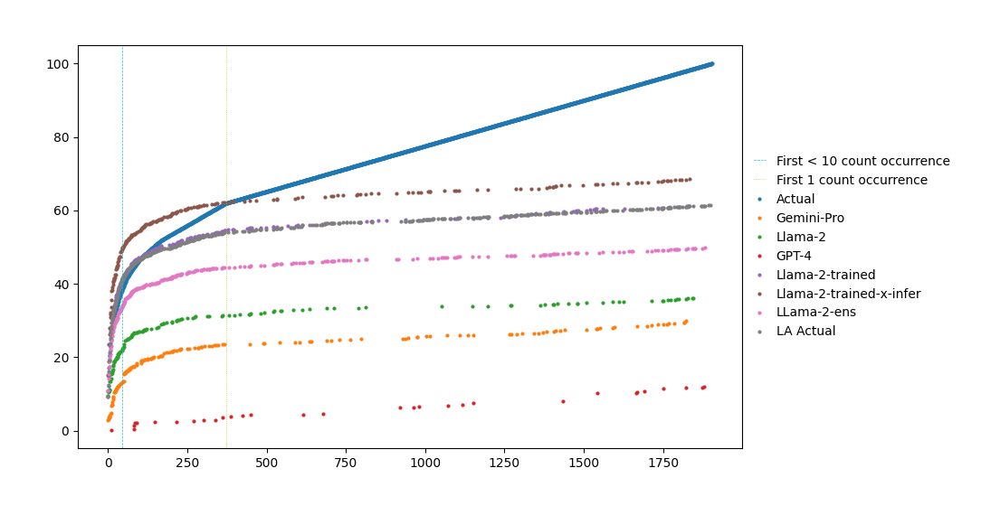

In [75]:
others = {
    'Gemini-Pro': t_sf_gemini,
    'Llama-2': t_sf_llama,
    'GPT-4': t_sf_gpt4,
    'Llama-2-trained': t_sf_llama_trained_large_3,
    'Llama-2-trained-x-infer': t_sf_llama_trained_large_exclude_infer_cities_1,
    'LLama-2-ens': t_sf_llama_ens,
    'LA-orig': data_t_la,
    # 'minneapolis-orig': data_t_minneapolis,
    # 'dfw-orig': data_t_dfw,
}

count_columns_names = ['count']
for k,v in others.items():
    count_columns_names.append(f'count_{k}')

chains_sf_partial = get_chains_df(
    data_t_sf,
    others,
    city='SF'
)

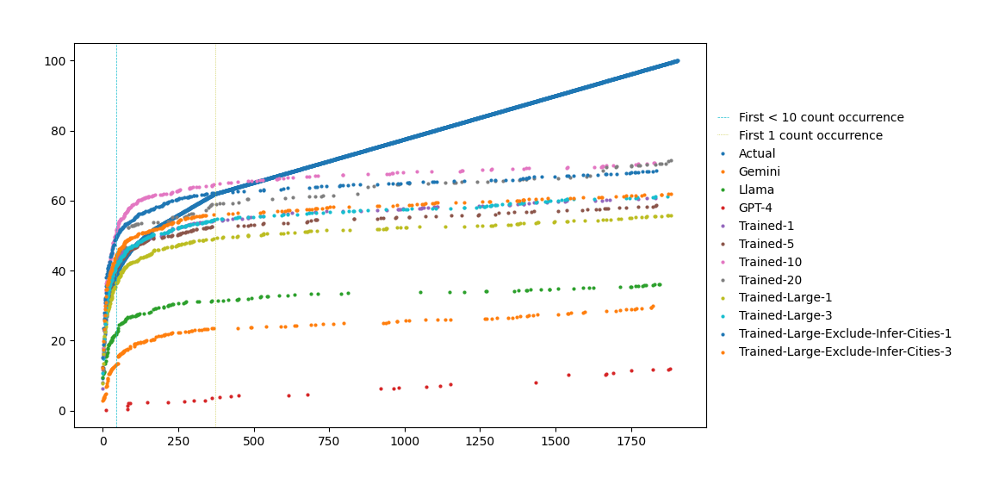

In [68]:
others = {
    'Gemini': t_sf_gemini,
    'Llama': t_sf_llama,
    'GPT-4': t_sf_gpt4,
    'Trained-1': t_sf_llama_trained_1,
    'Trained-5': t_sf_llama_trained_5,
    'Trained-10': t_sf_llama_trained_10,
    'Trained-20': t_sf_llama_trained_20,
    'Trained-Large-1': t_sf_llama_trained_large_1,
    'Trained-Large-3': t_sf_llama_trained_large_3,
    'Trained-Large-Exclude-Infer-Cities-1': t_sf_llama_trained_large_exclude_infer_cities_1,
    'Trained-Large-Exclude-Infer-Cities-3': t_sf_llama_trained_large_exclude_infer_cities_3,
}

count_columns_names = ['count']
for k,v in others.items():
    count_columns_names.append(f'count_{k}')


chains_sf = get_chains_df(
    data_t_sf,
    others,
    city='SF'
)

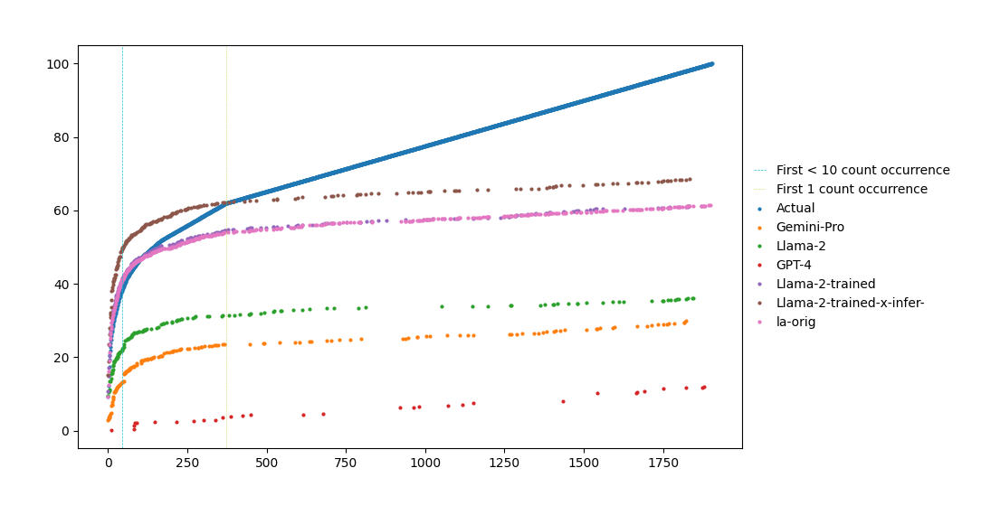

In [69]:
others = {
    'Gemini-Pro': t_sf_gemini,
    'Llama-2': t_sf_llama,
    'GPT-4': t_sf_gpt4,
    'Llama-2-trained': t_sf_llama_trained_large_3,
    'Llama-2-trained-x-infer-': t_sf_llama_trained_large_exclude_infer_cities_1,
    'la-orig': data_t_la,
    # 'minneapolis-orig': data_t_minneapolis,
    # 'dfw-orig': data_t_dfw,
}

chains_sf_partial = get_chains_df(
    data_t_sf,
    others,
    city='SF'
)

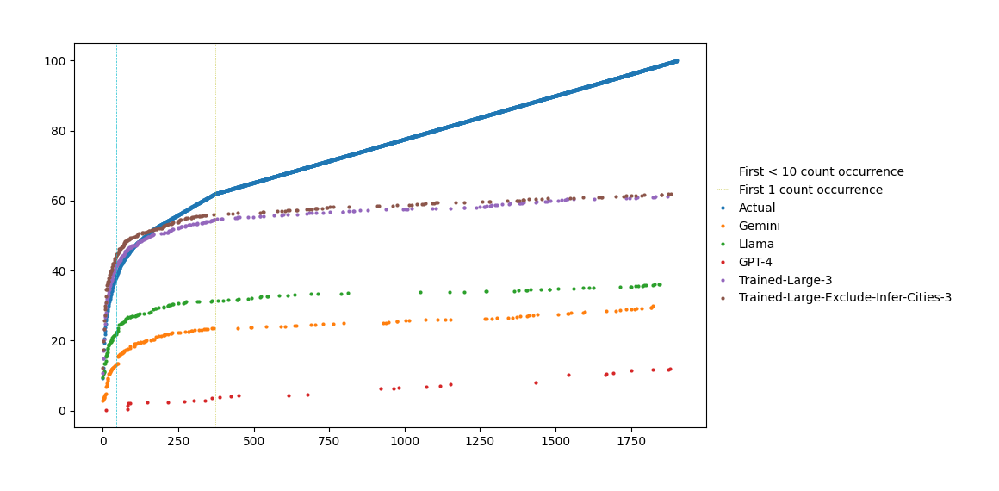

In [71]:
others = {
    'Gemini': t_sf_gemini,
    'Llama': t_sf_llama,
    'GPT-4': t_sf_gpt4,
    # 'Trained-1': t_sf_llama_trained_1,
    # 'Trained-5': t_sf_llama_trained_5,
    # 'Trained-10': t_sf_llama_trained_10,
    # 'Trained-20': t_sf_llama_trained_20,
    # 'Trained-Large-1': t_sf_llama_trained_large_1,
    'Trained-Large-3': t_sf_llama_trained_large_3,
    # 'Trained-Large-Exclude-Infer-Cities-1': t_sf_llama_trained_large_exclude_infer_cities_1,
    'Trained-Large-Exclude-Infer-Cities-3': t_sf_llama_trained_large_exclude_infer_cities_3,
}

count_columns_names = ['count']
for k,v in others.items():
    count_columns_names.append(f'count_{k}')


chains_sf = get_chains_df(
    data_t_sf,
    others,
    city='SF'
)

In [72]:
print(chains_sf[count_columns_names].corr()['count'])
print(chains_sf[count_columns_names].corr(method='spearman')['count'])

count                                         1.000000
count_Gemini                                  0.650618
count_Llama                                   0.886147
count_GPT-4                                  -0.084125
count_Trained-Large-3                         0.981230
count_Trained-Large-Exclude-Infer-Cities-3    0.975668
Name: count, dtype: float64
count                                         1.000000
count_Gemini                                  0.422750
count_Llama                                   0.618612
count_GPT-4                                  -0.055187
count_Trained-Large-3                         0.606018
count_Trained-Large-Exclude-Infer-Cities-3    0.640367
Name: count, dtype: float64


In [74]:
chains_sf_partial

,loc_type,count,cumsum_orig,count_num,count_rep,count_Gemini-Pro,cumsum_Gemini-Pro,count_Llama-2,cumsum_Llama-2,count_GPT-4,cumsum_GPT-4,count_Llama-2-trained,cumsum_Llama-2-trained,count_Llama-2-trained-x-infer-,cumsum_Llama-2-trained-x-infer-,count_la-orig,cumsum_la-orig
0,"(1, 2, 1)",9.187981,9.187981,370,None,2.739726,2.739726,9.460516,9.460516,NaN,NaN,10.812672,10.812672,15.224913,15.224913,9.360318,9.360318
1,"(1, 7, 1)",2.979886,12.167867,120,None,0.322321,3.062047,0.938233,10.398749,NaN,NaN,4.063361,14.876033,3.529412,18.754325,3.144199,12.504518
2,"(1, 5, 1)",2.756394,14.924261,111,None,0.483481,3.545528,0.390930,10.789679,NaN,NaN,2.341598,17.217631,4.775087,23.529412,3.722443,16.226961
3,"(1, 9, 1)",2.508071,17.432332,101,None,0.161160,3.706688,0.078186,10.867866,NaN,NaN,3.099174,20.316804,2.629758,26.159170,2.764727,18.991688
4,"(1, 10, 1)",1.812764,19.245096,73,None,0.161160,3.867849,0.312744,11.180610,NaN,NaN,2.892562,23.209366,1.799308,27.958478,2.403325,21.395013
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1900,"(1, 8, 1, 2, 8, 2, 1, 8, 1)",0.024832,99.900670,1,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1901,"(1, 7, 7, 7, 1, 11, 1)",0.024832,99.925503,1,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1902,"(1, 2, 2, 8, 2, 4, 10, 1)",0.024832,99.950335,1,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1903,"(1, 4, 4, 2, 1, 4, 1)",0.024832,99.975168,1,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [76]:
count_columns_names = ['count']
for k,v in others.items():
    count_columns_names.append(f'count_{k}')
print(chains_sf_partial[count_columns_names].corr()['count'])
print(chains_sf_partial[count_columns_names].corr(method='spearman')['count'])

count                            1.000000
count_Gemini-Pro                 0.650618
count_Llama-2                    0.886147
count_GPT-4                     -0.084125
count_Llama-2-trained            0.981230
count_Llama-2-trained-x-infer    0.971968
count_LLama-2-ens                0.970682
count_LA-orig                    0.986060
Name: count, dtype: float64
count                            1.000000
count_Gemini-Pro                 0.422750
count_Llama-2                    0.618612
count_GPT-4                     -0.055187
count_Llama-2-trained            0.606018
count_Llama-2-trained-x-infer    0.590066
count_LLama-2-ens                0.641844
count_LA-orig                    0.612904
Name: count, dtype: float64


In [77]:
def create_activity_chain_plots(df, count_columns_names, start_index=0, end_index=100, city='SF'):
    fig, axes = plt.subplots(nrows=len(count_columns_names)-1, ncols=1, figsize=(15, (len(count_columns_names)-1)*3.1))
    for i, col in enumerate(count_columns_names[1:]):
        ax = axes[i]
        bar1 = ax.bar(df[start_index:end_index].index, df[start_index:end_index]['count'], label='Actual', color=actual_color)
        bar2 = ax.bar(df[start_index:end_index].index, df[start_index:end_index][col], label=col.split('_')[-1], alpha=0.7, color=gemini_color)
        ax.legend(loc='upper right', bbox_to_anchor=(0.9, 1))
        ax.set_xlim(left=-1, right=end_index)
        for i, rect1 in enumerate(bar1):
            height1 = rect1.get_height()
            height2 = bar2[i].get_height()
            if np.isnan(height2):
                height2 = 0
            height = height1 if height1 > height2 else height2

            ax.text(rect1.get_x() + rect1.get_width() / 2.0, height, f'{df.iloc[i].loc_type}', ha='center', va='bottom', rotation=90, fontsize='small')
    plt.tight_layout()
    plt.show()

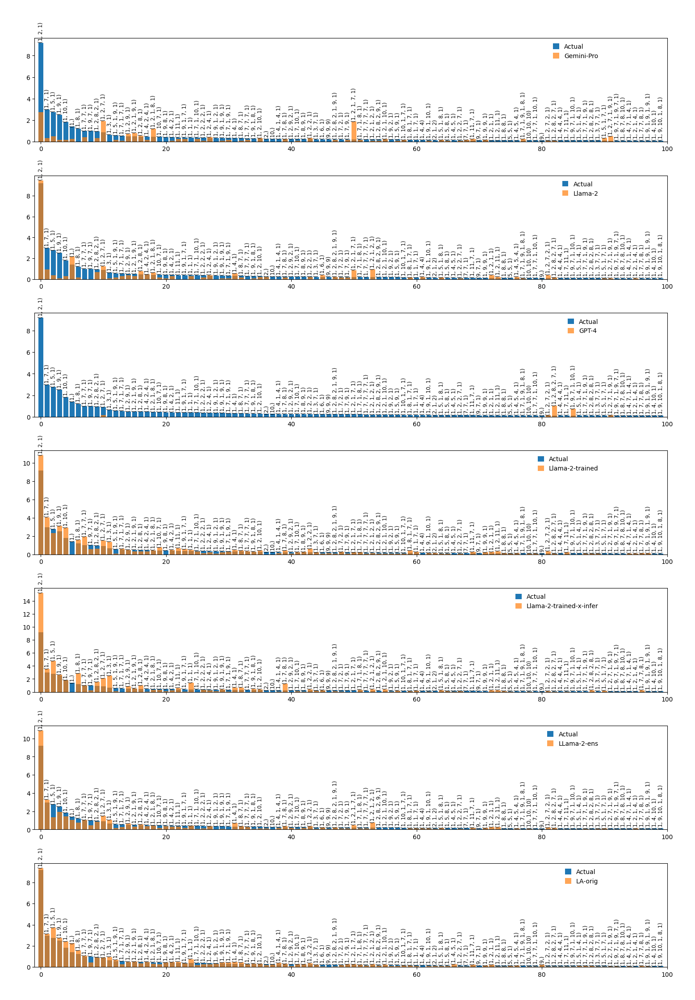

In [78]:
create_activity_chain_plots(chains_sf_partial, count_columns_names, city='SF')

In [79]:
count_columns_names

['count',
 'count_Gemini-Pro',
 'count_Llama-2',
 'count_GPT-4',
 'count_Llama-2-trained',
 'count_Llama-2-trained-x-infer',
 'count_LLama-2-ens',
 'count_LA-orig']

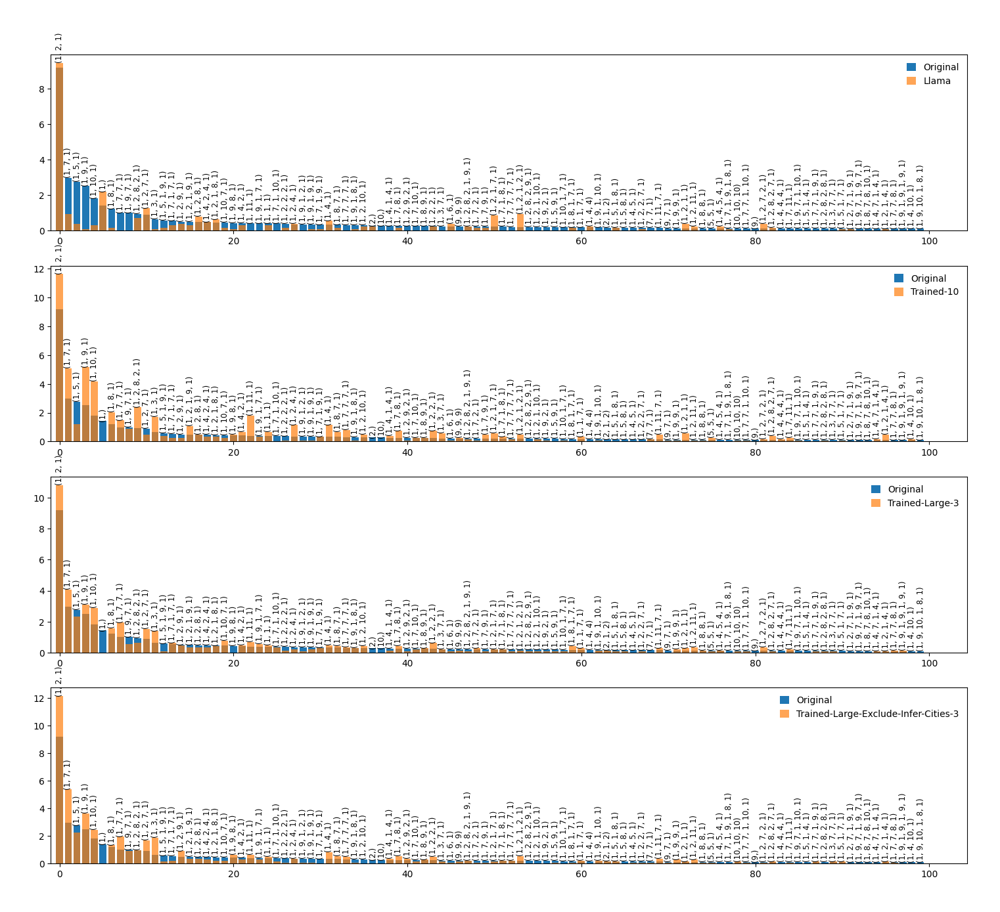

In [356]:
count_columns_names_partial = count_columns_names[:1] + count_columns_names[2:3] + count_columns_names[6:7] + count_columns_names[9:10] + count_columns_names[11:12]
create_activity_chain_plots(chains_sf, count_columns_names_partial, city='SF')

## All other generated cities

In [81]:
t_orig_prob_1_sf = get_transient_prob_1(data_t_sf, 'loc_type')
t_orig_prob_1_dc = get_transient_prob_1(data_t_dc, 'loc_type')
t_orig_prob_1_dfw = get_transient_prob_1(data_t_dfw, 'loc_type')
t_orig_prob_1_la = get_transient_prob_1(data_t_la, 'loc_type')
t_orig_prob_1_minneapolis = get_transient_prob_1(data_t_minneapolis, 'loc_type')

In [82]:
t_prob_1_dc_llama_trained_large_exclude_infer_cities_3 = get_transient_prob_1(t_dc_llama_trained_large_exclude_infer_cities_3, 'loc_type_new')
t_prob_1_dfw_llama_trained_large_exclude_infer_cities_3 = get_transient_prob_1(t_dfw_llama_trained_large_exclude_infer_cities_3, 'loc_type_new')
t_prob_1_la_llama_trained_large_exclude_infer_cities_3 = get_transient_prob_1(t_la_llama_trained_large_exclude_infer_cities_3, 'loc_type_new')
t_prob_1_minneapolis_llama_trained_large_exclude_infer_cities_3 = get_transient_prob_1(t_minneapolis_llama_trained_large_exclude_infer_cities_3, 'loc_type_new')

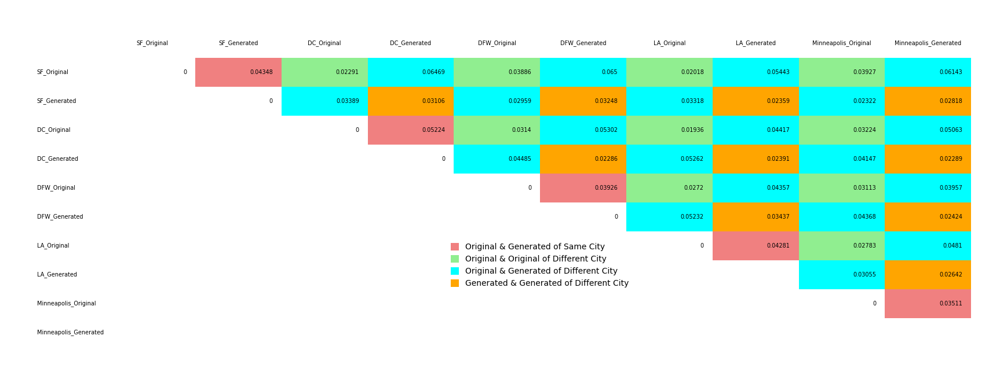

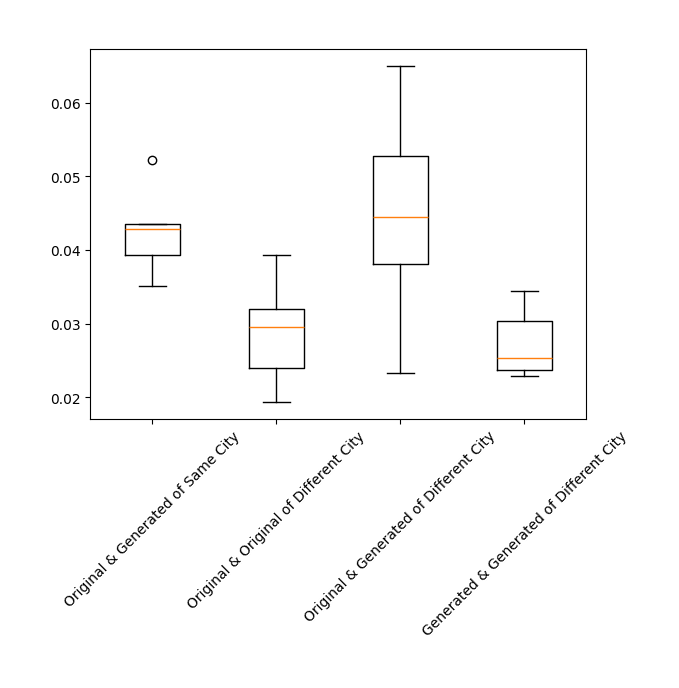

In [83]:
SOG, DOO, DOG, DGG , datadf = get_datadf_from_transient_probs(order=1, model='llama_trained_large_exclude_infer_cities_3')
datadf.to_pickle('inter_city_destination_probabilites_diff_llama_trained_large_exclude_infer_cities_3.pkl')
# datadf
plot_table_inter_city_norm_2(datadf, SOG, DOO, DOG, DGG)

#### Comparision with base llama model

In [192]:
t_sf_llama, ranks_sf_llama, relative_freqs_sf_llama = get_generated_survey_data_info(
    'outputs_processed/outputs_processed_completion_sf_llama.csv',
    'Generated SF',
    new_loc_type=True,
    pre_process=True
)


t_dc_llama, ranks_dc_llama, relative_freqs_dc_llama = get_generated_survey_data_info(
    'outputs_processed/outputs_processed_completion_dc_llama.csv',
    'Generated dc',
    new_loc_type=True,
    pre_process=True
)

t_dfw_llama, ranks_dfw_llama, relative_freqs_dfw_llama = get_generated_survey_data_info(
    'outputs_processed/outputs_processed_completion_dfw_llama.csv',
    'Generated dfw',
    new_loc_type=True,
    pre_process=True
)

t_la_llama, ranks_la_llama, relative_freqs_la_llama = get_generated_survey_data_info(
    'outputs_processed/outputs_processed_completion_la_llama.csv',
    'Generated la',
    new_loc_type=True,
    pre_process=True

)

t_minneapolis_llama, ranks_minneapolis_llama, relative_freqs_minneapolis_llama = get_generated_survey_data_info(
    'outputs_processed/outputs_processed_completion_minneapolis_llama.csv',
    'Generated minneapolis',
    new_loc_type=True,
    pre_process=True

)

t_prob_1_sf_llama = get_transient_prob_1(t_sf_llama, 'loc_type_new')
t_prob_1_dc_llama = get_transient_prob_1(t_dc_llama, 'loc_type_new')
t_prob_1_dfw_llama = get_transient_prob_1(t_dfw_llama, 'loc_type_new')
t_prob_1_la_llama = get_transient_prob_1(t_la_llama, 'loc_type_new')
t_prob_1_minneapolis_llama = get_transient_prob_1(t_minneapolis_llama, 'loc_type_new')

Generated SF
**************************************************
Average Location: 5.559812353401095
Median Location: 5.0
Number of samples: 1279
Travel time: 7.179538180155465
**************************************************
Generated dc
**************************************************
Average Location: 5.375
Median Location: 5.0
Number of samples: 1240
Travel time: 6.4300181653042685
**************************************************
Generated dfw
**************************************************
Average Location: 5.429661016949153
Median Location: 5.0
Number of samples: 1180
Travel time: 5.7561991869918705
**************************************************
Generated la
**************************************************
Average Location: 5.635918367346939
Median Location: 5.0
Number of samples: 1225
Travel time: 6.228321513002364
**************************************************
Generated minneapolis
**************************************************
Average Location: 5.73073666

In [85]:
t_prob_1_sf_gemini = get_transient_prob_1(t_sf_gemini, 'loc_type_new')
t_prob_1_dc_gemini = get_transient_prob_1(t_dc_gemini, 'loc_type_new')
t_prob_1_dfw_gemini = get_transient_prob_1(t_dfw_gemini, 'loc_type_new')
t_prob_1_la_gemini = get_transient_prob_1(t_la_gemini, 'loc_type_new')
t_prob_1_minneapolis_gemini = get_transient_prob_1(t_minneapolis_gemini, 'loc_type_new')

t_prob_1_sf_gpt4 = get_transient_prob_1(t_sf_gpt4, 'loc_type_new')
t_prob_1_dc_gpt4 = get_transient_prob_1(t_dc_gpt4, 'loc_type_new')
t_prob_1_dfw_gpt4 = get_transient_prob_1(t_dfw_gpt4, 'loc_type_new')
t_prob_1_la_gpt4 = get_transient_prob_1(t_la_gpt4, 'loc_type_new')
t_prob_1_minneapolis_gpt4 = get_transient_prob_1(t_minneapolis_gpt4, 'loc_type_new')

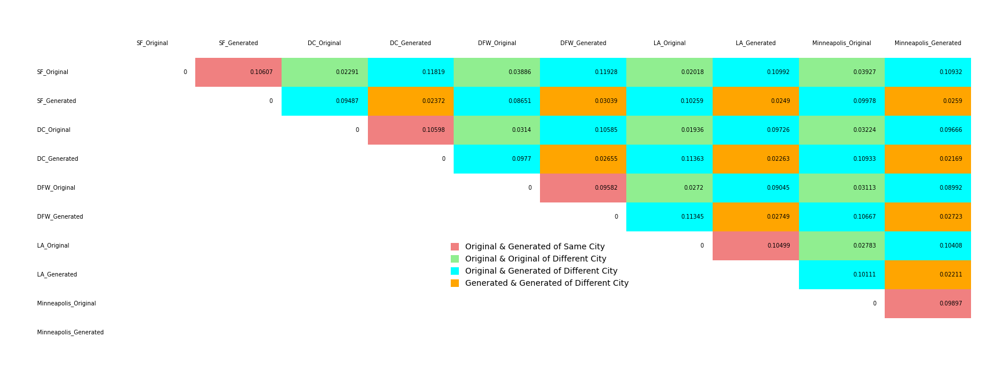

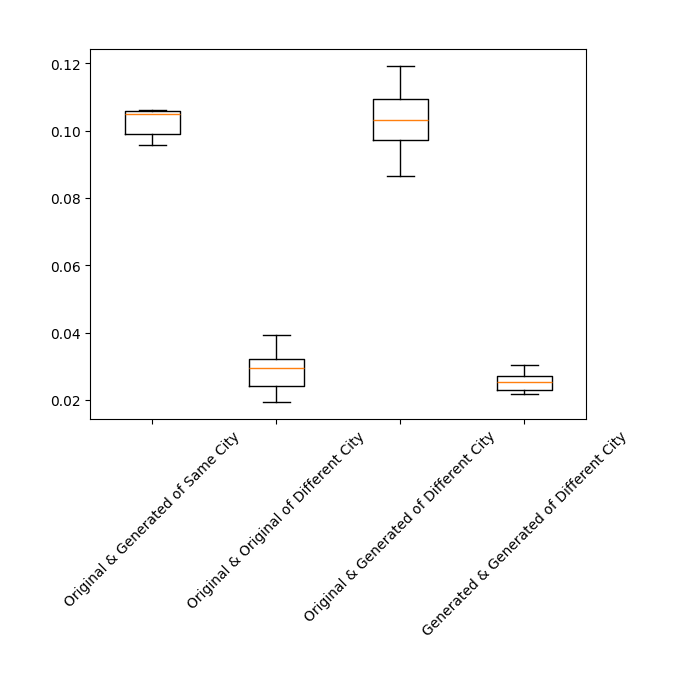

In [86]:
SOG_base, DOO_base, DOG_base, DGG_base , datadf_base = get_datadf_from_transient_probs(order=1, model='llama')
plot_table_inter_city_norm_2(datadf_base, SOG_base, DOO_base, DOG_base, DGG_base)

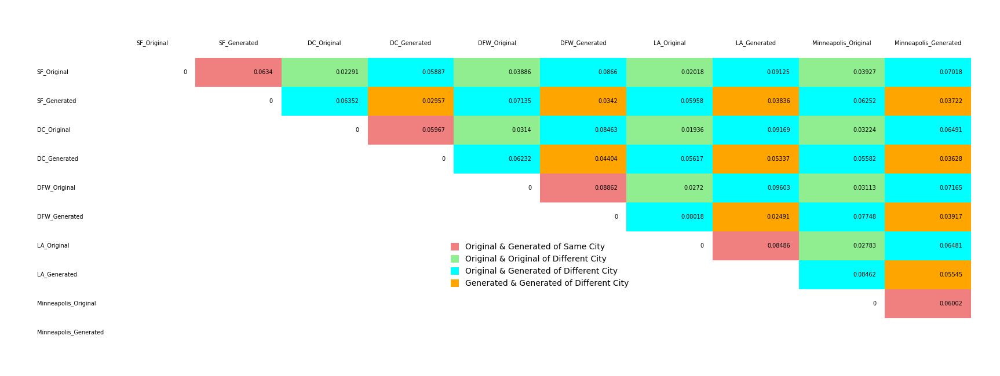

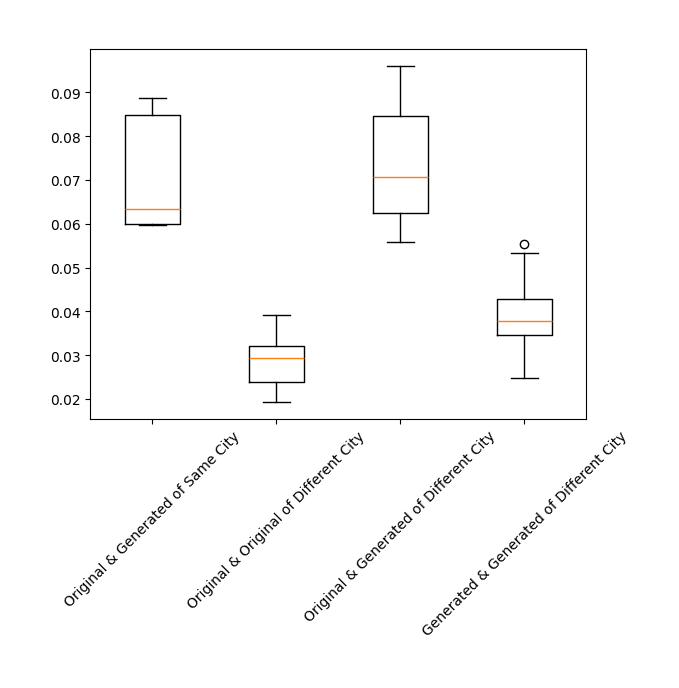

In [87]:
SOG_gemini, DOO_gemini, DOG_gemini, DGG_gemini , datadf_gemini = get_datadf_from_transient_probs(order=1, model='gemini')
plot_table_inter_city_norm_2(datadf_gemini, SOG_gemini, DOO_gemini, DOG_gemini, DGG_gemini)

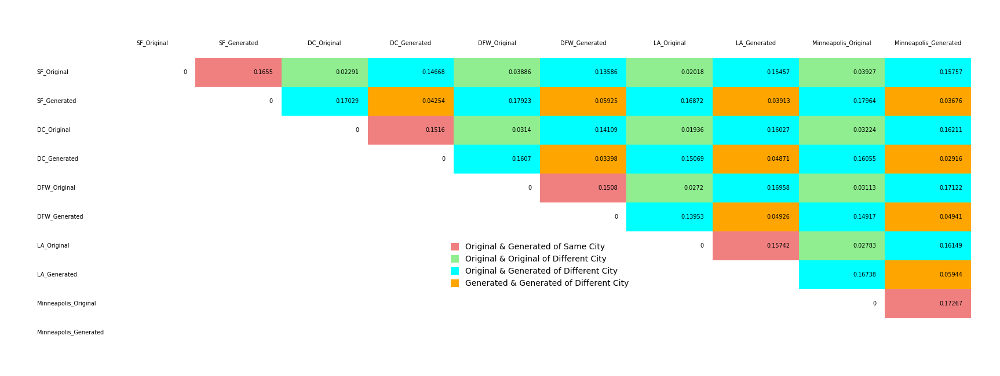

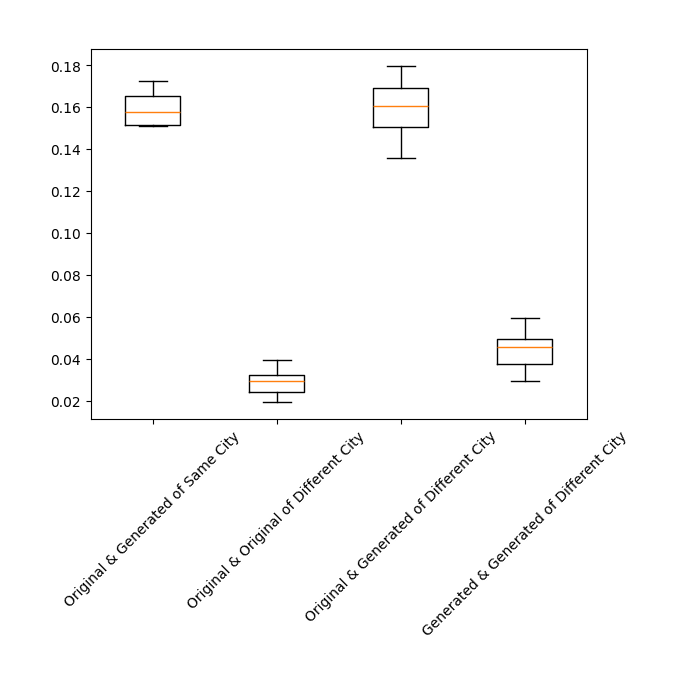

In [88]:
SOG_gpt4, DOO_gpt4, DOG_gpt4, DGG_gpt4 , datadf_gpt4 = get_datadf_from_transient_probs(order=1, model='gpt4')
plot_table_inter_city_norm_2(datadf_gpt4, SOG_gpt4, DOO_gpt4, DOG_gpt4, DGG_gpt4)

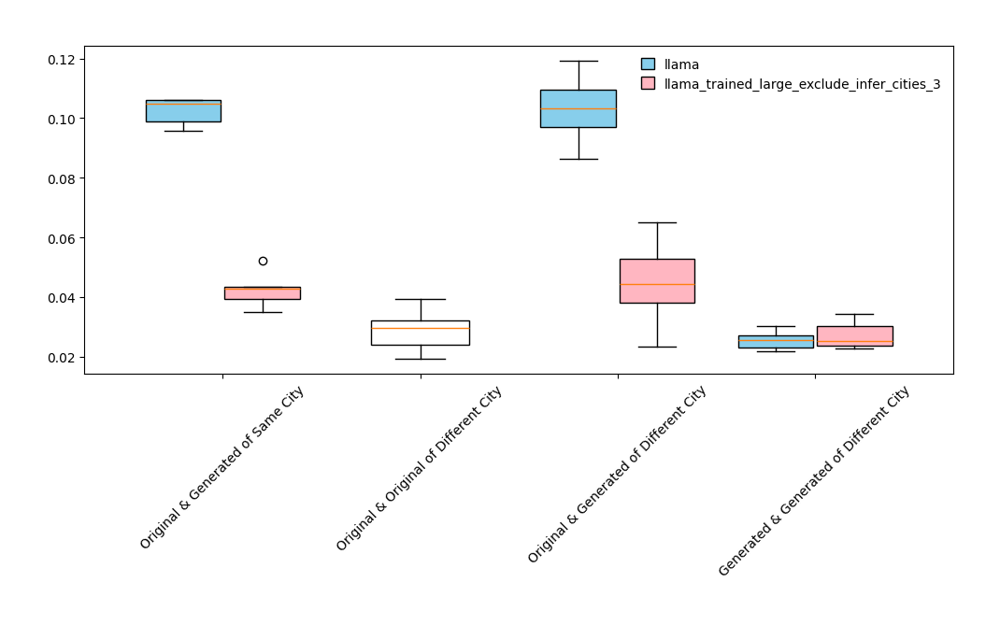

In [89]:
data1 = [SOG_base, [], DOG_base, DGG_base]
data2 = [SOG, [], DOG, DGG]

# Define the data for the second set of boxplots

data3 = [[], DOO_base, [], []]

# Define labels for the boxplots
labels = [
    'Original & Generated of Same City',
    'Original & Original of Different City',
    'Original & Generated of Different City',
    'Generated & Generated of Different City',
]

# Create boxplots with different colors
plt.figure(figsize=(10, 6))

box1 = plt.boxplot(
    data1,
    positions=[i - 0.2 for i in range(1, len(labels) + 1)],
    labels=labels,
    patch_artist=True,
    widths=0.38,
    boxprops=dict(
        # hatch='//',
        facecolor='skyblue'
    )
)
box2 = plt.boxplot(
    data2,
    positions=[i + 0.2 for i in range(1, len(labels) + 1)],
    labels=labels,
    patch_artist=True,
    widths=0.38,
    boxprops=dict(
        # hatch='..',
        facecolor='lightpink'
    )
)
box3 = plt.boxplot(
    data3,
    positions=[i  for i in range(1, len(labels) + 1)],
    labels=labels,
    patch_artist=True,
    widths=0.5,
    boxprops=dict(
        # hatch='.//.',
        facecolor='none'
    )
)
# box2 = plt.boxplot(data2, positions=[i + 0.2 for i in range(1, len(labels) + 1)], labels=None, patch_artist=True, boxprops=dict(hatch='..', facecolor='none'))
# box3 = plt.boxplot(data3, positions=[i for i in range(1, len(labels) + 1)], labels=None, patch_artist=True, boxprops=dict(facecolor='none', hatch='//..'))

x_positions = np.arange(len(labels)) + 1
plt.xticks(x_positions, labels, rotation=45)

legend_handles = [box1['boxes'][0], box2['boxes'][0]]
legend_labels = ['llama', 'llama_trained_large_exclude_infer_cities_3']
plt.legend(legend_handles, legend_labels, loc='best')

plt.tight_layout()
plt.show()

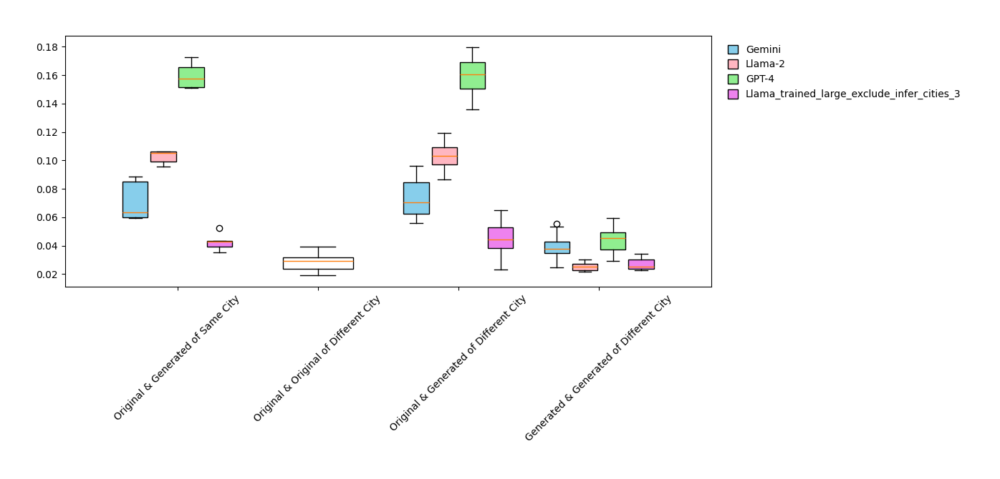

In [90]:
data1 = [SOG_gemini, [], DOG_gemini, DGG_gemini]
data2 = [SOG_base, [], DOG_base, DGG_base]
data3 = [SOG_gpt4, [], DOG_gpt4, DGG_gpt4]
data4 = [SOG, [], DOG, DGG]

# Define the data for the second set of boxplots

data5 = [[], DOO_base, [], []]

# Define labels for the boxplots
labels = [
    'Original & Generated of Same City',
    'Original & Original of Different City',
    'Original & Generated of Different City',
    'Generated & Generated of Different City',
]

# Create boxplots with different colors
plt.figure(figsize=(14, 6))

box1 = plt.boxplot(
    data1,
    positions=[i - 0.3 for i in range(1, len(labels) + 1)],
    labels=labels,
    patch_artist=True,
    widths=0.18,
    boxprops=dict(
        # hatch='//',
        facecolor='skyblue'
    )
)
box2 = plt.boxplot(
    data2,
    positions=[i - 0.1 for i in range(1, len(labels) + 1)],
    labels=labels,
    patch_artist=True,
    widths=0.18,
    boxprops=dict(
        # hatch='..',
        facecolor='lightpink'
    )
)
box3 = plt.boxplot(
    data3,
    positions=[i + 0.1 for i in range(1, len(labels) + 1)],
    labels=labels,
    patch_artist=True,
    widths=0.18,
    boxprops=dict(
        # hatch='//',
        facecolor='lightgreen'
    )
)
box4 = plt.boxplot(
    data4,
    positions=[i + 0.3 for i in range(1, len(labels) + 1)],
    labels=labels,
    patch_artist=True,
    widths=0.18,
    boxprops=dict(
        # hatch='..',
        facecolor='violet'
    )
)
box5 = plt.boxplot(
    data5,
    positions=[i  for i in range(1, len(labels) + 1)],
    labels=labels,
    patch_artist=True,
    widths=0.5,
    boxprops=dict(
        # hatch='.//.',
        facecolor='none'
    )
)
# box2 = plt.boxplot(data2, positions=[i + 0.2 for i in range(1, len(labels) + 1)], labels=None, patch_artist=True, boxprops=dict(hatch='..', facecolor='none'))
# box3 = plt.boxplot(data3, positions=[i for i in range(1, len(labels) + 1)], labels=None, patch_artist=True, boxprops=dict(facecolor='none', hatch='//..'))

x_positions = np.arange(len(labels)) + 1
plt.xticks(x_positions, labels, rotation=45)

legend_handles = [
    box1['boxes'][0],
    box2['boxes'][0],
    box3['boxes'][0],
    box4['boxes'][0]
]
legend_labels = [
    'Gemini',
    'Llama-2',
    'GPT-4',
    'Llama_trained_large_exclude_infer_cities_3'
]
# plt.legend(legend_handles, legend_labels, loc='best')
plt.legend(legend_handles, legend_labels, loc='upper right', bbox_to_anchor=(1.4, 1))

plt.tight_layout()
plt.show()

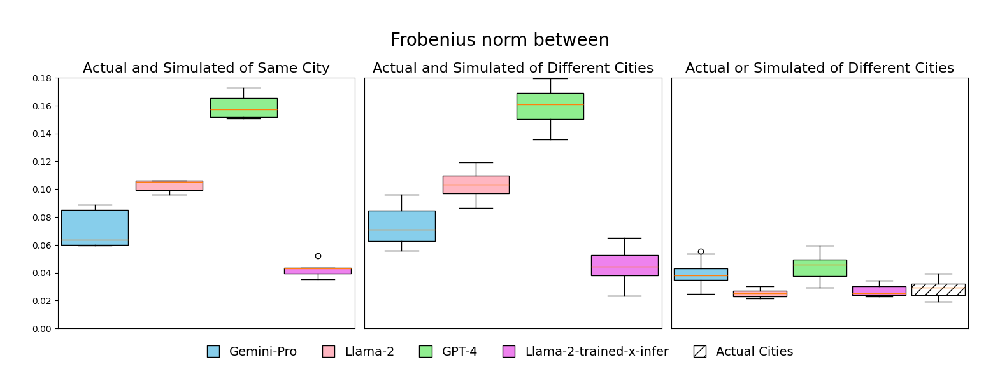

In [213]:
data_1 = [SOG_gemini, SOG_base, SOG_gpt4, SOG]
data_2 = [DOO_base]
data_3 = [DOG_gemini, DOG_base, DOG_gpt4, DOG]
data_4 = [DGG_gemini, DGG_base, DGG_gpt4, DGG]
y_lim = 0.18

# Define labels for the boxplots
labels = [
    'Original & Generated of Same City',
    'Original & Original of Different City',
    'Original & Generated of Different City',
    'Generated & Generated of Different City',
]



fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(15, 5))
# Create boxplots with different colors
# plt.figure(figsize=(14, 6))

box1_0 = axes[0].boxplot(
    data_1[0],
    positions=[1 - 0.3],
    patch_artist=True,
    widths=0.18,
    boxprops=dict(
        facecolor='skyblue'
    )
)
box1_1 = axes[0].boxplot(
    data_1[1],
    positions=[1 - 0.1 ],
    patch_artist=True,
    widths=0.18,
    boxprops=dict(
        facecolor='lightpink'
    )
)
box1_2 = axes[0].boxplot(
    data_1[2],
    positions=[1 + 0.1 ],
    patch_artist=True,
    widths=0.18,
    boxprops=dict(
        facecolor='lightgreen'
    )
)
box1_3 = axes[0].boxplot(
    data_1[3],
    positions=[1 + 0.3],
    patch_artist=True,
    widths=0.18,
    boxprops=dict(
        facecolor='violet'
    )
)
axes[0].set_xlim(left=0.6, right=1.4)
axes[0].set_ylim(0, y_lim)
axes[0].set_xticks([])
axes[0].set_title('Actual and Simulated of Same City', fontsize=16)

box2_0 = axes[1].boxplot(
    data_3[0],
    positions=[1 - 0.3],
    patch_artist=True,
    widths=0.18,
    boxprops=dict(
        facecolor='skyblue'
    )
)
box2_1 = axes[1].boxplot(
    data_3[1],
    positions=[1 - 0.1 ],
    patch_artist=True,
    widths=0.18,
    boxprops=dict(
        facecolor='lightpink'
    )
)
box2_2 = axes[1].boxplot(
    data_3[2],
    positions=[1 + 0.1 ],
    patch_artist=True,
    widths=0.18,
    boxprops=dict(
        facecolor='lightgreen'
    )
)
box2_3 = axes[1].boxplot(
    data_3[3],
    positions=[1 + 0.3],
    patch_artist=True,
    widths=0.18,
    boxprops=dict(
        facecolor='violet'
    )
)
axes[1].set_xlim(left=0.6, right=1.4)
axes[1].set_xticks([])
axes[1].set_yticks([])
axes[1].set_ylim(0, y_lim)
axes[1].set_title('Actual and Simulated of Different Cities', fontsize=16)

box3_0 = axes[2].boxplot(
    data_4[0],
    positions=[1 - 0.3],
    patch_artist=True,
    widths=0.18,
    boxprops=dict(
        facecolor='skyblue'
    )
)
box3_1 = axes[2].boxplot(
    data_4[1],
    positions=[1 - 0.1 ],
    patch_artist=True,
    widths=0.18,
    boxprops=dict(
        facecolor='lightpink'
    )
)
box3_2 = axes[2].boxplot(
    data_4[2],
    positions=[1 + 0.1 ],
    patch_artist=True,
    widths=0.18,
    boxprops=dict(
        facecolor='lightgreen'
    )
)
box3_3 = axes[2].boxplot(
    data_4[3],
    positions=[1 + 0.3],
    patch_artist=True,
    widths=0.18,
    boxprops=dict(
        facecolor='violet'
    )
)
box3_4 = axes[2].boxplot(
    data_2[0],
    positions=[1 + 0.5],
    patch_artist=True,
    widths=0.18,
    boxprops=dict(
        facecolor='none',
        hatch='//'
    )
)
axes[2].set_xlim(left=0.6, right=1.6)
axes[2].set_ylim(0, y_lim)
axes[2].set_xticks([])
axes[2].set_yticks([])
axes[2].set_title('Actual or Simulated of Different Cities', fontsize=16)

legend_handles = [
    box1_0['boxes'][0],
    box1_1['boxes'][0],
    box1_2['boxes'][0],
    box1_3['boxes'][0],
    box3_4['boxes'][0],
]
legend_labels = [
    'Gemini-Pro',
    'Llama-2',
    'GPT-4',
    'Llama-2-trained-x-infer',
    'Actual Cities'
]
fig.legend(legend_handles, legend_labels, loc='lower center', ncols=5, prop={'size': 14})
# plt.legend(legend_handles, legend_labels, loc='upper right', bbox_to_anchor=(1.4, 1))
fig.suptitle('Frobenius norm between', fontsize=20)

fig.tight_layout()
plt.show()

### Clusturing

Kmeans
[1 1 0 1 1]
Agglomerative
[1 1 0 1 0]


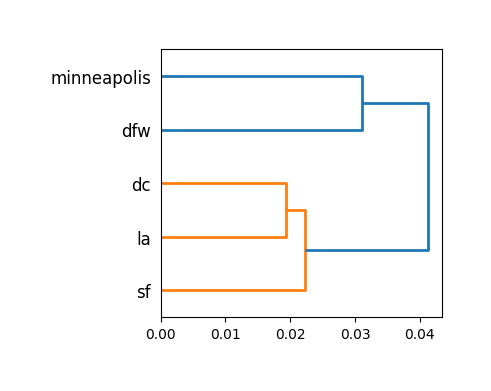

In [214]:
original_vals = {
    'sf': t_orig_prob_1_sf,
    'dc': t_orig_prob_1_dc,
    'dfw': t_orig_prob_1_dfw,
    'la': t_orig_prob_1_la,
    'minneapolis': t_orig_prob_1_minneapolis,
}
for k,v in original_vals.items():
    original_vals[k] = list((v /v.sum().sum()).values.flatten())
plotting_the_dendogram(list(original_vals.values()), list(original_vals.keys()))
X = list(original_vals.values())
kmeans = KMeans(n_clusters=2, random_state=0, n_init="auto").fit(X)
print('Kmeans')
print(kmeans.labels_)
X = list(original_vals.values())
clusturing = AgglomerativeClustering(2, linkage='ward').fit(X)
print('Agglomerative')
print(clusturing.labels_)

Kmeans
[0 1 0 0 1]
Agglomerative
[0 0 1 1 0]


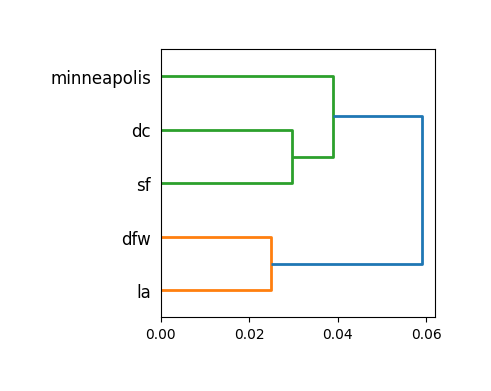

In [215]:
generated_vals_gemini = {
    'sf': t_prob_1_sf_gemini,
    'dc': t_prob_1_dc_gemini,
    'dfw': t_prob_1_dfw_gemini,
    'la': t_prob_1_la_gemini,
    'minneapolis': t_prob_1_minneapolis_gemini,
}
for k,v in generated_vals_gemini.items():
    generated_vals_gemini[k] = list((v /v.sum().sum()).values.flatten())
plotting_the_dendogram(list(generated_vals_gemini.values()), list(generated_vals_gemini.keys()))
X = list(generated_vals_gemini.values())
kmeans = KMeans(n_clusters=2, random_state=0, n_init="auto").fit(X)
print('Kmeans')
print(kmeans.labels_)
X = list(generated_vals_gemini.values())
clusturing = AgglomerativeClustering(2, linkage='ward').fit(X)
print('Agglomerative')
print(clusturing.labels_)

Kmeans
[1 1 0 1 1]
Agglomerative
[0 0 1 0 0]


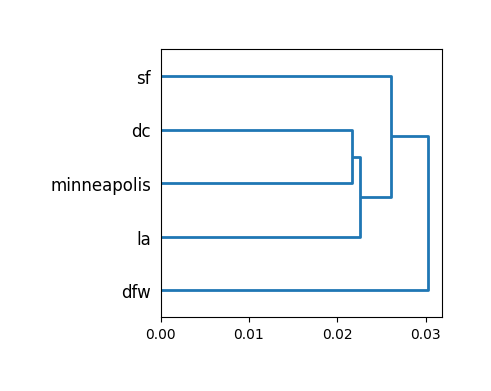

In [216]:
generated_vals_llama = {
    'sf': t_prob_1_sf_llama,
    'dc': t_prob_1_dc_llama,
    'dfw': t_prob_1_dfw_llama,
    'la': t_prob_1_la_llama,
    'minneapolis': t_prob_1_minneapolis_llama,
}
for k,v in generated_vals_llama.items():
    generated_vals_llama[k] = list((v /v.sum().sum()).values.flatten())
plotting_the_dendogram(list(generated_vals_llama.values()), list(generated_vals_llama.keys()))
X = list(generated_vals_llama.values())
kmeans = KMeans(n_clusters=2, random_state=0, n_init="auto").fit(X)
print('Kmeans')
print(kmeans.labels_)
X = list(generated_vals_llama.values())
clusturing = AgglomerativeClustering(2, linkage='ward').fit(X)
print('Agglomerative')
print(clusturing.labels_)

Kmeans
[1 0 0 1 0]
Agglomerative
[1 0 0 1 0]


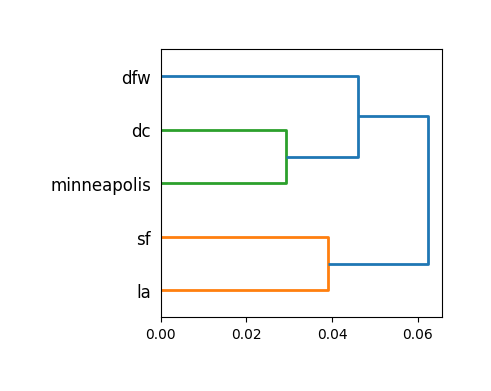

In [217]:
generated_vals_gpt4 = {
    'sf': t_prob_1_sf_gpt4,
    'dc': t_prob_1_dc_gpt4,
    'dfw': t_prob_1_dfw_gpt4,
    'la': t_prob_1_la_gpt4,
    'minneapolis': t_prob_1_minneapolis_gpt4,
}
for k,v in generated_vals_gpt4.items():
    generated_vals_gpt4[k] = list((v /v.sum().sum()).values.flatten())
plotting_the_dendogram(list(generated_vals_gpt4.values()), list(generated_vals_gpt4.keys()))
X = list(generated_vals_gpt4.values())
kmeans = KMeans(n_clusters=2, random_state=0, n_init="auto").fit(X)
print('Kmeans')
print(kmeans.labels_)
X = list(generated_vals_gpt4.values())
clusturing = AgglomerativeClustering(2, linkage='ward').fit(X)
print('Agglomerative')
print(clusturing.labels_)

Kmeans
[1 0 0 1 0]
Agglomerative
[1 0 0 1 0]


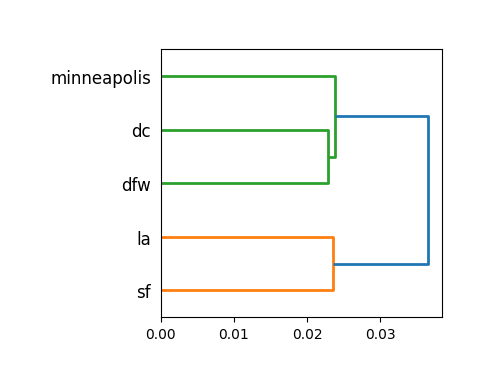

In [218]:
generated_vals_llama_trained_large_exclude_infer_cities_3 = {
    'sf': t_prob_1_sf_llama_trained_large_exclude_infer_cities_3,
    'dc': t_prob_1_dc_llama_trained_large_exclude_infer_cities_3,
    'dfw': t_prob_1_dfw_llama_trained_large_exclude_infer_cities_3,
    'la': t_prob_1_la_llama_trained_large_exclude_infer_cities_3,
    'minneapolis': t_prob_1_minneapolis_llama_trained_large_exclude_infer_cities_3,
}
for k,v in generated_vals_llama_trained_large_exclude_infer_cities_3.items():
    generated_vals_llama_trained_large_exclude_infer_cities_3[k] = list((v /v.sum().sum()).values.flatten())
plotting_the_dendogram(list(generated_vals_llama_trained_large_exclude_infer_cities_3.values()), list(generated_vals_llama_trained_large_exclude_infer_cities_3.keys()))
X = list(generated_vals_llama_trained_large_exclude_infer_cities_3.values())
kmeans = KMeans(n_clusters=2, random_state=0, n_init="auto").fit(X)
print('Kmeans')
print(kmeans.labels_)
X = list(generated_vals_llama_trained_large_exclude_infer_cities_3.values())
clusturing = AgglomerativeClustering(2, linkage='ward').fit(X)
print('Agglomerative')
print(clusturing.labels_)

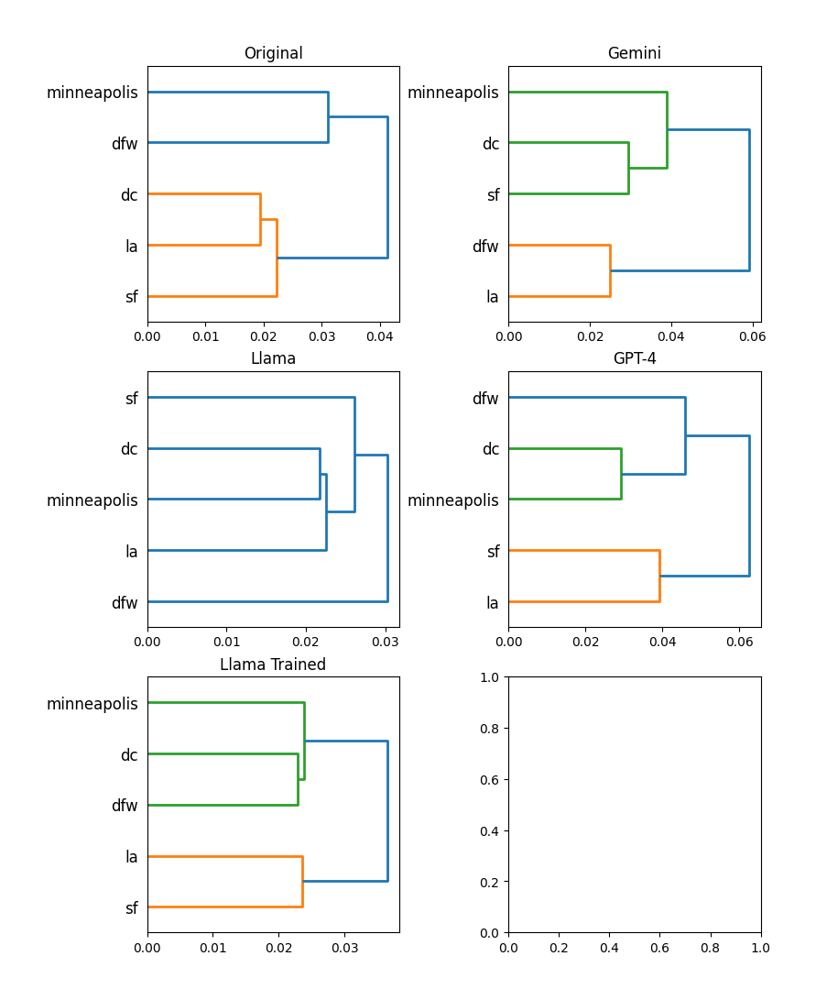

In [134]:
# Calculate the linkage matrix
Z_original = sch.linkage(
    list(original_vals.values()),
    method="ward",
    optimal_ordering=True
)

Z_gemini = sch.linkage(
    list(generated_vals_gemini.values()),
    method="ward",
    optimal_ordering=True
)

Z_llama = sch.linkage(
    list(generated_vals_llama.values()),
    method="ward",
    optimal_ordering=True
)

Z_gpt4 = sch.linkage(
    list(generated_vals_gpt4.values()),
    method="ward",
    optimal_ordering=True
)

Z_llama_trained_large_exclude_infer_cities_3 = sch.linkage(
    list(generated_vals_llama_trained_large_exclude_infer_cities_3.values()),
    method="ward",
    optimal_ordering=True
)

# Override the default linewidth.
plt.rcParams['lines.linewidth'] = 2

fig, ((ax0, ax1), (ax2, ax3), (ax4, ax5)) = plt.subplots(3, 2, constrained_layout=True, figsize=(8, 10))

# --- Plotting the dendogram
S_original = sch.dendrogram(
    Z_original,
    ax=ax0,
    labels=list(original_vals.keys()),
    orientation="right"
)

S_gemini = sch.dendrogram(
    Z_gemini,
    ax=ax1,
    labels=list(generated_vals_gemini.keys()),
    orientation="right"
)

S_llama = sch.dendrogram(
    Z_llama,
    ax=ax2,
    labels=list(generated_vals_llama.keys()),
    orientation="right"
)

S_gpt4 = sch.dendrogram(
    Z_gpt4,
    ax=ax3,
    labels=list(generated_vals_gpt4.keys()),
    orientation="right"
)

S_llama_trained_large_exclude_infer_cities_3 = sch.dendrogram(
    Z_llama_trained_large_exclude_infer_cities_3,
    ax=ax4,
    labels=list(generated_vals_llama_trained_large_exclude_infer_cities_3.keys()),
    orientation="right"
)

ax0.set_title("Original")
ax1.set_title("Gemini")
ax2.set_title("Llama")
ax3.set_title("GPT-4")
ax4.set_title("Llama Trained")

plt.show()

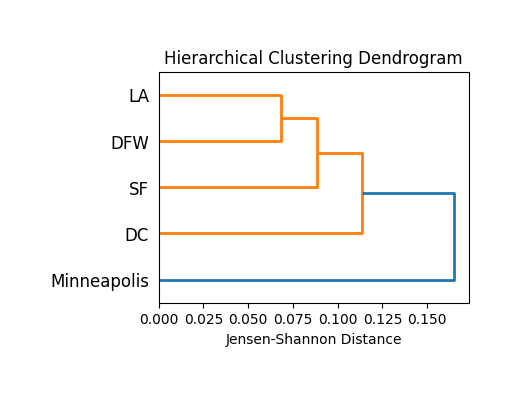

Cluster assignments: [1 1 1 1 1]


In [86]:
matrices = [
    t_orig_prob_1_sf.to_numpy(),
    t_orig_prob_1_dc.to_numpy(),
    t_orig_prob_1_dfw.to_numpy(),
    t_orig_prob_1_la.to_numpy(),
    t_orig_prob_1_minneapolis.to_numpy(),
]
plotting_the_dendogram_JS(matrices)

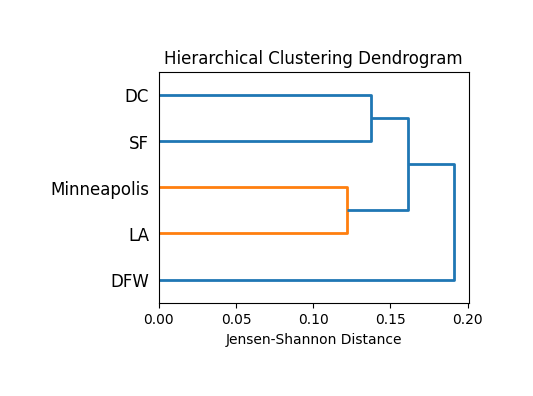

Cluster assignments: [1 1 1 1 1]


In [87]:
matrices = [
    t_prob_1_sf_llama_trained_large_exclude_infer_cities_3.to_numpy(),
    t_prob_1_dc_llama_trained_large_exclude_infer_cities_3.to_numpy(),
    t_prob_1_dfw_llama_trained_large_exclude_infer_cities_3.to_numpy(),
    t_prob_1_la_llama_trained_large_exclude_infer_cities_3.to_numpy(),
    t_prob_1_minneapolis_llama_trained_large_exclude_infer_cities_3.to_numpy(),
]
plotting_the_dendogram_JS(matrices)